In [148]:
import warnings
from datetime import datetime
from sklearn.model_selection import train_test_split
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import seaborn as sns
!pip install pmdarima
from pmdarima import auto_arima
!pip install statsmodels
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
from keras.models import Sequential
from keras.layers import LSTM, Dense
from sklearn.preprocessing import MinMaxScaler
from sklearn.cluster import KMeans
from sklearn.metrics import mean_squared_error, mean_absolute_error,r2_score
!pip install keras-tuner
import tensorflow as tf
from keras_tuner import RandomSearch
from sklearn.model_selection import KFold
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.model_selection import TimeSeriesSplit
# Suppress warnings
warnings.filterwarnings("ignore")


[notice] A new release of pip is available: 24.0 -> 24.2
[notice] To update, run: python.exe -m pip install --upgrade pip



[notice] A new release of pip is available: 24.0 -> 24.2
[notice] To update, run: python.exe -m pip install --upgrade pip



[notice] A new release of pip is available: 24.0 -> 24.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [149]:
# Load the dataset
# Load the dataset
file_path = '/mnt/data/Customer360Insights.csv'
data = pd.read_csv('Customer360Insights.csv')

In [150]:
# Validate if the data is loaded correctly
if not isinstance(data, pd.DataFrame):
    raise TypeError("The data is not loaded as a DataFrame. Please check the file path and format.")

In [151]:
# Display the first few rows
print(data.head())

       SessionStart  CustomerID           FullName  Gender  Age  CreditScore  \
0  01/01/2019 02:42        1001  Brittany Franklin    Male   57          780   
1  02/01/2019 20:35        1002      Scott Stewart  Female   69          746   
2  04/01/2019 03:11        1003   Elizabeth Fowler  Female   21          772   
3  05/01/2019 09:01        1004        Julian Wall  Female   67          631   
4  05/01/2019 13:35        1005      James Simmons    Male   57          630   

   MonthlyIncome Country      State        City  ... Price Quantity  \
0           7591   China  Guangdong    Dongguan  ...    50        4   
1           3912   China   Shandong      Yantai  ...    80        6   
2           7460      UK    England  Birmingham  ...    20        2   
3           4765      UK    England  Birmingham  ...    20        2   
4           3268   China   Shandong      Yantai  ...   100        6   

     CampaignSchema   CartAdditionTime  OrderConfirmation  \
0      Instagram-ads  01/01/201

In [152]:
data.shape

(2000, 23)

In [153]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 23 columns):
 #   Column                 Non-Null Count  Dtype 
---  ------                 --------------  ----- 
 0   SessionStart           2000 non-null   object
 1   CustomerID             2000 non-null   int64 
 2   FullName               2000 non-null   object
 3   Gender                 2000 non-null   object
 4   Age                    2000 non-null   int64 
 5   CreditScore            2000 non-null   int64 
 6   MonthlyIncome          2000 non-null   int64 
 7   Country                2000 non-null   object
 8   State                  2000 non-null   object
 9   City                   2000 non-null   object
 10  Category               2000 non-null   object
 11  Product                2000 non-null   object
 12  Cost                   2000 non-null   int64 
 13  Price                  2000 non-null   int64 
 14  Quantity               2000 non-null   int64 
 15  CampaignSchema       

In [154]:
data.columns

Index(['SessionStart', 'CustomerID', 'FullName', 'Gender', 'Age',
       'CreditScore', 'MonthlyIncome', 'Country', 'State', 'City', 'Category',
       'Product', 'Cost', 'Price', 'Quantity', 'CampaignSchema ',
       'CartAdditionTime', 'OrderConfirmation', 'OrderConfirmationTime',
       'PaymentMethod', 'SessionEnd', 'OrderReturn', 'ReturnReason'],
      dtype='object')

In [155]:
# Get the number of rows in the dataset
num_rows = data.shape[0]
num_rows

2000

In [156]:
# Check for null values
null_values = data.isnull().sum()
print("Null values in each column:")
print(null_values)

Null values in each column:
SessionStart                0
CustomerID                  0
FullName                    0
Gender                      0
Age                         0
CreditScore                 0
MonthlyIncome               0
Country                     0
State                       0
City                        0
Category                    0
Product                     0
Cost                        0
Price                       0
Quantity                    0
CampaignSchema              0
CartAdditionTime            0
OrderConfirmation           0
OrderConfirmationTime     300
PaymentMethod             300
SessionEnd                  0
OrderReturn               300
ReturnReason             1764
dtype: int64


In [157]:
# Check for missing values represented as empty strings or placeholders (e.g., "NA", "None")
missing_values_placeholder = data.isin(['', 'NA', 'None']).sum()
print("Missing values (placeholders) in each column:")
print(missing_values_placeholder)

Missing values (placeholders) in each column:
SessionStart             0
CustomerID               0
FullName                 0
Gender                   0
Age                      0
CreditScore              0
MonthlyIncome            0
Country                  0
State                    0
City                     0
Category                 0
Product                  0
Cost                     0
Price                    0
Quantity                 0
CampaignSchema           0
CartAdditionTime         0
OrderConfirmation        0
OrderConfirmationTime    0
PaymentMethod            0
SessionEnd               0
OrderReturn              0
ReturnReason             0
dtype: int64


In [158]:
# Check for duplicate rows
duplicates = data.duplicated().sum()
print(f"Number of duplicate rows: {duplicates}")

Number of duplicate rows: 0


In [159]:
# Convert date and time columns to datetime objects
date_columns = ['SessionStart', 'CartAdditionTime', 'OrderConfirmationTime', 'SessionEnd']
for col in date_columns:
    data[col] = pd.to_datetime(data[col], dayfirst=True, errors='coerce')

In [160]:
# Display the first few rows after conversion
print(data[date_columns].head())

         SessionStart    CartAdditionTime OrderConfirmationTime  \
0 2019-01-01 02:42:00 2019-01-01 02:49:00   2019-01-01 03:02:00   
1 2019-01-02 20:35:00 2019-01-02 20:50:00   2019-01-02 20:58:00   
2 2019-01-04 03:11:00 2019-01-04 03:30:00   2019-01-04 03:40:00   
3 2019-01-05 09:01:00 2019-01-05 09:17:00   2019-01-05 09:26:00   
4 2019-01-05 13:35:00 2019-01-05 13:40:00   2019-01-05 13:52:00   

           SessionEnd  
0 2019-01-01 02:53:00  
1 2019-01-02 20:54:00  
2 2019-01-04 03:35:00  
3 2019-01-05 09:20:00  
4 2019-01-05 13:42:00  


In [161]:
# Drop rows with any NA values in date columns
data = data.dropna(subset=date_columns)

# Display the first few rows after dropping NA
print(data[date_columns].head())

         SessionStart    CartAdditionTime OrderConfirmationTime  \
0 2019-01-01 02:42:00 2019-01-01 02:49:00   2019-01-01 03:02:00   
1 2019-01-02 20:35:00 2019-01-02 20:50:00   2019-01-02 20:58:00   
2 2019-01-04 03:11:00 2019-01-04 03:30:00   2019-01-04 03:40:00   
3 2019-01-05 09:01:00 2019-01-05 09:17:00   2019-01-05 09:26:00   
4 2019-01-05 13:35:00 2019-01-05 13:40:00   2019-01-05 13:52:00   

           SessionEnd  
0 2019-01-01 02:53:00  
1 2019-01-02 20:54:00  
2 2019-01-04 03:35:00  
3 2019-01-05 09:20:00  
4 2019-01-05 13:42:00  


In [162]:
# Handle missing values for numerical columns using median
numerical_columns = data.select_dtypes(include=['float64', 'int64']).columns
for column in numerical_columns:
    data[column] = data[column].fillna(data[column].median())

In [163]:
# Handle missing values for categorical columns using mode
categorical_columns = data.select_dtypes(include=['object']).columns
for column in categorical_columns:
    data[column] = data[column].fillna(data[column].mode()[0])
    data[column] = data[column].infer_objects(copy=False)

In [164]:
# Handle missing values for date columns using forward fill
data[date_columns] = data[date_columns].ffill()

In [165]:
# Check for null values
null_values = data.isnull().sum()
print("Null values in each column:")
print(null_values)

Null values in each column:
SessionStart             0
CustomerID               0
FullName                 0
Gender                   0
Age                      0
CreditScore              0
MonthlyIncome            0
Country                  0
State                    0
City                     0
Category                 0
Product                  0
Cost                     0
Price                    0
Quantity                 0
CampaignSchema           0
CartAdditionTime         0
OrderConfirmation        0
OrderConfirmationTime    0
PaymentMethod            0
SessionEnd               0
OrderReturn              0
ReturnReason             0
dtype: int64


In [166]:
# Display the first few rows
print(data.head())

         SessionStart  CustomerID           FullName  Gender  Age  \
0 2019-01-01 02:42:00        1001  Brittany Franklin    Male   57   
1 2019-01-02 20:35:00        1002      Scott Stewart  Female   69   
2 2019-01-04 03:11:00        1003   Elizabeth Fowler  Female   21   
3 2019-01-05 09:01:00        1004        Julian Wall  Female   67   
4 2019-01-05 13:35:00        1005      James Simmons    Male   57   

   CreditScore  MonthlyIncome Country      State        City  ... Price  \
0          780           7591   China  Guangdong    Dongguan  ...    50   
1          746           3912   China   Shandong      Yantai  ...    80   
2          772           7460      UK    England  Birmingham  ...    20   
3          631           4765      UK    England  Birmingham  ...    20   
4          630           3268   China   Shandong      Yantai  ...   100   

  Quantity    CampaignSchema     CartAdditionTime  OrderConfirmation  \
0        4      Instagram-ads 2019-01-01 02:49:00             

In [167]:
# Basic statistics for numerical columns
numerical_summary = data.describe(include=[np.number])
print("Numerical Summary:")
print(numerical_summary)

Numerical Summary:
        CustomerID          Age  CreditScore  MonthlyIncome         Cost  \
count  1700.000000  1700.000000  1700.000000    1700.000000  1700.000000   
mean   1614.432353    44.605882   690.251765    5606.441176   133.160588   
std     351.946170    16.394165    51.068225    1448.135731   257.840154   
min    1001.000000    18.000000   600.000000    3001.000000     5.000000   
25%    1313.750000    31.000000   645.000000    4428.250000    15.000000   
50%    1619.500000    44.000000   692.000000    5689.000000    30.000000   
75%    1922.250000    59.000000   733.000000    6871.000000    60.000000   
max    2200.000000    72.000000   780.000000    7999.000000  1000.000000   

             Price     Quantity  
count  1700.000000  1700.000000  
mean    206.985882     3.549412  
std     388.213990     1.690755  
min       8.000000     1.000000  
25%      25.000000     2.000000  
50%      50.000000     4.000000  
75%     100.000000     5.000000  
max    1500.000000     6

In [168]:
# Basic statistics for categorical columns
categorical_summary = data.describe(include=[object])
print("\nCategorical Summary:")
print(categorical_summary)


Categorical Summary:
                FullName  Gender Country        State      City Category  \
count               1700    1700    1700         1700      1700     1700   
unique              1103       2       9           18        52        5   
top     Crystal Mitchell  Female  Canada  Maharashtra  Yokohama     toys   
freq                   4     879     222          123        57      360   

         Product CampaignSchema  PaymentMethod ReturnReason  
count       1700            1700          1700         1700  
unique        20               6             4            5  
top     magazine   Instagram-ads   Credit Card   Poor Value  
freq         105             300           583         1519  


In [169]:
# Create a copy of the column to keep it as a regular column
data['OrderConfirmationTime_Copy'] = data['OrderConfirmationTime']

In [170]:
# Set the index to OrderConfirmationTime
data.set_index('OrderConfirmationTime', inplace=True)

In [171]:
# Select numerical columns for resampling
numerical_columns = data.select_dtypes(include=[np.number]).columns

In [172]:
# Resample data by day and sum numerical columns
daily_data = data[numerical_columns].resample('D').sum()

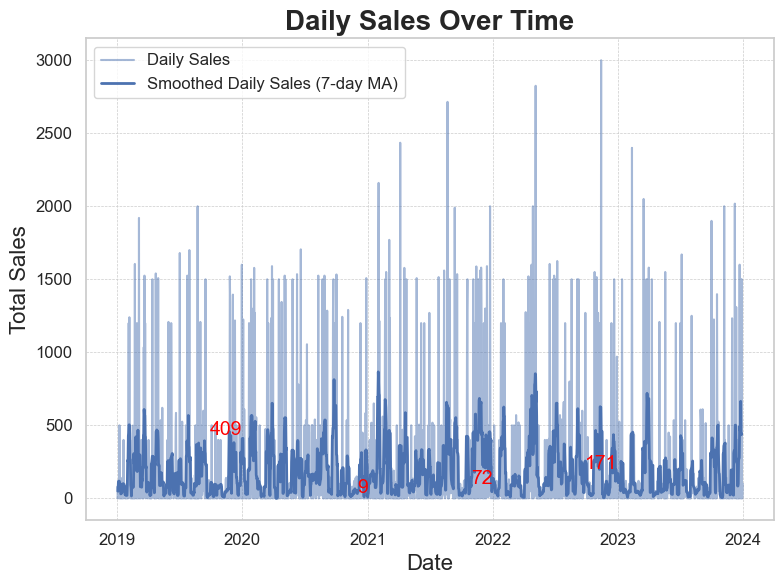

In [173]:
# Apply a rolling average to smooth the data
rolling_window_size = 7  # 7-day rolling average
daily_data['Price_Smoothed'] = daily_data['Price'].rolling(window=rolling_window_size, center=True).mean()

# Filter data to include only until the end of 2023
end_date = pd.Timestamp('2023-12-31')
filtered_data = daily_data[daily_data.index <= end_date]

# Plot daily sales over time with rolling average for smoothness
plt.figure(figsize=(8, 6))
plt.plot(filtered_data.index, filtered_data['Price'], label='Daily Sales', alpha=0.5)  # Original data with transparency
plt.plot(filtered_data.index, filtered_data['Price_Smoothed'], label='Smoothed Daily Sales (7-day MA)', color='b', linewidth=2)
plt.title('Daily Sales Over Time', fontsize=20, fontweight='bold')
plt.xlabel('Date', fontsize=16)
plt.ylabel('Total Sales', fontsize=16)
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.legend(fontsize=12)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()

# Add data labels where the year changes
previous_year = filtered_data.index[0].year
for x, y in zip(filtered_data.index, filtered_data['Price_Smoothed']):
    current_year = x.year
    if current_year != previous_year:
        plt.text(x, y, f'{y:.0f}', ha='right', va='bottom', fontsize=14, color='red')
        previous_year = current_year

# Show the plot
plt.show()

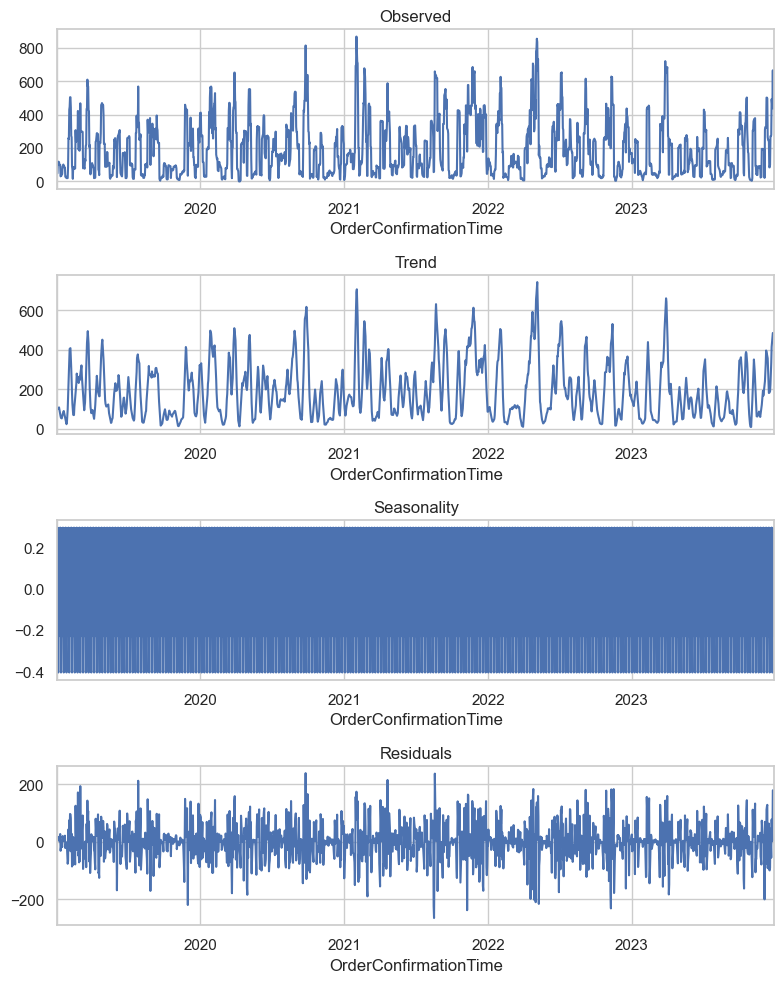

In [174]:
# Apply a rolling average to smooth the data
rolling_window_size = 7  # 7-day rolling average
daily_data['Price_Smoothed'] = daily_data['Price'].rolling(window=rolling_window_size, center=True).mean()

# Decompose the time series using the smoothed data
decomposition = seasonal_decompose(daily_data['Price_Smoothed'].dropna(), model='additive')

# Plot the decomposition
fig, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, figsize=(8, 10))
decomposition.observed.plot(ax=ax1, title='Observed')
decomposition.trend.plot(ax=ax2, title='Trend')
decomposition.seasonal.plot(ax=ax3, title='Seasonality')
decomposition.resid.plot(ax=ax4, title='Residuals')
plt.tight_layout()
plt.show()

In [175]:
# Perform the Augmented Dickey-Fuller test
result = adfuller(daily_data['Price'].dropna())
print('ADF Statistic:', result[0])
print('p-value:', result[1])

ADF Statistic: -42.05655651287013
p-value: 0.0


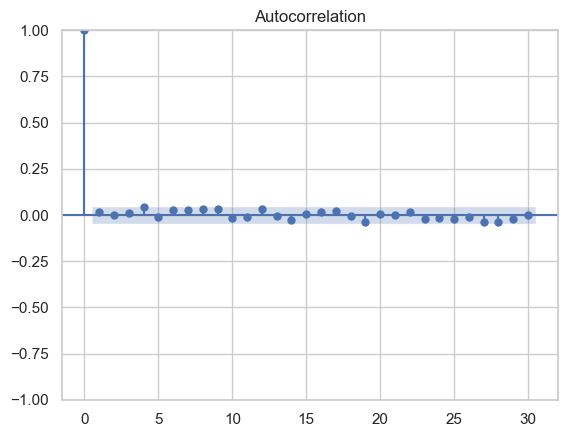

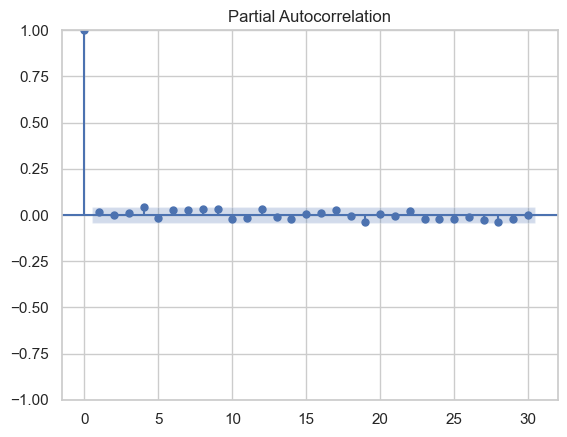

In [176]:
# Plot the autocorrelation function
plot_acf(daily_data['Price'].dropna(), lags=30)
plt.show()

# Plot the partial autocorrelation function
plot_pacf(daily_data['Price'].dropna(), lags=30)
plt.show()

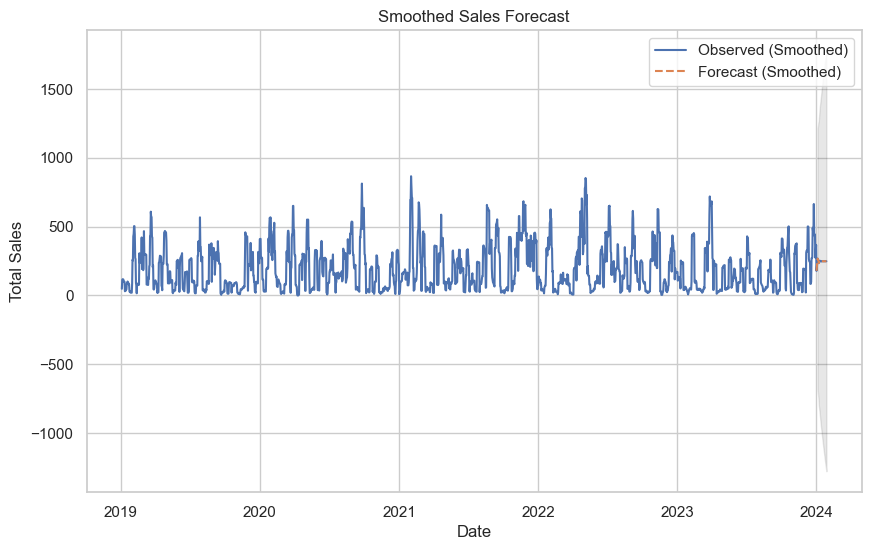

In [177]:
# Fit the ARIMA model
model = ARIMA(daily_data['Price'].dropna(), order=(5, 1, 0))
model_fit = model.fit()

# Forecast the next 30 days
forecast = model_fit.forecast(steps=30)
conf_int = model_fit.get_forecast(steps=30).conf_int()

# Create a date range for the forecast
forecast_dates = pd.date_range(daily_data.index[-1] + pd.Timedelta(days=1), periods=30)

# Create a DataFrame for the forecasted data
forecast_df = pd.DataFrame({
    'Price': forecast,
    'Lower Conf Int': conf_int.iloc[:, 0],
    'Upper Conf Int': conf_int.iloc[:, 1]
}, index=forecast_dates)

# Concatenate the observed and forecasted data
combined_data = pd.concat([daily_data[['Price']], forecast_df])

# Apply a rolling average to smooth the data
rolling_window_size = 7  # 7-day rolling average
combined_data['Price_Smoothed'] = combined_data['Price'].rolling(window=rolling_window_size, center=True).mean()
combined_data['Lower Conf Int Smoothed'] = combined_data['Lower Conf Int'].rolling(window=rolling_window_size, center=True).mean()
combined_data['Upper Conf Int Smoothed'] = combined_data['Upper Conf Int'].rolling(window=rolling_window_size, center=True).mean()

# Plot the smoothed observed and forecasted data
plt.figure(figsize=(10, 6))
plt.plot(combined_data.index, combined_data['Price_Smoothed'], label='Observed (Smoothed)')
plt.plot(forecast_df.index, combined_data.loc[forecast_df.index, 'Price_Smoothed'], label='Forecast (Smoothed)', linestyle='--')
plt.fill_between(forecast_df.index, combined_data.loc[forecast_df.index, 'Lower Conf Int Smoothed'], combined_data.loc[forecast_df.index, 'Upper Conf Int Smoothed'], color='k', alpha=0.1)
plt.title('Smoothed Sales Forecast')
plt.xlabel('Date')
plt.ylabel('Total Sales')
plt.legend()
plt.show()

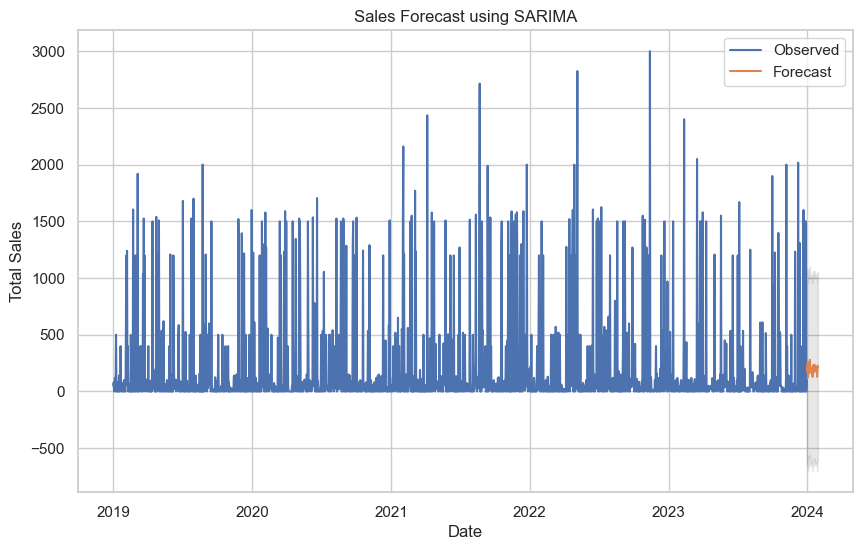

In [178]:
# Fit the SARIMA model
model = SARIMAX(daily_data['Price'], order=(1, 1, 1), seasonal_order=(1, 1, 1, 12))
model_fit = model.fit(disp=False)

# Forecast the next 30 days
forecast = model_fit.get_forecast(steps=30)
forecast_values = forecast.predicted_mean
conf_int = forecast.conf_int()

# Plot the forecast
plt.figure(figsize=(10, 6))
plt.plot(daily_data.index, daily_data['Price'], label='Observed')
plt.plot(pd.date_range(daily_data.index[-1], periods=30, freq='D'), forecast_values, label='Forecast')
plt.fill_between(pd.date_range(daily_data.index[-1], periods=30, freq='D'), conf_int.iloc[:, 0], conf_int.iloc[:, 1], color='k', alpha=0.1)
plt.title('Sales Forecast using SARIMA')
plt.xlabel('Date')
plt.ylabel('Total Sales')
plt.legend()
plt.show()

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=inf, Time=0.74 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=27590.728, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=27528.105, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=27542.455, Time=0.06 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=27491.174, Time=0.04 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=27460.226, Time=0.06 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=27420.673, Time=0.11 sec
 ARIMA(5,0,0)(0,0,0)[0]             : AIC=27411.459, Time=0.11 sec
 ARIMA(5,0,1)(0,0,0)[0]             : AIC=inf, Time=1.56 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=inf, Time=1.21 sec
 ARIMA(5,0,0)(0,0,0)[0] intercept   : AIC=27249.011, Time=0.17 sec
 ARIMA(4,0,0)(0,0,0)[0] intercept   : AIC=27247.378, Time=0.20 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=27249.093, Time=0.12 sec
 ARIMA(4,0,1)(0,0,0)[0] intercept   : AIC=27249.351, Time=0.43 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   :

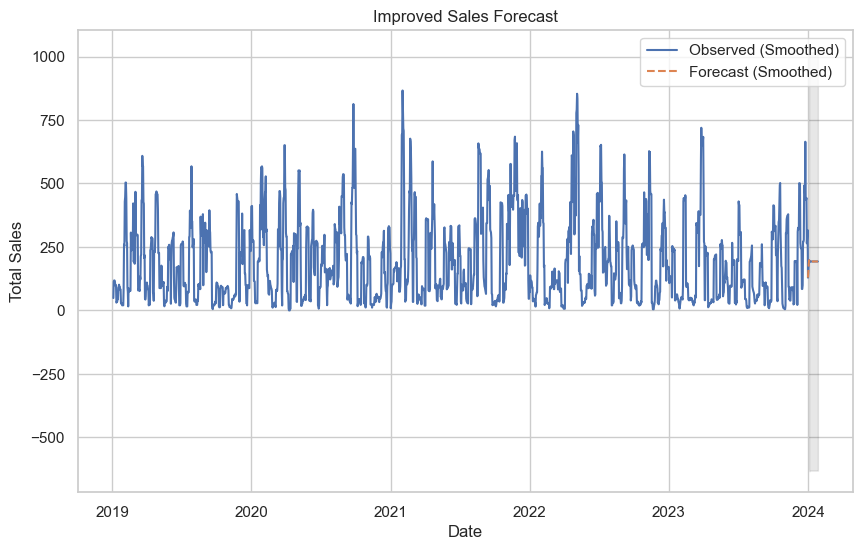

In [179]:
# Use auto_arima to find the best ARIMA parameters
auto_model = auto_arima(daily_data['Price'].dropna(), seasonal=False, trace=True, error_action='ignore', suppress_warnings=True)

# Fit the ARIMA model with the best parameters found by auto_arima
model = ARIMA(daily_data['Price'].dropna(), order=auto_model.order)
model_fit = model.fit()

# Forecast the next 30 days
forecast = model_fit.forecast(steps=30)
conf_int = model_fit.get_forecast(steps=30).conf_int()

# Create a date range for the forecast
forecast_dates = pd.date_range(daily_data.index[-1] + pd.Timedelta(days=1), periods=30)

# Create a DataFrame for the forecasted data
forecast_df = pd.DataFrame({
    'Price': forecast,
    'Lower Conf Int': conf_int.iloc[:, 0],
    'Upper Conf Int': conf_int.iloc[:, 1]
}, index=forecast_dates)

# Concatenate the observed and forecasted data
combined_data = pd.concat([daily_data[['Price']], forecast_df])

# Apply a rolling average to smooth the data
rolling_window_size = 7  # 7-day rolling average
combined_data['Price_Smoothed'] = combined_data['Price'].rolling(window=rolling_window_size, center=True).mean()
combined_data['Lower Conf Int Smoothed'] = combined_data['Lower Conf Int'].rolling(window=rolling_window_size, center=True).mean()
combined_data['Upper Conf Int Smoothed'] = combined_data['Upper Conf Int'].rolling(window=rolling_window_size, center=True).mean()

# Plot the smoothed observed and forecasted data
plt.figure(figsize=(10, 6))
plt.plot(combined_data.index, combined_data['Price_Smoothed'], label='Observed (Smoothed)')
plt.plot(forecast_df.index, combined_data.loc[forecast_df.index, 'Price_Smoothed'], label='Forecast (Smoothed)', linestyle='--')
plt.fill_between(forecast_df.index, combined_data.loc[forecast_df.index, 'Lower Conf Int Smoothed'], combined_data.loc[forecast_df.index, 'Upper Conf Int Smoothed'], color='k', alpha=0.1)
plt.title('Improved Sales Forecast')
plt.xlabel('Date')
plt.ylabel('Total Sales')
plt.legend()
plt.show()


In [180]:
# Print column names to verify
print(data.columns)

Index(['SessionStart', 'CustomerID', 'FullName', 'Gender', 'Age',
       'CreditScore', 'MonthlyIncome', 'Country', 'State', 'City', 'Category',
       'Product', 'Cost', 'Price', 'Quantity', 'CampaignSchema ',
       'CartAdditionTime', 'OrderConfirmation', 'PaymentMethod', 'SessionEnd',
       'OrderReturn', 'ReturnReason', 'OrderConfirmationTime_Copy'],
      dtype='object')


## MONTHLY SALES FORECASTED FOR 2024

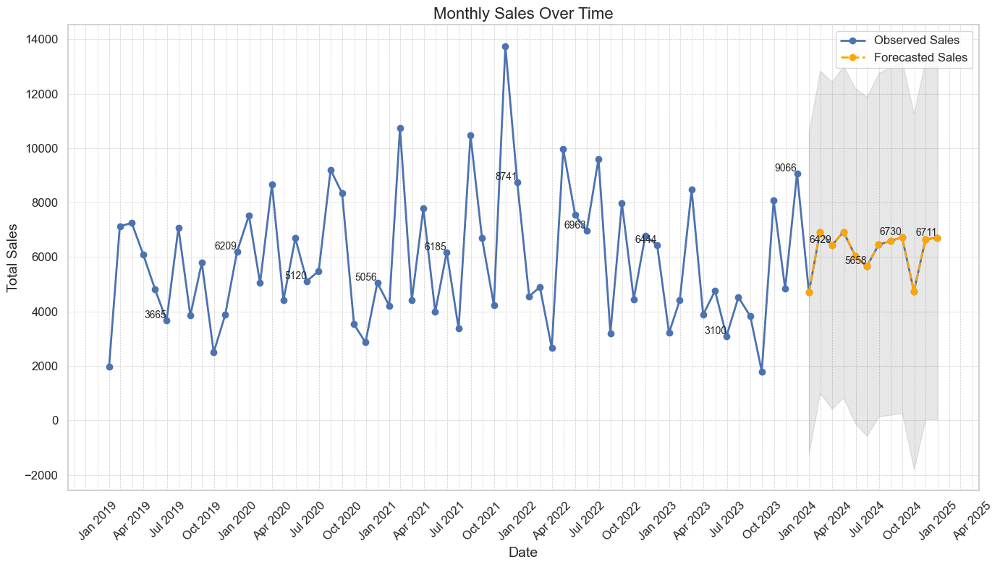

In [181]:
# Resample data by month 
monthly_data = data[numerical_columns].resample('ME').sum()
sarima_model = SARIMAX(monthly_data['Price'], order=(1, 1, 1), seasonal_order=(1, 1, 1, 12))
sarima_result = sarima_model.fit(disp=False, maxiter=1000)

#number of months to forecast
last_date = monthly_data.index[-1]
end_date = pd.Timestamp('2024-12-31')
forecast_steps = (end_date.year - last_date.year) * 12 + (end_date.month - last_date.month)

# Forecasting
forecast = sarima_result.get_forecast(steps=forecast_steps)
forecast_values = forecast.predicted_mean
forecast_conf_int = forecast.conf_int()

forecast_dates = pd.date_range(start=monthly_data.index[-1] + pd.DateOffset(months=1), periods=forecast_steps, freq='ME')
forecast_data = pd.DataFrame({'Price': forecast_values, 'Lower Conf Int': forecast_conf_int.iloc[:, 0], 
                              'Upper Conf Int': forecast_conf_int.iloc[:, 1]}, index=forecast_dates)

# Concatenate the historical and forecasted sales data
extended_data = pd.concat([monthly_data, forecast_data])
plt.figure(figsize=(14, 8))
plt.plot(extended_data.index, extended_data['Price'], label='Observed Sales', marker='o', color='b', linestyle='-', linewidth=2, markersize=6)
plt.plot(forecast_dates, forecast_values, label='Forecasted Sales', marker='o', color='orange', linestyle='--', linewidth=2, markersize=6)
plt.fill_between(forecast_dates, forecast_conf_int.iloc[:, 0], forecast_conf_int.iloc[:, 1], color='k', alpha=0.1)
plt.title('Monthly Sales Over Time', fontsize=16)
plt.xlabel('Date', fontsize=14)
plt.ylabel('Total Sales', fontsize=14)
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.legend(fontsize=12)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

for x, y in zip(forecast_data.index, forecast_data['Price']):
    if x.month % 3 == 0:  # Label every 3 months
        plt.text(x, y, f'{y:.0f}', ha='right', va='bottom', fontsize=10)

for x, y in zip(monthly_data.index, monthly_data['Price']):
    if x.month % 6 == 0:  # Label every 6 months for observed data
        plt.text(x, y, f'{y:.0f}', ha='right', va='bottom', fontsize=10)
plt.xticks(rotation=45)
ax = plt.gca()
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=3))  # Show labels every 3 months
ax.xaxis.set_minor_locator(mdates.MonthLocator())  # Minor ticks every month
ax.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.tight_layout()
plt.show()

In [182]:

# Check the available columns
print(data.columns)

Index(['SessionStart', 'CustomerID', 'FullName', 'Gender', 'Age',
       'CreditScore', 'MonthlyIncome', 'Country', 'State', 'City', 'Category',
       'Product', 'Cost', 'Price', 'Quantity', 'CampaignSchema ',
       'CartAdditionTime', 'OrderConfirmation', 'PaymentMethod', 'SessionEnd',
       'OrderReturn', 'ReturnReason', 'OrderConfirmationTime_Copy'],
      dtype='object')


## CREATING VISUALS

## Monthly Sales Trend

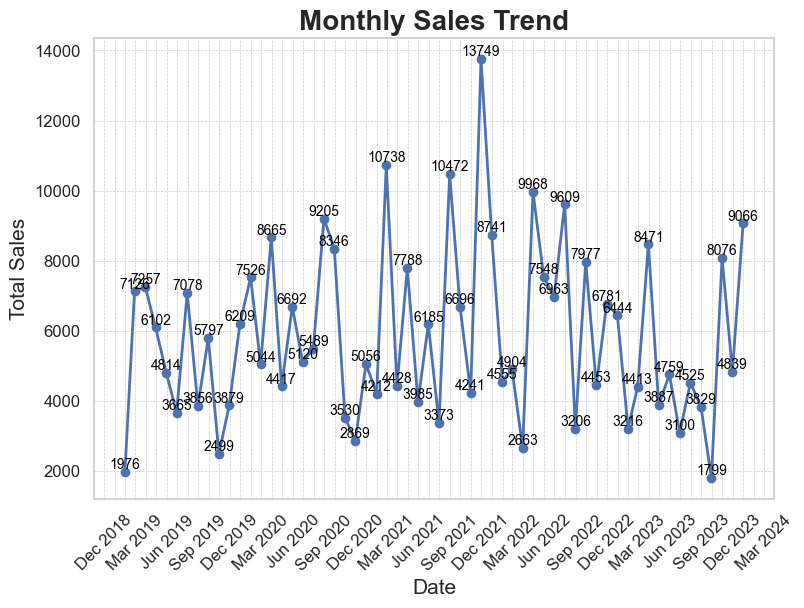

In [183]:
# Resample to get monthly sales
monthly_sales = data.resample('ME', on='OrderConfirmationTime_Copy')['Price'].sum().reset_index()

# Set Seaborn style
sns.set(style="whitegrid")

# Create the plot
plt.figure(figsize=(8, 6))
plt.plot(monthly_sales['OrderConfirmationTime_Copy'], monthly_sales['Price'], marker='o', linestyle='-', linewidth=2, markersize=6, color='b')
plt.title('Monthly Sales Trend', fontsize=20, fontweight='bold')
plt.xlabel('Date', fontsize=15)
plt.ylabel('Total Sales', fontsize=15)
plt.xticks(rotation=45, fontsize=12)
plt.yticks(fontsize=12)
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.tight_layout()

# Adding data labels
for x, y in zip(monthly_sales['OrderConfirmationTime_Copy'], monthly_sales['Price']):
    plt.text(x, y, f'{y:.0f}', ha='center', va='bottom', fontsize=10, color='black')

# Customize the gridlines
ax = plt.gca()
ax.xaxis.set_major_formatter(plt.matplotlib.dates.DateFormatter('%b %Y'))
ax.xaxis.set_major_locator(plt.matplotlib.dates.MonthLocator(interval=3))
ax.xaxis.set_minor_locator(plt.matplotlib.dates.MonthLocator())
ax.grid(True, which='both', linestyle='--', linewidth=0.5)

# Show the plot
plt.show()

# Sales Distribution

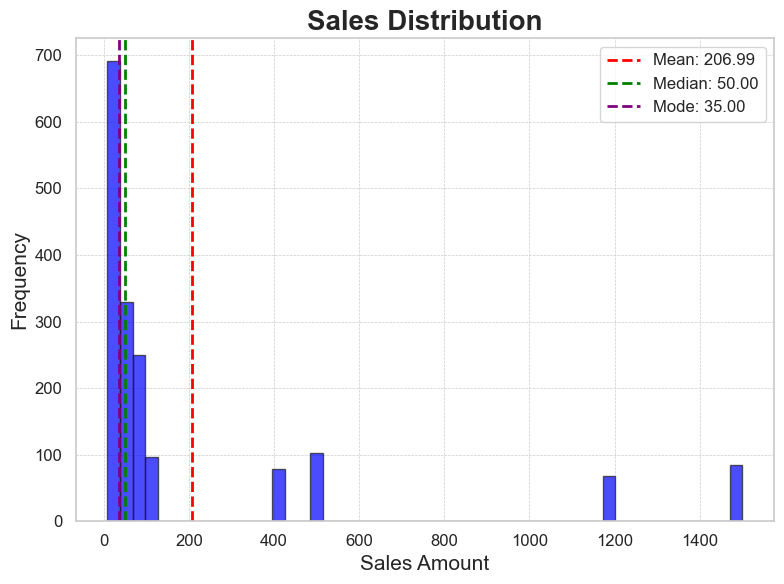

In [184]:
# Set Seaborn style
sns.set(style="whitegrid")

# Create the plot
plt.figure(figsize=(8, 6))
plt.hist(data['Price'], bins=50, edgecolor='k', alpha=0.7, color='blue')
plt.title('Sales Distribution', fontsize=20, fontweight='bold')
plt.xlabel('Sales Amount', fontsize=15)
plt.ylabel('Frequency', fontsize=15)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.grid(True, which='both', linestyle='--', linewidth=0.5)

# Calculate descriptive statistics
mean_val = data['Price'].mean()
median_val = data['Price'].median()
mode_val = data['Price'].mode()[0]

# Add lines for mean, median, and mode
plt.axvline(mean_val, color='red', linestyle='dashed', linewidth=2, label=f'Mean: {mean_val:.2f}')
plt.axvline(median_val, color='green', linestyle='dashed', linewidth=2, label=f'Median: {median_val:.2f}')
plt.axvline(mode_val, color='purple', linestyle='dashed', linewidth=2, label=f'Mode: {mode_val:.2f}')

# Add legend
plt.legend(fontsize=12)

# Show the plot
plt.tight_layout()
plt.show()

# Sales by Category Plot

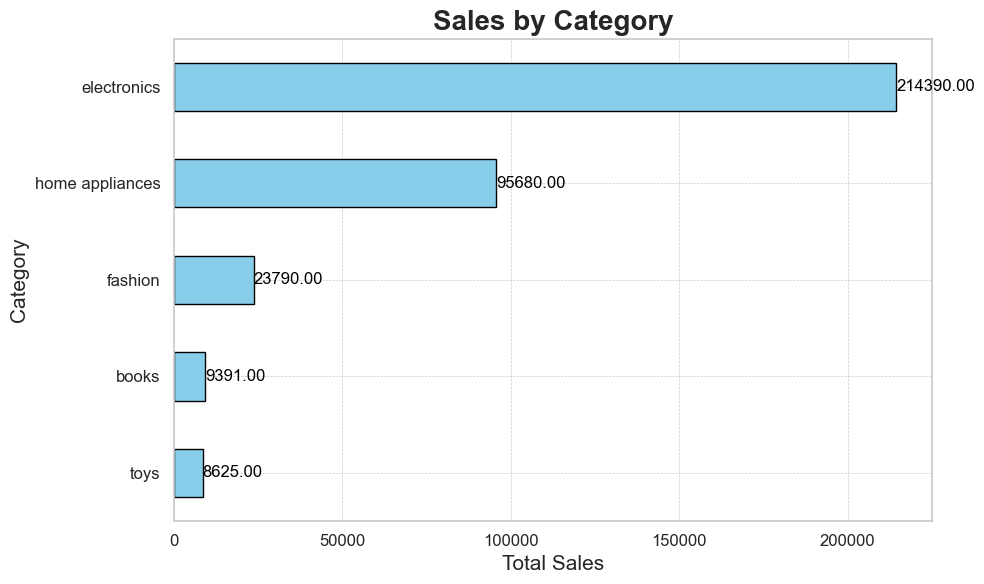

In [185]:
# Set Seaborn style
sns.set(style="whitegrid")

# Sales by Category
category_sales = data.groupby('Category')['Price'].sum().sort_values()

# Create the plot
plt.figure(figsize=(10, 6))
bar_plot = category_sales.plot(kind='barh', color='skyblue', edgecolor='black')

# Add title and labels
plt.title('Sales by Category', fontsize=20, fontweight='bold')
plt.xlabel('Total Sales', fontsize=15)
plt.ylabel('Category', fontsize=15)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.grid(True, which='both', linestyle='--', linewidth=0.5)

# Add data labels
for index, value in enumerate(category_sales):
    plt.text(value, index, f'{value:.2f}', ha='left', va='center', fontsize=12, color='black')

# Show the plot
plt.tight_layout()
plt.show()

# Sales by Country/Region

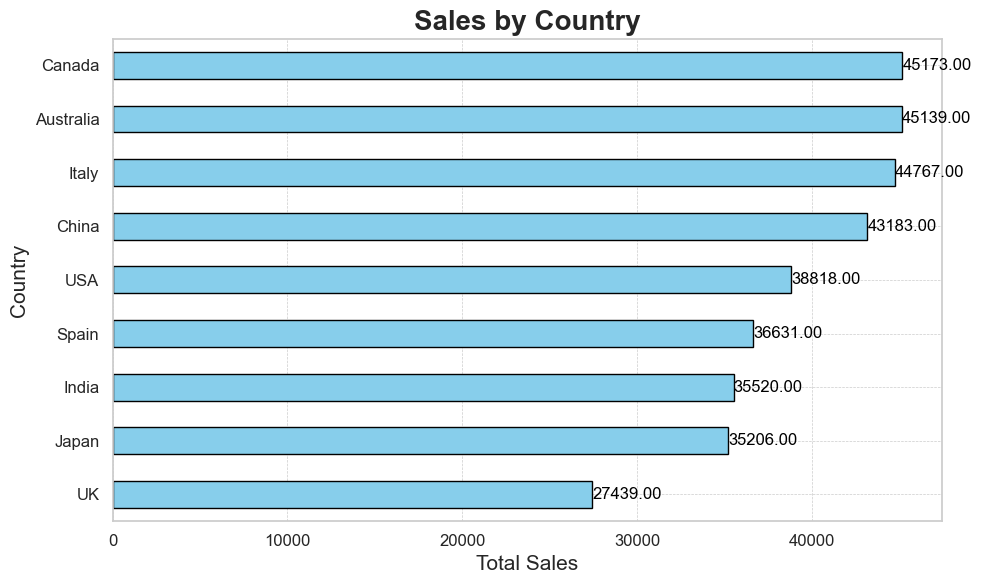

In [186]:
# Set Seaborn style
sns.set(style="whitegrid")

# Sales by Country
country_sales = data.groupby('Country')['Price'].sum().sort_values()

# Create the plot
plt.figure(figsize=(10, 6))
bar_plot = country_sales.plot(kind='barh', color='skyblue', edgecolor='black')

# Add title and labels
plt.title('Sales by Country', fontsize=20, fontweight='bold')
plt.xlabel('Total Sales', fontsize=15)
plt.ylabel('Country', fontsize=15)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.grid(True, which='both', linestyle='--', linewidth=0.5)

# Add data labels
for index, value in enumerate(country_sales):
    plt.text(value, index, f'{value:.2f}', ha='left', va='center', fontsize=12, color='black')

# Show the plot
plt.tight_layout()
plt.show()

# Sales Funnel Plot

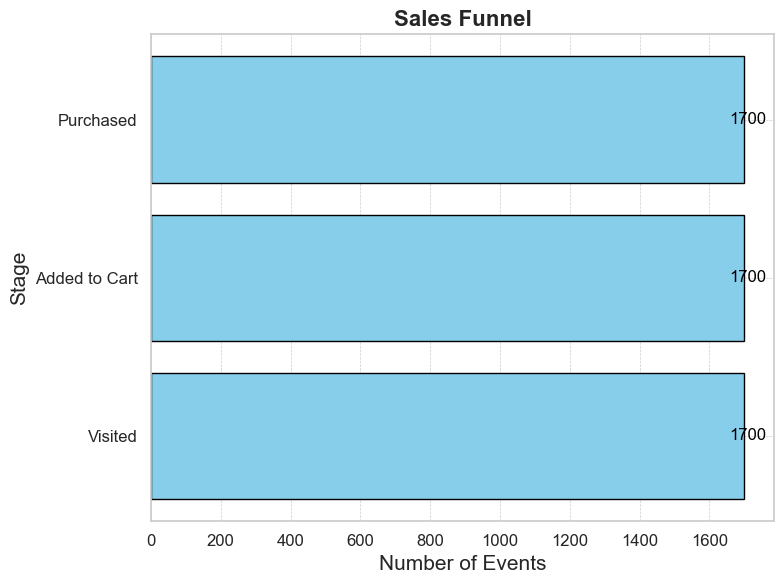

In [187]:
# Apply Seaborn style
sns.set(style="whitegrid")

# Sales Funnel Data
stages = ['Visited', 'Added to Cart', 'Purchased']
values = [data['SessionStart'].count(), data['CartAdditionTime'].count(), data['OrderConfirmationTime_Copy'].count()]

# Create the plot
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111)
bars = ax.barh(stages, values, color='skyblue', edgecolor='black')

# Add title and labels
plt.title('Sales Funnel', fontsize=16, fontweight='bold')
plt.xlabel('Number of Events', fontsize=15)
plt.ylabel('Stage', fontsize=15)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.grid(True, which='both', linestyle='--', linewidth=0.5)

# Add data labels
for bar, value in zip(bars, values):
    ax.text(value + 10, bar.get_y() + bar.get_height() / 2, f'{value}', ha='center', va='center', fontsize=12, color='black')

# Show the plot
plt.tight_layout()
plt.show()

# Correlation Heatmap

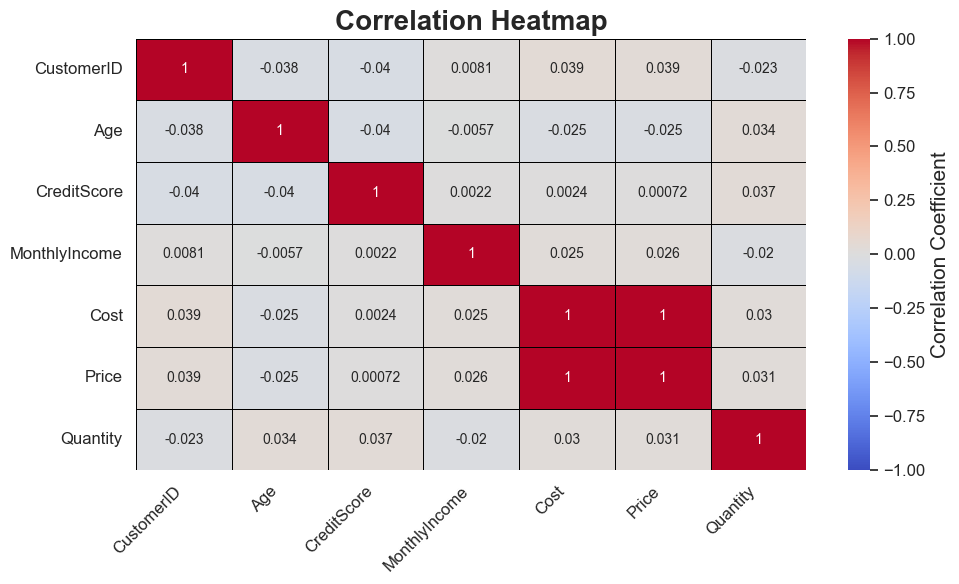

In [188]:
# Select only numeric columns for correlation calculation
numeric_data = data.select_dtypes(include=[float, int])

# Set Seaborn style
sns.set(style="whitegrid")

# Correlation Heatmap
plt.figure(figsize=(10, 6))
corr = numeric_data.corr()
heatmap = sns.heatmap(corr, annot=True, cmap='coolwarm', vmin=-1, vmax=1, annot_kws={"size": 10}, linewidths=0.5, linecolor='black')

# Add title and labels
plt.title('Correlation Heatmap', fontsize=20, fontweight='bold')
plt.xticks(fontsize=12, rotation=45, ha='right')
plt.yticks(fontsize=12, rotation=0)

# Add color bar with a label
colorbar = heatmap.collections[0].colorbar
colorbar.set_label('Correlation Coefficient', fontsize=15)
colorbar.ax.tick_params(labelsize=12)

# Show the plot with tight layout
plt.tight_layout()
plt.show()

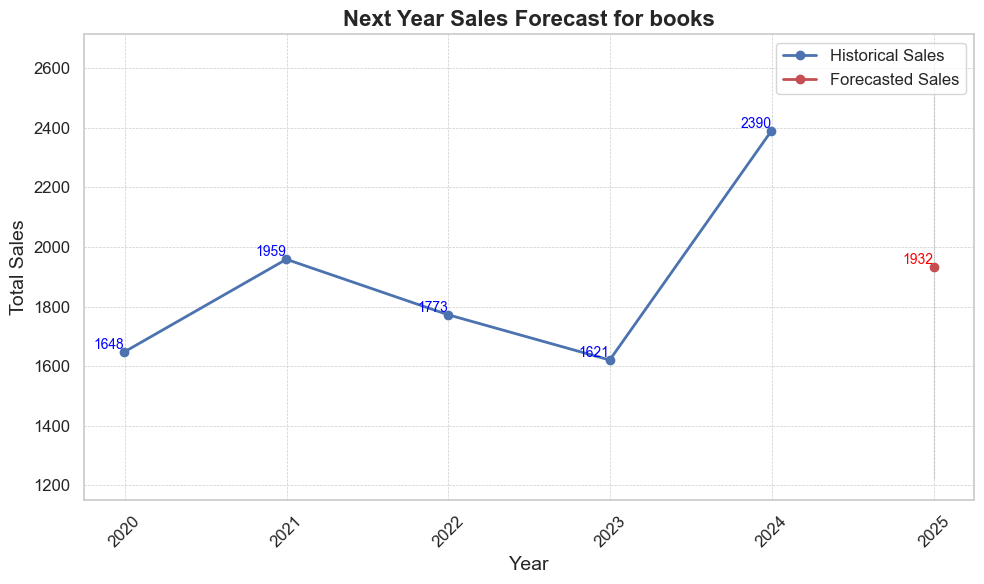

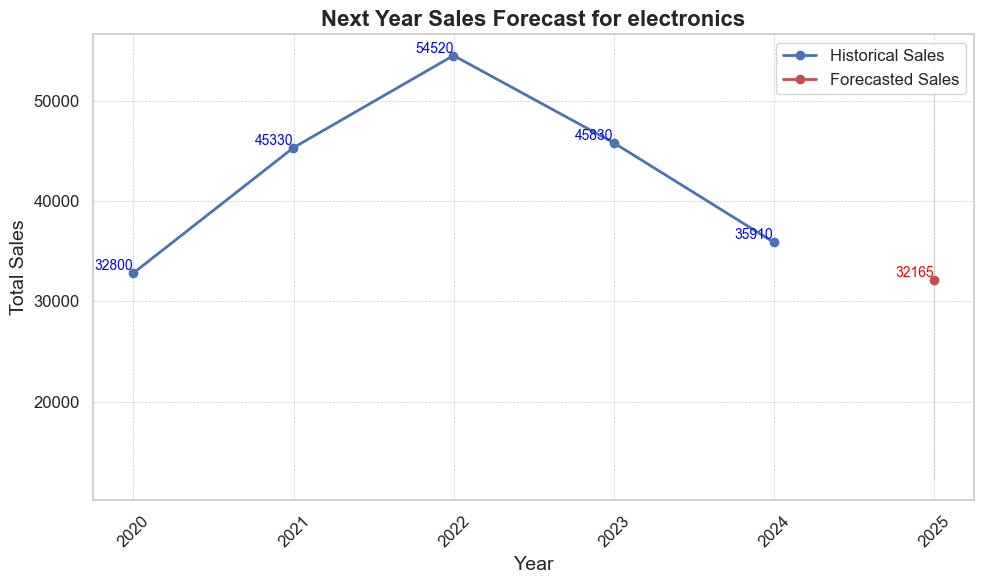

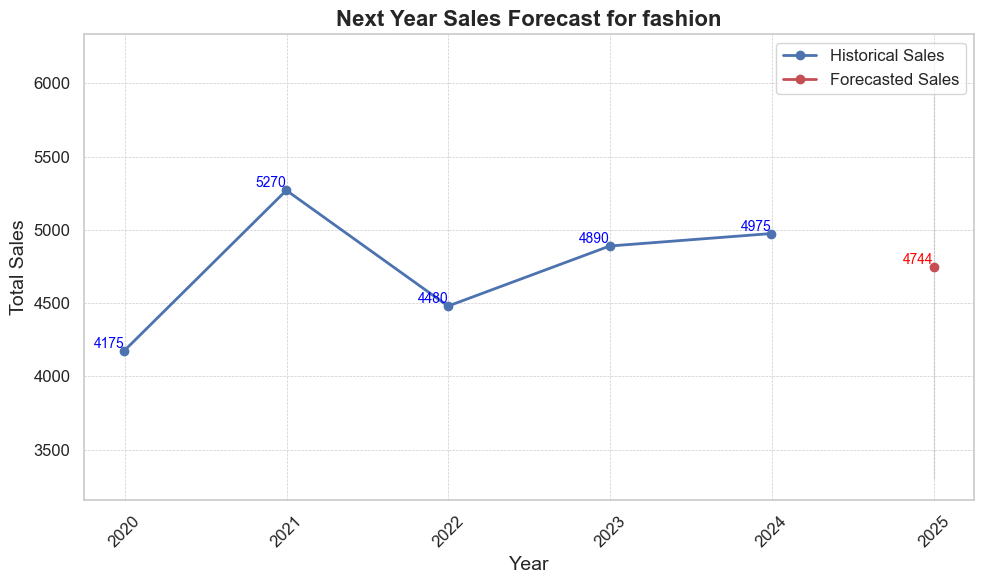

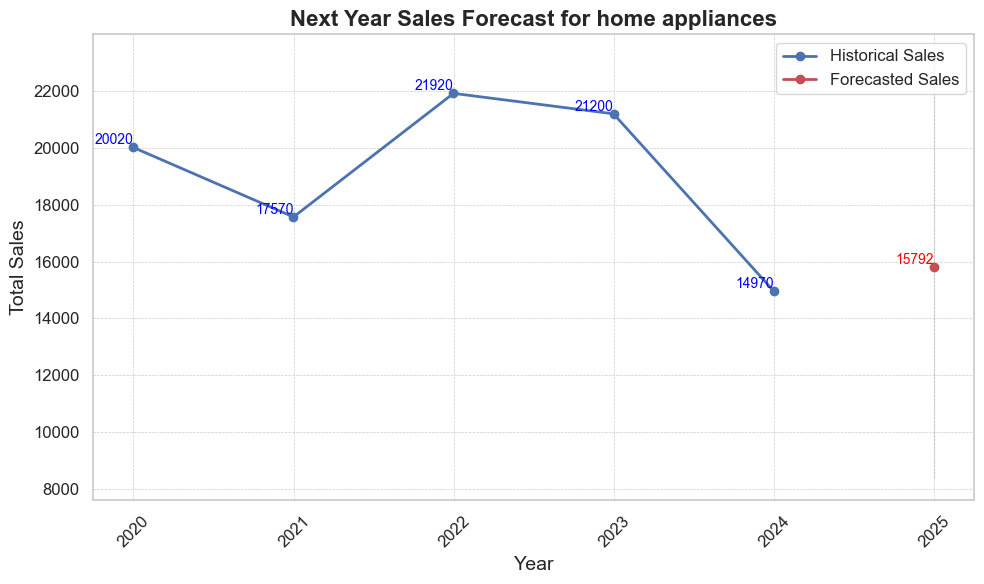

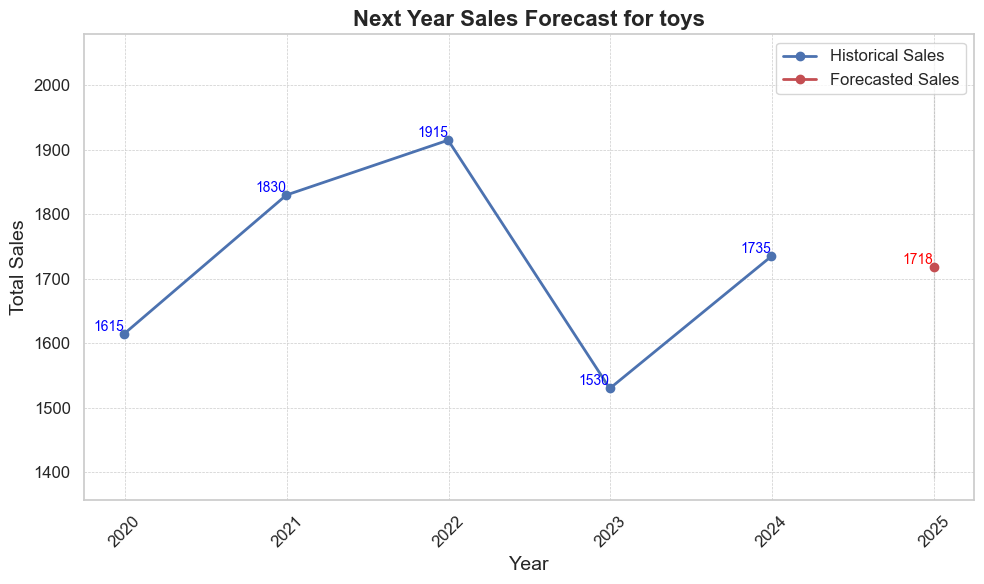

In [189]:
data['OrderConfirmationTime'] = pd.to_datetime(data['OrderConfirmationTime_Copy'], errors='coerce')

# Aggregating sales by year and category
category_sales = data.groupby(['Category', pd.Grouper(key='OrderConfirmationTime', freq='Y')])['Price'].sum().reset_index()

# Forecasting next year's sales for each category
category_forecasts = {}
for category in category_sales['Category'].unique():
    category_data = category_sales[category_sales['Category'] == category].set_index('OrderConfirmationTime')['Price']
    
    # SARIMA model without seasonal component
    sarima_model = SARIMAX(category_data, order=(1, 1, 1))
    sarima_result = sarima_model.fit(disp=False)
    
    # Forecast for the next year
    forecast_steps = 1
    forecast = sarima_result.get_forecast(steps=forecast_steps)
    forecast_values = forecast.predicted_mean
    forecast_conf_int = forecast.conf_int()
    forecast_dates = pd.date_range(start=category_data.index[-1] + pd.DateOffset(years=1), periods=forecast_steps, freq='Y')
    forecast_data = pd.DataFrame({'Forecast': forecast_values, 'Lower Conf Int': forecast_conf_int.iloc[:, 0], 
                                  'Upper Conf Int': forecast_conf_int.iloc[:, 1]}, 
                                 index=forecast_dates)
    
    category_forecasts[category] = forecast_data

# Plotting the forecasts for each category separately
for category, forecast_data in category_forecasts.items():
    category_data = category_sales[category_sales['Category'] == category].set_index('OrderConfirmationTime')['Price']
    plt.figure(figsize=(10, 6))
    plt.plot(category_data.index, category_data, label='Historical Sales', marker='o', linestyle='-', linewidth=2)
    plt.plot(forecast_data.index, forecast_data['Forecast'], label='Forecasted Sales', marker='o', linestyle='-', linewidth=2, color='r')
    plt.fill_between(forecast_data.index, forecast_data['Lower Conf Int'], forecast_data['Upper Conf Int'], color='k', alpha=0.1)
    for x, y in zip(category_data.index, category_data):
        plt.text(x, y, f'{y:.0f}', ha='right', va='bottom', fontsize=10, color='blue')
    for x, y in zip(forecast_data.index, forecast_data['Forecast']):
        plt.text(x, y, f'{y:.0f}', ha='right', va='bottom', fontsize=10, color='red')
    plt.title(f'Next Year Sales Forecast for {category}', fontsize=16, fontweight='bold')
    plt.xlabel('Year', fontsize=14)
    plt.ylabel('Total Sales', fontsize=14)
    plt.legend(fontsize=12)
    plt.grid(True, which='both', linestyle='--', linewidth=0.5)
    plt.xticks(fontsize=12, rotation=45)
    plt.yticks(fontsize=12)
    plt.tight_layout()
    plt.show()

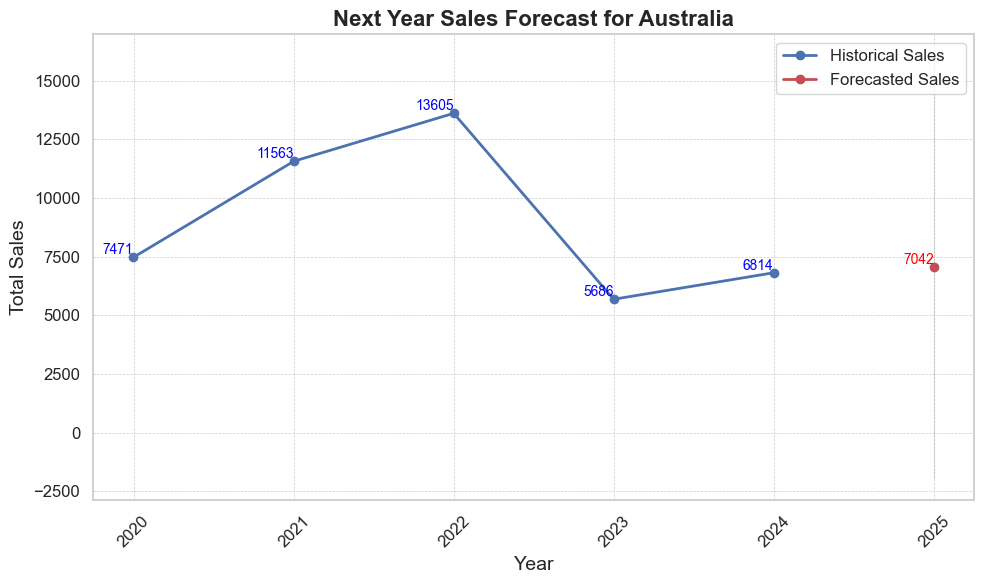

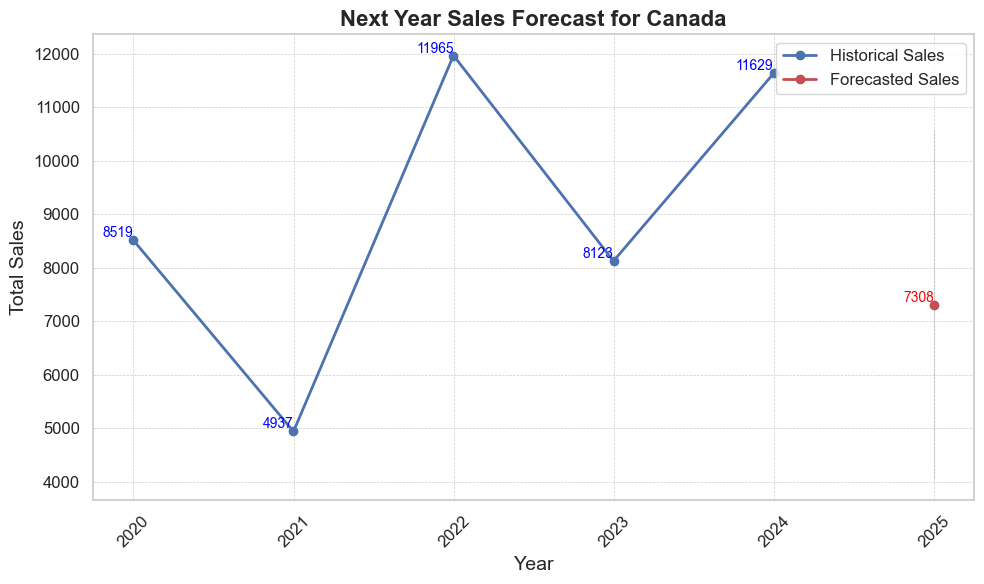

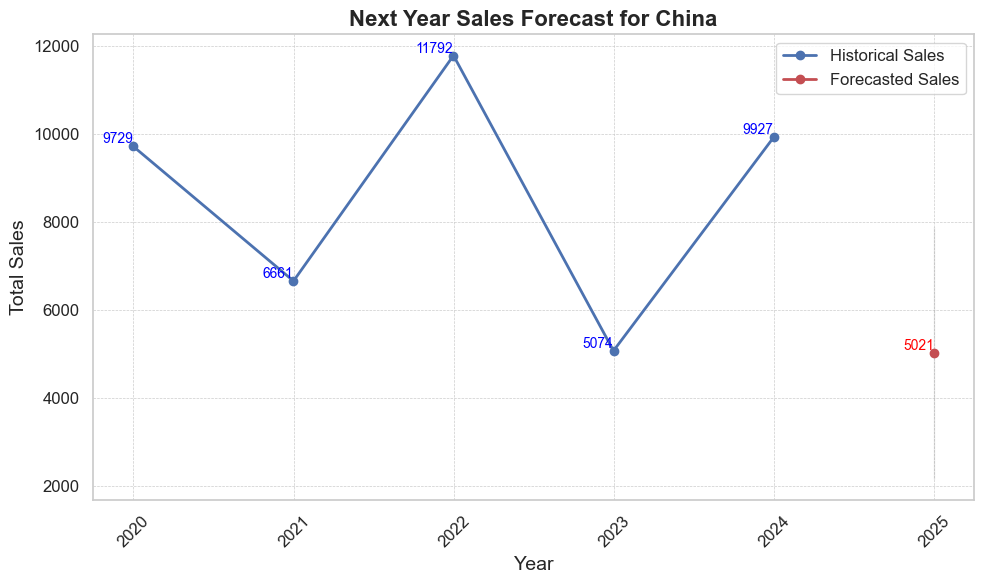

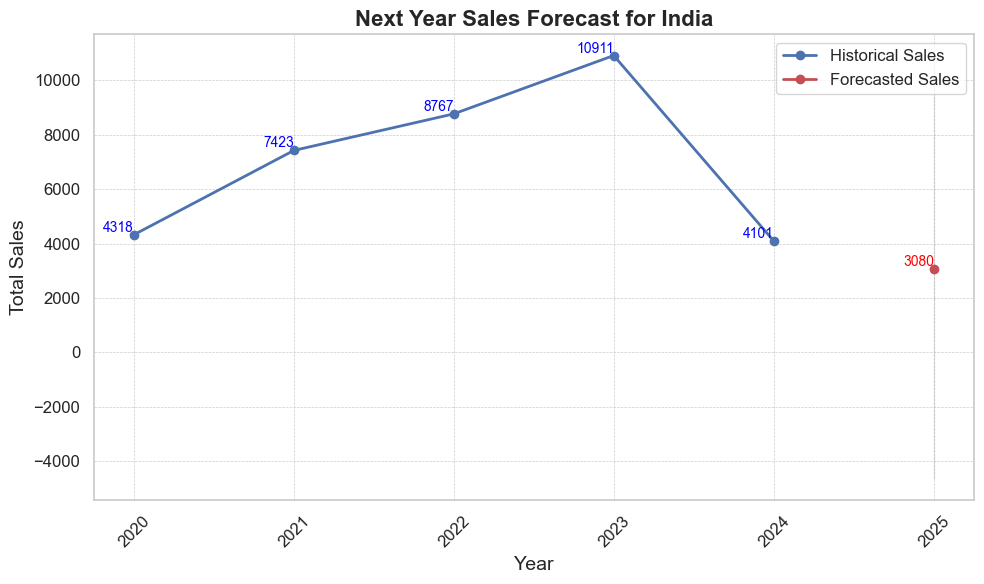

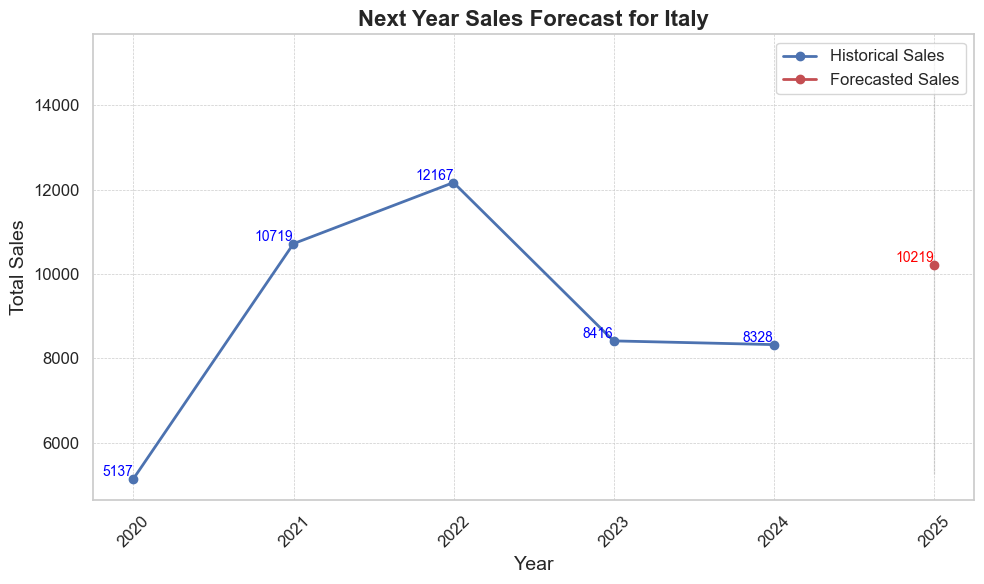

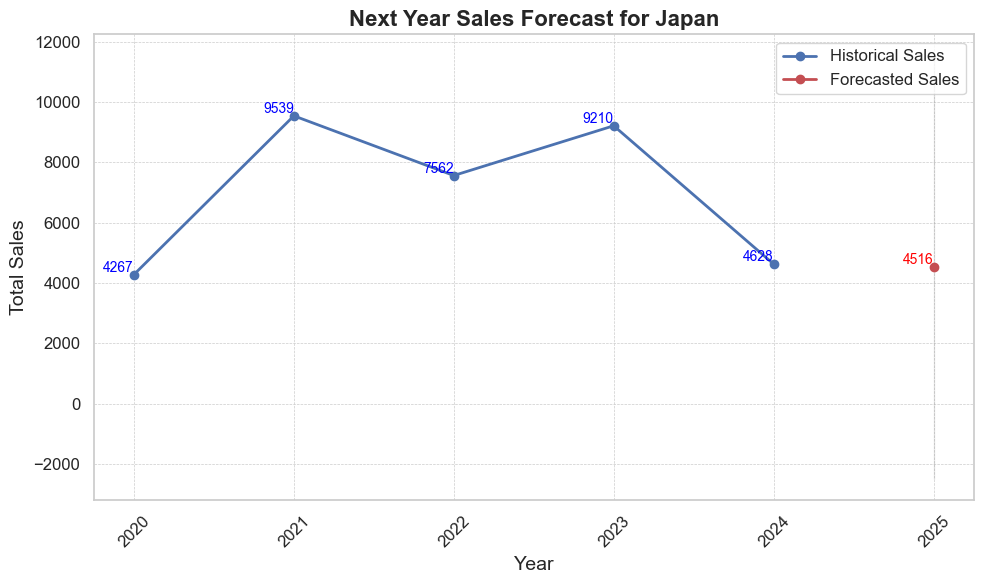

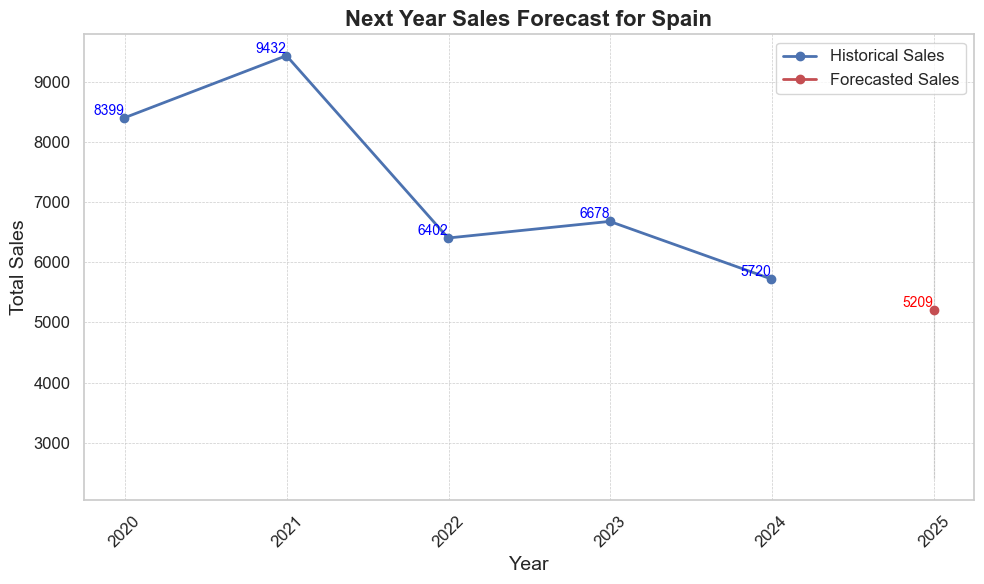

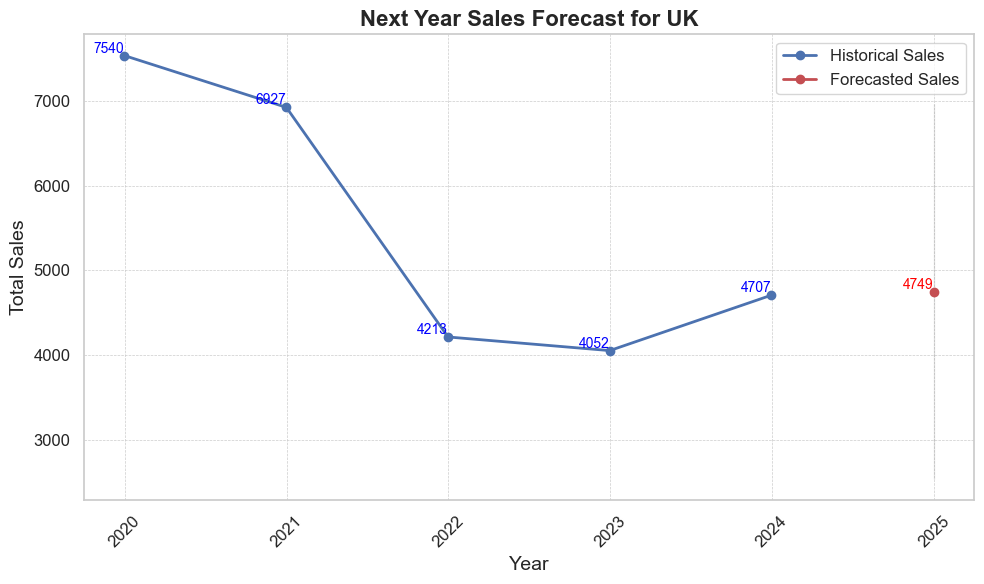

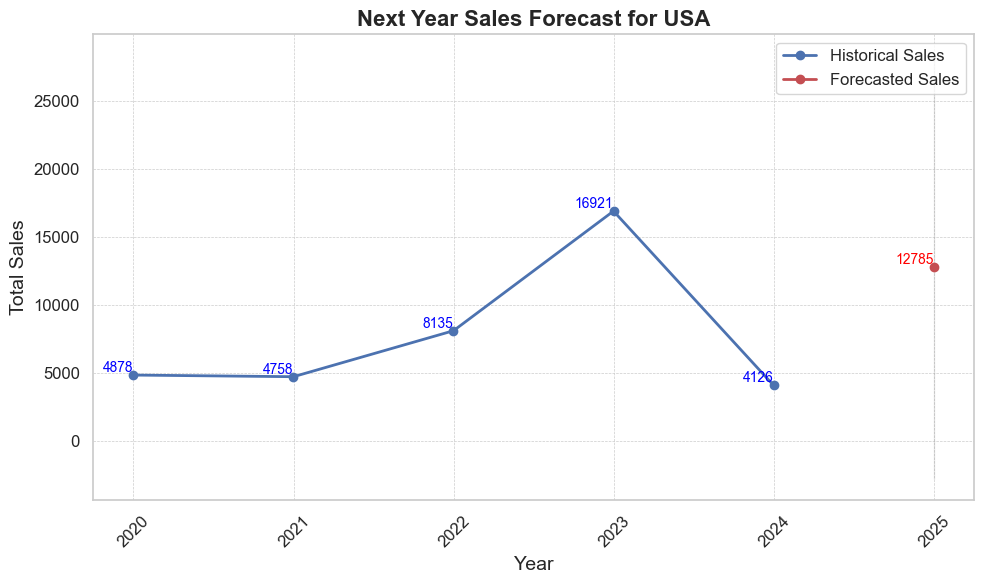

In [190]:
data['OrderConfirmationTime'] = pd.to_datetime(data['OrderConfirmationTime_Copy'], errors='coerce')
# Aggregate sales by year and region
region_sales = data.groupby(['Country', pd.Grouper(key='OrderConfirmationTime', freq='Y')])['Price'].sum().reset_index()

# Forecast next year's sales for each region
region_forecasts = {}
for region in region_sales['Country'].unique():
    region_data = region_sales[region_sales['Country'] == region].set_index('OrderConfirmationTime')['Price']
    sarima_model = SARIMAX(region_data, order=(1, 1, 1))
    sarima_result = sarima_model.fit(disp=False)
    
    # Forecast for the next year
    forecast_steps = 1
    forecast = sarima_result.get_forecast(steps=forecast_steps)
    forecast_values = forecast.predicted_mean
    forecast_conf_int = forecast.conf_int()

    forecast_dates = pd.date_range(start=region_data.index[-1] + pd.DateOffset(years=1), periods=forecast_steps, freq='Y')
    forecast_data = pd.DataFrame({'Forecast': forecast_values, 'Lower Conf Int': forecast_conf_int.iloc[:, 0], 
                                  'Upper Conf Int': forecast_conf_int.iloc[:, 1]}, index=forecast_dates)
    
    region_forecasts[region] = forecast_data
#plotting for seperate regions
for region, forecast_data in region_forecasts.items():
    region_data = region_sales[region_sales['Country'] == region].set_index('OrderConfirmationTime')['Price']
    plt.figure(figsize=(10,6))
    plt.plot(region_data.index, region_data, label='Historical Sales', marker='o', linestyle='-', linewidth=2)
    plt.plot(forecast_data.index, forecast_data['Forecast'], label='Forecasted Sales', marker='o', linestyle='-', linewidth=2, color='r')
    plt.fill_between(forecast_data.index, forecast_data['Lower Conf Int'], forecast_data['Upper Conf Int'], color='k', alpha=0.1)
    
    for x, y in zip(region_data.index, region_data):
        plt.text(x, y, f'{y:.0f}', ha='right', va='bottom', fontsize=10, color='blue')
    for x, y in zip(forecast_data.index, forecast_data['Forecast']):
        plt.text(x, y, f'{y:.0f}', ha='right', va='bottom', fontsize=10, color='red')
    
    plt.title(f'Next Year Sales Forecast for {region}', fontsize=16, fontweight='bold')
    plt.xlabel('Year', fontsize=14)
    plt.ylabel('Total Sales', fontsize=14)
    plt.legend(fontsize=12)
    plt.grid(True, which='both', linestyle='--', linewidth=0.5)
    plt.xticks(fontsize=12, rotation=45)
    plt.yticks(fontsize=12)
    plt.tight_layout()
    plt.show()

In [191]:
# Print column names
print(data.columns)

Index(['SessionStart', 'CustomerID', 'FullName', 'Gender', 'Age',
       'CreditScore', 'MonthlyIncome', 'Country', 'State', 'City', 'Category',
       'Product', 'Cost', 'Price', 'Quantity', 'CampaignSchema ',
       'CartAdditionTime', 'OrderConfirmation', 'PaymentMethod', 'SessionEnd',
       'OrderReturn', 'ReturnReason', 'OrderConfirmationTime_Copy',
       'OrderConfirmationTime'],
      dtype='object')



Data for Billboard-QR code:
      CampaignSchema  OrderConfirmationTime  Price
0   Billboard-QR code            2019-01-31    380
1   Billboard-QR code            2019-02-28    475
2   Billboard-QR code            2019-03-31    475
3   Billboard-QR code            2019-04-30   3078
4   Billboard-QR code            2019-05-31    685
5   Billboard-QR code            2019-06-30    308
6   Billboard-QR code            2019-07-31   2095
7   Billboard-QR code            2019-08-31    118
8   Billboard-QR code            2019-09-30   2908
9   Billboard-QR code            2019-10-31    168
10  Billboard-QR code            2019-11-30    160
11  Billboard-QR code            2019-12-31   1273
12  Billboard-QR code            2020-01-31     15
13  Billboard-QR code            2020-02-29    258
14  Billboard-QR code            2020-03-31   1685
15  Billboard-QR code            2020-04-30    233
16  Billboard-QR code            2020-05-31   1678
17  Billboard-QR code            2020-06-30    368
18

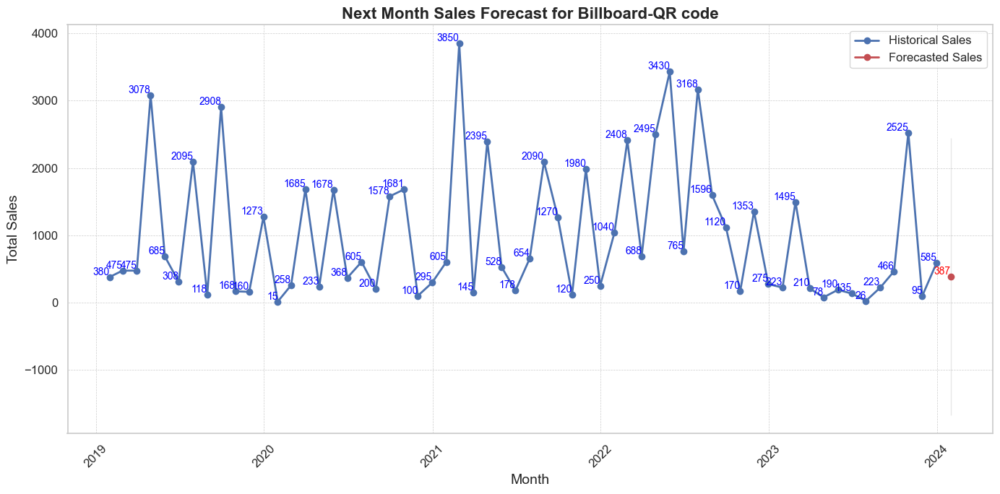

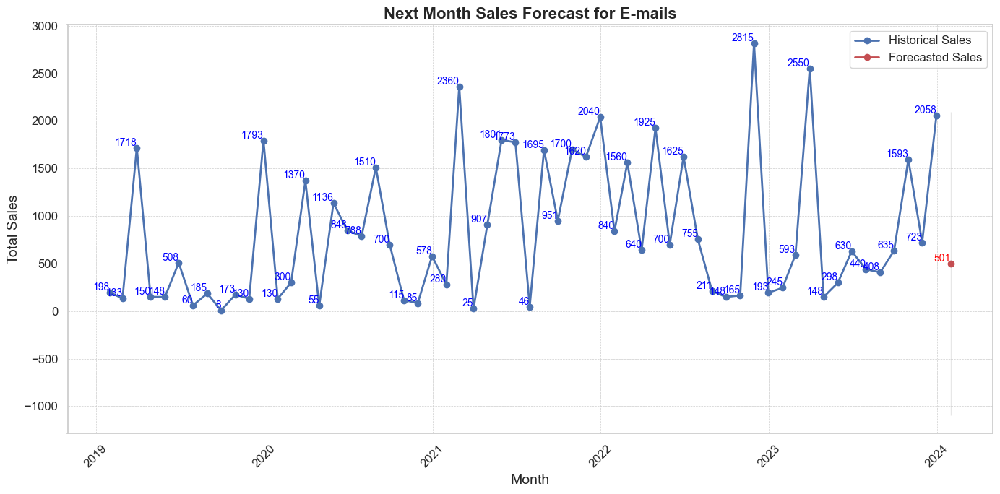

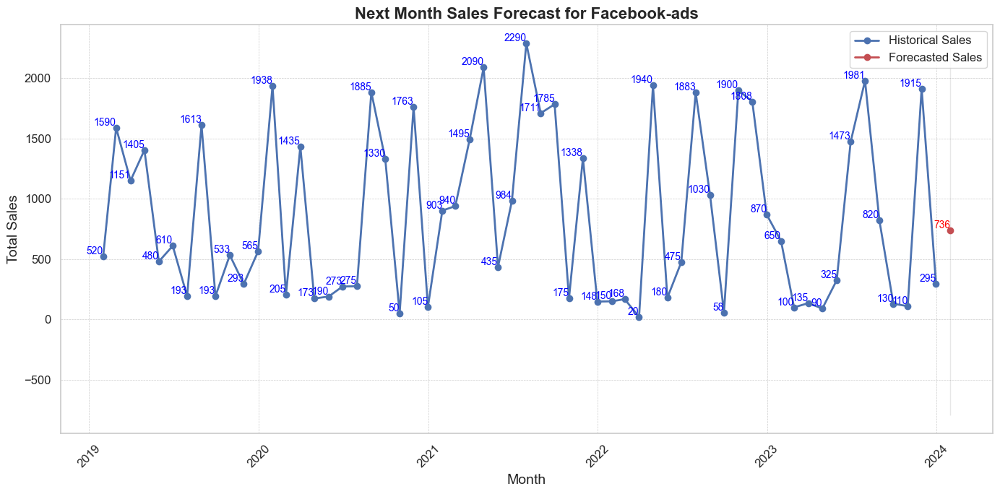

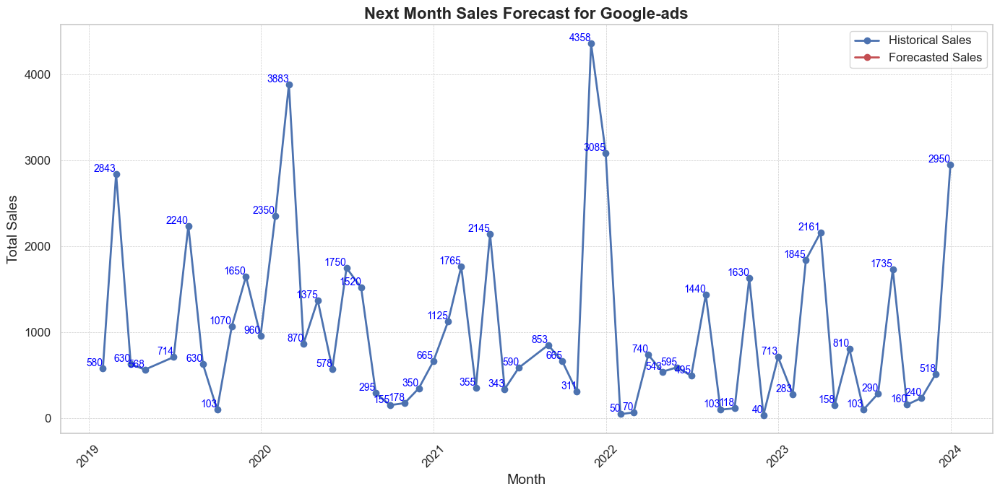

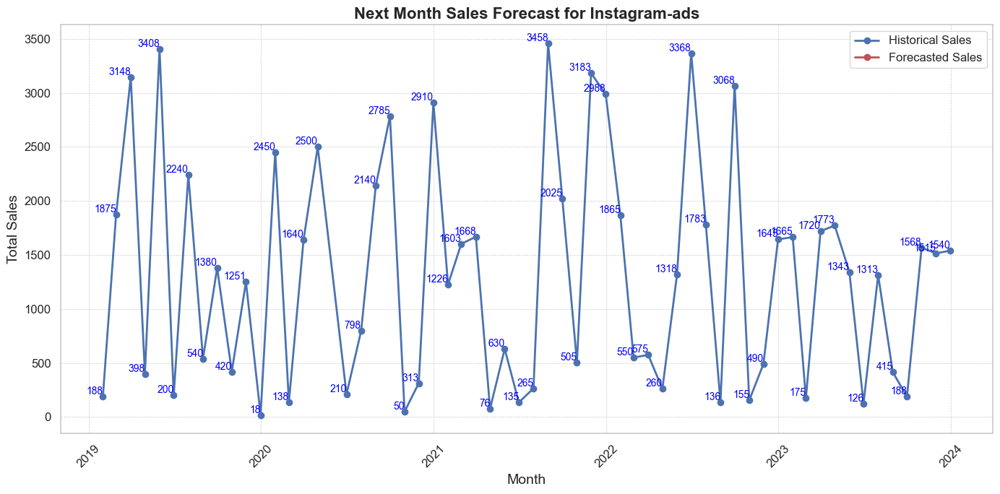

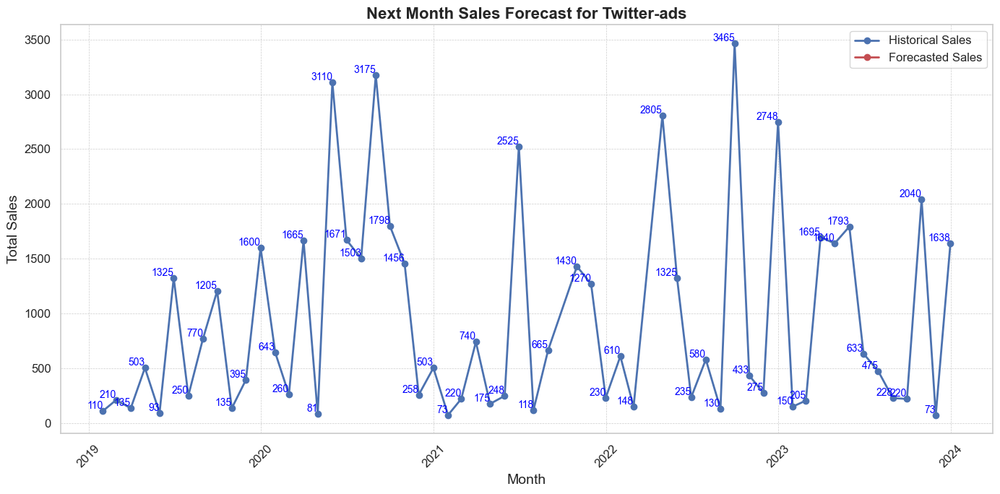

In [192]:
# Ensure 'OrderConfirmationTime' is a datetime column
data['OrderConfirmationTime'] = pd.to_datetime(data['OrderConfirmationTime'], errors='coerce')

# Correct the column name for campaign schema
campaign_column = 'CampaignSchema '

# Aggregate sales by month and campaign
campaign_sales = data.groupby([campaign_column, pd.Grouper(key='OrderConfirmationTime', freq='M')])['Price'].sum().reset_index()

# Check data availability for each campaign
for campaign in campaign_sales[campaign_column].unique():
    campaign_data = campaign_sales[campaign_sales[campaign_column] == campaign]
    print(f"\nData for {campaign}:")
    print(campaign_data)

# Forecast next month's sales for each campaign
campaign_forecasts = {}
for campaign in campaign_sales[campaign_column].unique():
    campaign_data = campaign_sales[campaign_sales[campaign_column] == campaign].set_index('OrderConfirmationTime')['Price']
    
    # Clean the campaign data
    campaign_data = campaign_data.replace([np.inf, -np.inf], np.nan).dropna()
    
    if len(campaign_data) < 12:
        print(f"Insufficient data for SARIMA model for campaign {campaign}")
        continue
    
    try:
        # Fit SARIMA model with seasonal component for monthly data
        sarima_model = SARIMAX(campaign_data, order=(1, 1, 1), seasonal_order=(1, 1, 1, 12))
        sarima_result = sarima_model.fit(disp=False)
        
        # Forecast for the next month
        forecast_steps = 1
        forecast = sarima_result.get_forecast(steps=forecast_steps)
        forecast_values = forecast.predicted_mean
        forecast_conf_int = forecast.conf_int()
        
        # Create a DataFrame for the forecasted sales
        forecast_dates = pd.date_range(start=campaign_data.index[-1] + pd.DateOffset(months=1), periods=forecast_steps, freq='M')
        forecast_data = pd.DataFrame({'Forecast': forecast_values, 'Lower Conf Int': forecast_conf_int.iloc[:, 0], 'Upper Conf Int': forecast_conf_int.iloc[:, 1]}, index=forecast_dates)
        
        campaign_forecasts[campaign] = forecast_data
    except Exception as e:
        print(f"Error fitting SARIMA model for campaign {campaign}: {e}")

# Plot the forecasts for each campaign separately
for campaign, forecast_data in campaign_forecasts.items():
    campaign_data = campaign_sales[campaign_sales[campaign_column] == campaign].set_index('OrderConfirmationTime')['Price']
    campaign_data = campaign_data.replace([np.inf, -np.inf], np.nan).dropna()  # Clean the campaign data
    
    if campaign_data.empty or forecast_data.empty:
        print(f"No valid data to plot for campaign {campaign}")
        continue
    
    plt.figure(figsize=(14, 7))
    plt.plot(campaign_data.index, campaign_data, label='Historical Sales', marker='o', linestyle='-', linewidth=2)
    plt.plot(forecast_data.index, forecast_data['Forecast'], label='Forecasted Sales', marker='o', linestyle='-', linewidth=2, color='r')
    plt.fill_between(forecast_data.index, forecast_data['Lower Conf Int'], forecast_data['Upper Conf Int'], color='k', alpha=0.1)
    
    # Add data labels for historical data
    for x, y in zip(campaign_data.index, campaign_data):
        if np.isfinite(y):
            plt.text(x, y, f'{y:.0f}', ha='right', va='bottom', fontsize=10, color='blue')
        
    # Add data labels for forecasted data
    for x, y in zip(forecast_data.index, forecast_data['Forecast']):
        if np.isfinite(y):
            plt.text(x, y, f'{y:.0f}', ha='right', va='bottom', fontsize=10, color='red')
    
    plt.title(f'Next Month Sales Forecast for {campaign}', fontsize=16, fontweight='bold')
    plt.xlabel('Month', fontsize=14)
    plt.ylabel('Total Sales', fontsize=14)
    plt.legend(fontsize=12)
    plt.grid(True, which='both', linestyle='--', linewidth=0.5)
    plt.xticks(fontsize=12, rotation=45)
    plt.yticks(fontsize=12)
    plt.tight_layout()
    
    # Save the plot
    plt.savefig(f'sales_forecast_{campaign.strip()}.png')
    plt.show()

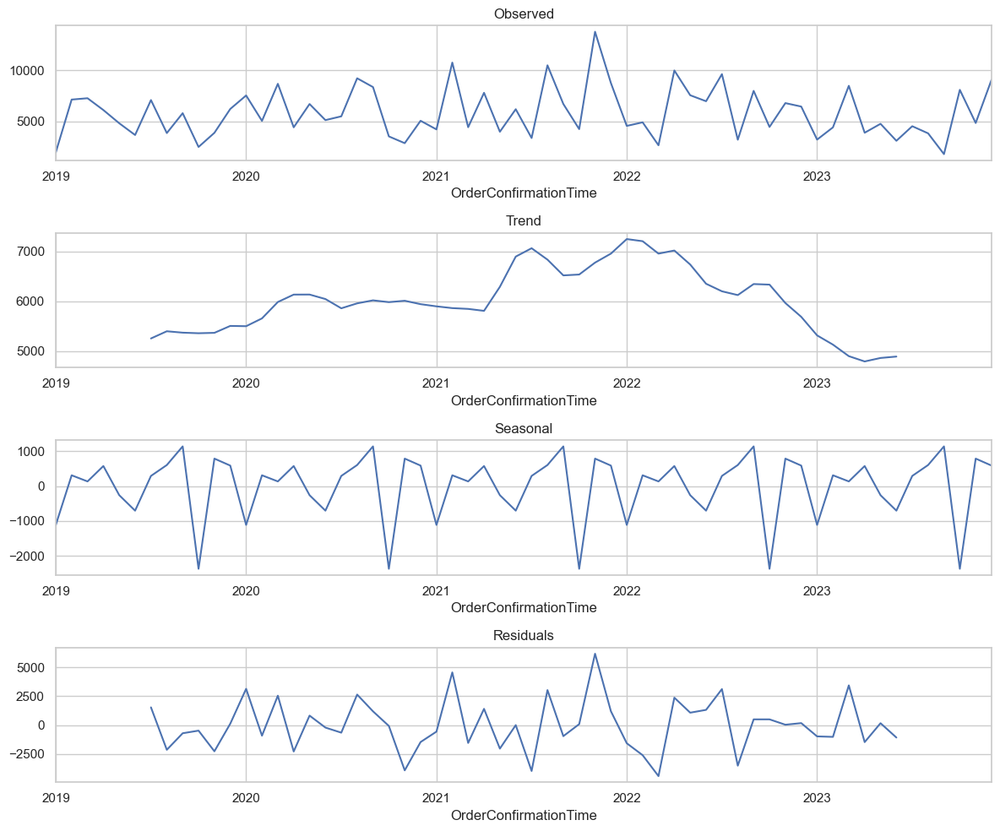

In [193]:
# Ensure 'OrderConfirmationTime' is a datetime column
data['OrderConfirmationTime'] = pd.to_datetime(data['OrderConfirmationTime'], errors='coerce')

# Aggregate sales by month
monthly_sales = data.resample('M', on='OrderConfirmationTime')['Price'].sum()

# Decompose the time series
decomposition = seasonal_decompose(monthly_sales, model='additive')

# Plot the decomposed components
fig, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, figsize=(12,10))
decomposition.observed.plot(ax=ax1, title='Observed')
decomposition.trend.plot(ax=ax2, title='Trend')
decomposition.seasonal.plot(ax=ax3, title='Seasonal')
decomposition.resid.plot(ax=ax4, title='Residuals')
plt.tight_layout()
plt.show()

In [194]:
# Print column names
print(data.columns)

Index(['SessionStart', 'CustomerID', 'FullName', 'Gender', 'Age',
       'CreditScore', 'MonthlyIncome', 'Country', 'State', 'City', 'Category',
       'Product', 'Cost', 'Price', 'Quantity', 'CampaignSchema ',
       'CartAdditionTime', 'OrderConfirmation', 'PaymentMethod', 'SessionEnd',
       'OrderReturn', 'ReturnReason', 'OrderConfirmationTime_Copy',
       'OrderConfirmationTime'],
      dtype='object')


In [195]:
# Preprocess data
data = data.set_index('OrderConfirmationTime')['Price'].resample('M').sum()
data = data.dropna()
# Scaling the data
scaler = MinMaxScaler(feature_range=(0, 1))
data_scaled = scaler.fit_transform(data.values.reshape(-1, 1))

#function for LSTM
def prepare_data(series, n_lags):
    X, y = [], []
    for i in range(n_lags, len(series)):
        X.append(series[i-n_lags:i])
        y.append(series[i])
    return np.array(X), np.array(y)
n_lags = 12
X, y = prepare_data(data_scaled, n_lags)

# Reshape data to fit LSTM model
X = X.reshape((X.shape[0], X.shape[1], 1))

# LSTM model
model = Sequential()
model.add(LSTM(50, activation='relu', input_shape=(n_lags, 1)))
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')
model.fit(X, y, epochs=200, batch_size=32, verbose=1)
# Making predictions
predictions = model.predict(X)
predictions = scaler.inverse_transform(predictions)



Epoch 1/200
2/2 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.1729
Epoch 2/200
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.1570 
Epoch 3/200
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.1332 
Epoch 4/200
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.1332 
Epoch 5/200
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.1257 
Epoch 6/200
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.1150 
Epoch 7/200
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.1054 
Epoch 8/200
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 0s/step - loss: 0.0783  
Epoch 9/200
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 0s/step - loss: 0.0703  
Epoch 10/200
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0700 
Epoch 11/200
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0617 
Epoch 12/200
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0573 
Epoch 13/200
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0486 
Epoch 14/200
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0496 
Epoch 15/200
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0485 
Epoch 16/200
2/2 ━━

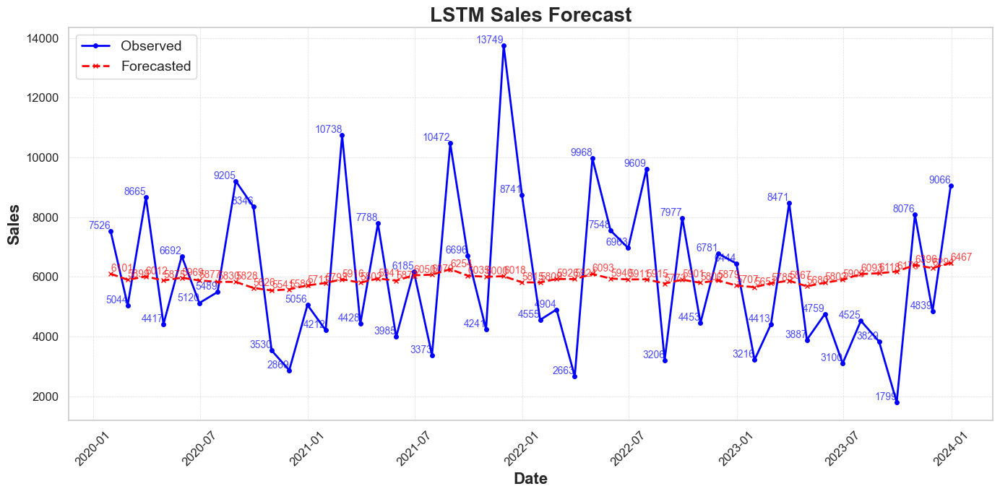

In [196]:
plt.figure(figsize=(14, 7))
plt.plot(monthly_sales.index[n_lags:], monthly_sales.values[n_lags:], label='Observed', color='blue', linestyle='-', linewidth=2, marker='o', 
         markersize=4)

# Plot forecasted sales
plt.plot(monthly_sales.index[n_lags:], predictions, label='Forecasted', color='red', linestyle='--', linewidth=2, marker='x', markersize=4)
plt.title('LSTM Sales Forecast', fontsize=20, fontweight='bold')
plt.xlabel('Date', fontsize=16, fontweight='bold')
plt.ylabel('Sales', fontsize=16, fontweight='bold')
plt.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)
plt.legend(fontsize=14, loc='upper left')
plt.xticks(fontsize=12, rotation=45)
plt.yticks(fontsize=12)
for x, y in zip(monthly_sales.index[n_lags:], monthly_sales.values[n_lags:]):
    plt.text(x, y, f'{y:.0f}', ha='right', va='bottom', fontsize=10, color='blue', alpha=0.7)

for x, y in zip(monthly_sales.index[n_lags:], predictions.flatten()):
    plt.text(x, y, f'{y:.0f}', ha='left', va='bottom', fontsize=10, color='red', alpha=0.7)

plt.tight_layout()
plt.show()


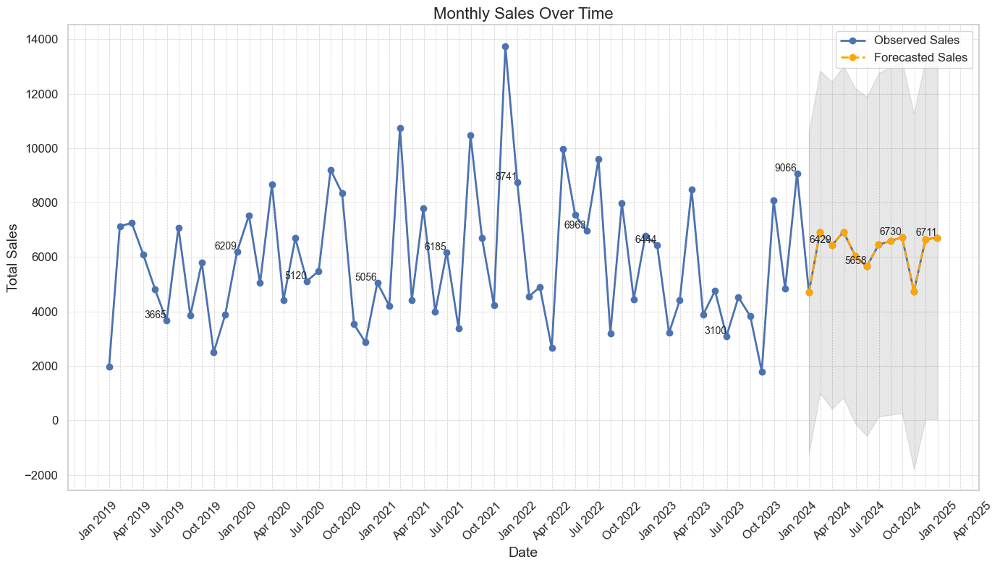

Mean Absolute Error (MAE): 2407.9156648752783
Root Mean Squared Error (RMSE): 3094.4723995065856
Mean Absolute Percentage Error (MAPE): 52.16374024534708%
Cross-Validation MAE: 3392.4311374541385
Cross-Validation RMSE: 3962.8428221503796
Cross-Validation MAPE: 73.03819422861338%


In [197]:
# Fit the SARIMA model with adjusted parameters and increased iterations
sarima_model = SARIMAX(monthly_data['Price'], order=(1, 1, 1), seasonal_order=(1, 1, 1, 12))
sarima_result = sarima_model.fit(disp=False, maxiter=1000)

# Calculate the number of months to forecast until the end of 2024
last_date = monthly_data.index[-1]
end_date = pd.Timestamp('2024-12-31')
forecast_steps = (end_date.year - last_date.year) * 12 + (end_date.month - last_date.month)

# Forecast the required number of months
forecast = sarima_result.get_forecast(steps=forecast_steps)
forecast_values = forecast.predicted_mean
forecast_conf_int = forecast.conf_int()

# Create a DataFrame for the forecasted sales
forecast_dates = pd.date_range(start=monthly_data.index[-1] + pd.DateOffset(months=1), periods=forecast_steps, freq='ME')
forecast_data = pd.DataFrame({'Price': forecast_values, 'Lower Conf Int': forecast_conf_int.iloc[:, 0], 'Upper Conf Int': forecast_conf_int.iloc[:, 1]}, index=forecast_dates)

# Concatenate the historical and forecasted sales data
extended_data = pd.concat([monthly_data, forecast_data])

# Plot monthly sales over time with aesthetics and data labels
plt.figure(figsize=(14, 8))
plt.plot(extended_data.index, extended_data['Price'], label='Observed Sales', marker='o', color='b', linestyle='-', linewidth=2, markersize=6)
plt.plot(forecast_dates, forecast_values, label='Forecasted Sales', marker='o', color='orange', linestyle='--', linewidth=2, markersize=6)
plt.fill_between(forecast_dates, forecast_conf_int.iloc[:, 0], forecast_conf_int.iloc[:, 1], color='k', alpha=0.1)
plt.title('Monthly Sales Over Time', fontsize=16)
plt.xlabel('Date', fontsize=14)
plt.ylabel('Total Sales', fontsize=14)
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.legend(fontsize=12)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

# Add data labels for forecasted data every 3 months to reduce clutter
for x, y in zip(forecast_data.index, forecast_data['Price']):
    if x.month % 3 == 0:  # Label every 3 months
        plt.text(x, y, f'{y:.0f}', ha='right', va='bottom', fontsize=10)

# Add data labels for observed data
for x, y in zip(monthly_data.index, monthly_data['Price']):
    if x.month % 6 == 0:  # Label every 6 months for observed data
        plt.text(x, y, f'{y:.0f}', ha='right', va='bottom', fontsize=10)

# Rotate the x-axis labels for better readability
plt.xticks(rotation=45)

# Format the x-axis to show major months only
ax = plt.gca()
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=3))  # Show labels every 3 months
ax.xaxis.set_minor_locator(mdates.MonthLocator())  # Minor ticks every month
ax.grid(True, which='both', linestyle='--', linewidth=0.5)

# Show the plot
plt.tight_layout()
plt.show()

# Evaluate the model using various metrics
y_true = monthly_data['Price']
y_pred = sarima_result.predict(start=0, end=len(y_true)-1)
mae = mean_absolute_error(y_true, y_pred)
rmse = np.sqrt(mean_squared_error(y_true, y_pred))
mape = np.mean(np.abs((y_true - y_pred) / y_true)) * 100

print(f'Mean Absolute Error (MAE): {mae}')
print(f'Root Mean Squared Error (RMSE): {rmse}')
print(f'Mean Absolute Percentage Error (MAPE): {mape}%')

# Cross-validation using TimeSeriesSplit
tscv = TimeSeriesSplit(n_splits=5)
mae_cv = []
rmse_cv = []
mape_cv = []

for train_index, test_index in tscv.split(monthly_data):
    train, test = monthly_data.iloc[train_index], monthly_data.iloc[test_index]
    model_cv = SARIMAX(train['Price'], order=(1, 1, 1), seasonal_order=(1, 1, 1, 12))
    result_cv = model_cv.fit(disp=False)
    forecast_cv = result_cv.predict(start=test.index[0], end=test.index[-1])
    
    mae_cv.append(mean_absolute_error(test['Price'], forecast_cv))
    rmse_cv.append(np.sqrt(mean_squared_error(test['Price'], forecast_cv)))
    mape_cv.append(np.mean(np.abs((test['Price'] - forecast_cv) / test['Price'])) * 100)

print(f'Cross-Validation MAE: {np.mean(mae_cv)}')
print(f'Cross-Validation RMSE: {np.mean(rmse_cv)}')
print(f'Cross-Validation MAPE: {np.mean(mape_cv)}%')


In [198]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Comprehensive Evaluation Metrics
def evaluate_forecast(y_true, y_pred):
    mae = mean_absolute_error(y_true, y_pred)
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mape = np.mean(np.abs((y_true - y_pred) / y_true)) * 100
    r2 = r2_score(y_true, y_pred)
    return mae, rmse, mape, r2

# Display the evaluation metrics
def display_metrics(model_name, mae, rmse, mape, r2):
    print(f'{model_name} - MAE: {mae:.2f}, RMSE: {rmse:.2f}, MAPE: {mape:.2f}%, R2: {r2:.2f}')


In [199]:
# Fit the SARIMA model
sarima_model = SARIMAX(monthly_sales, order=(1, 1, 1), seasonal_order=(1, 1, 1, 12))
sarima_result = sarima_model.fit(disp=False)

# Forecast the next 12 months
forecast_steps = 12
sarima_forecast = sarima_result.get_forecast(steps=forecast_steps)
sarima_forecast_values = sarima_forecast.predicted_mean
sarima_conf_int = sarima_forecast.conf_int()

# Extract observed and predicted values for evaluation
sarima_y_true = monthly_sales[-forecast_steps:]
sarima_y_pred = sarima_forecast_values[:forecast_steps]
sarima_mae, sarima_rmse, sarima_mape, sarima_r2 = evaluate_forecast(sarima_y_true, sarima_y_pred)

# Display SARIMA metrics
display_metrics('SARIMA', sarima_mae, sarima_rmse, sarima_mape, sarima_r2)


SARIMA - MAE: 2502.84, RMSE: 2671.88, MAPE: nan%, R2: -0.47


In [200]:
# Prepare the data for LSTM
n_lags = 12
X, y = prepare_data(data_scaled, n_lags)

# Reshape data to fit LSTM model
X = X.reshape((X.shape[0], X.shape[1], 1))

# Build the LSTM model
lstm_model = Sequential()
lstm_model.add(LSTM(50, activation='relu', input_shape=(n_lags, 1)))
lstm_model.add(Dense(1))
lstm_model.compile(optimizer='adam', loss='mse')

# Fit the model
lstm_model.fit(X, y, epochs=200, batch_size=32, verbose=1)

# Make predictions
lstm_predictions = lstm_model.predict(X)
lstm_predictions = scaler.inverse_transform(lstm_predictions)

# Extract observed and predicted values for evaluation
lstm_y_true = monthly_sales[n_lags:].values
lstm_y_pred = lstm_predictions.flatten()
lstm_mae, lstm_rmse, lstm_mape, lstm_r2 = evaluate_forecast(lstm_y_true, lstm_y_pred)

# Display LSTM metrics
display_metrics('LSTM', lstm_mae, lstm_rmse, lstm_mape, lstm_r2)


Epoch 1/200
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.2544
Epoch 2/200
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.2228 
Epoch 3/200
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.2007
Epoch 4/200
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.1975 
Epoch 5/200
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 0s/step - loss: 0.1794  
Epoch 6/200
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 0s/step - loss: 0.1562  
Epoch 7/200
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.1537 
Epoch 8/200
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1315 
Epoch 9/200
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.1166
Epoch 10/200
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.1226 
Epoch 11/200
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.1159 
Epoch 12/200
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 0s/step - loss: 0.0975  
Epoch 13/200
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0890 
Epoch 14/200
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0892
Epoch 15/200
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0729
Epoch 16/200
2/2 ━━━

In [201]:
# Forecast next 12 months using LSTM model
X_last = data_scaled[-n_lags:]
X_last = X_last.reshape((1, n_lags, 1))
lstm_forecast_scaled = []
for _ in range(forecast_steps):
    pred = lstm_model.predict(X_last)
    lstm_forecast_scaled.append(pred[0, 0])
    X_last = np.append(X_last[:, 1:, :], [[[pred[0, 0]]]], axis=1)
lstm_forecast_values = scaler.inverse_transform(np.array(lstm_forecast_scaled).reshape(-1, 1))

# Create a DataFrame for the LSTM forecasted sales
lstm_forecast_dates = pd.date_range(start=monthly_sales.index[-1] + pd.DateOffset(months=1), periods=forecast_steps, freq='M')
lstm_forecast_data = pd.DataFrame({'Price': lstm_forecast_values.flatten()}, index=lstm_forecast_dates)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


<function matplotlib.pyplot.tight_layout(*, pad: 'float' = 1.08, h_pad: 'float | None' = None, w_pad: 'float | None' = None, rect: 'tuple[float, float, float, float] | None' = None) -> 'None'>

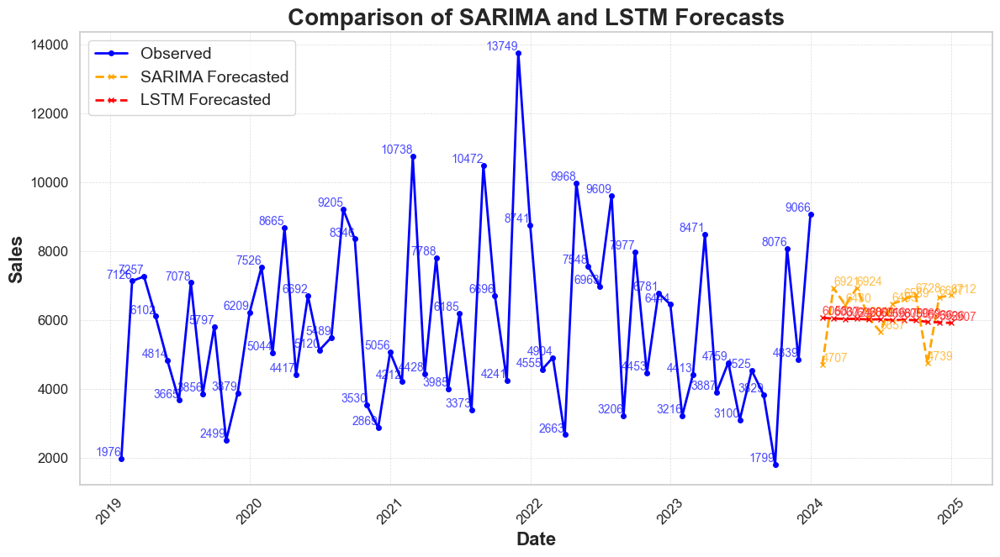

In [202]:
# Forecast next 12 months using LSTM model
X_last = data_scaled[-n_lags:]
X_last = X_last.reshape((1, n_lags, 1))
lstm_forecast_scaled = []
for _ in range(forecast_steps):
    pred = lstm_model.predict(X_last)
    lstm_forecast_scaled.append(pred[0, 0])
    X_last = np.append(X_last[:, 1:, :], [[[pred[0, 0]]]], axis=1)
lstm_forecast_values = scaler.inverse_transform(np.array(lstm_forecast_scaled).reshape(-1, 1))

# Create a DataFrame for the LSTM forecasted sales
lstm_forecast_dates = pd.date_range(start=monthly_sales.index[-1] + pd.DateOffset(months=1), periods=forecast_steps, freq='M')
lstm_forecast_data = pd.DataFrame({'Price': lstm_forecast_values.flatten()}, index=lstm_forecast_dates)

# Plot the results for comparison
plt.figure(figsize=(14, 7))

# Plot observed sales
plt.plot(monthly_sales.index, monthly_sales.values, label='Observed', color='blue', linestyle='-', linewidth=2, marker='o', markersize=4)

# Plot SARIMA forecasted sales
plt.plot(sarima_forecast_values.index, sarima_forecast_values, label='SARIMA Forecasted', color='orange', linestyle='--', linewidth=2, marker='x', markersize=4)

# Plot LSTM forecasted sales
plt.plot(lstm_forecast_data.index, lstm_forecast_data['Price'], label='LSTM Forecasted', color='red', linestyle='--', linewidth=2, marker='x', markersize=4)

# Add title and labels with custom font sizes and weights
plt.title('Comparison of SARIMA and LSTM Forecasts', fontsize=20, fontweight='bold')
plt.xlabel('Date', fontsize=16, fontweight='bold')
plt.ylabel('Sales', fontsize=16, fontweight='bold')

# Add grid lines with custom styles
plt.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)

# Customize legend
plt.legend(fontsize=14, loc='upper left')

# Customize x and y axis ticks
plt.xticks(fontsize=12, rotation=45)
plt.yticks(fontsize=12)

# Add data labels for observed values
for x, y in zip(monthly_sales.index, monthly_sales.values):
    plt.text(x, y, f'{y:.0f}', ha='right', va='bottom', fontsize=10, color='blue', alpha=0.7)

# Add data labels for forecasted values (SARIMA)
for x, y in zip(sarima_forecast_values.index, sarima_forecast_values):
    plt.text(x, y, f'{y:.0f}', ha='left', va='bottom', fontsize=10, color='orange', alpha=0.7)

# Add data labels for forecasted values (LSTM)
for x, y in zip(lstm_forecast_data.index, lstm_forecast_data['Price']):
    plt.text(x, y, f'{y:.0f}', ha='left', va='bottom', fontsize=10, color='red', alpha=0.7)

# Tight layout for better spacing
plt.tight_layout



Data for Billboard-QR code:
      CampaignSchema  OrderConfirmationTime  Price
0   Billboard-QR code            2019-01-31    380
1   Billboard-QR code            2019-02-28    475
2   Billboard-QR code            2019-03-31    475
3   Billboard-QR code            2019-04-30   3078
4   Billboard-QR code            2019-05-31    685
5   Billboard-QR code            2019-06-30    308
6   Billboard-QR code            2019-07-31   2095
7   Billboard-QR code            2019-08-31    118
8   Billboard-QR code            2019-09-30   2908
9   Billboard-QR code            2019-10-31    168
10  Billboard-QR code            2019-11-30    160
11  Billboard-QR code            2019-12-31   1273
12  Billboard-QR code            2020-01-31     15
13  Billboard-QR code            2020-02-29    258
14  Billboard-QR code            2020-03-31   1685
15  Billboard-QR code            2020-04-30    233
16  Billboard-QR code            2020-05-31   1678
17  Billboard-QR code            2020-06-30    368
18

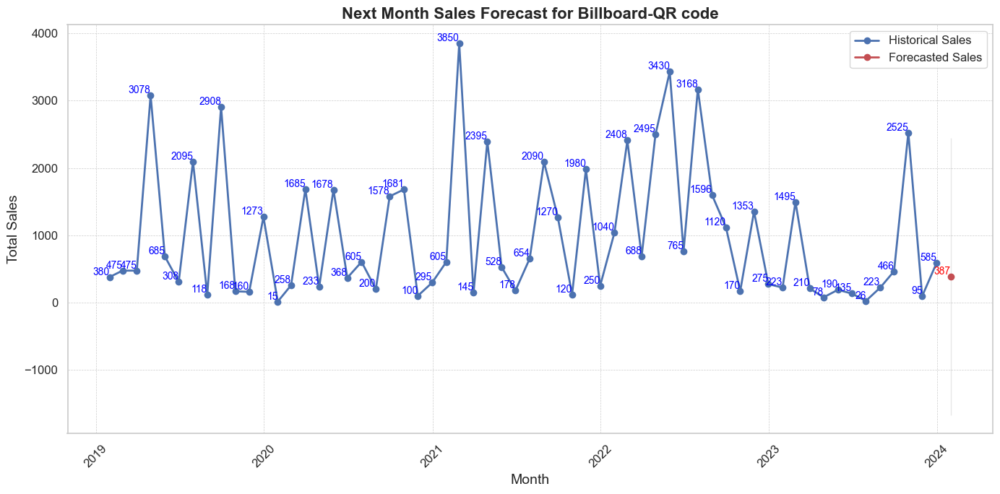

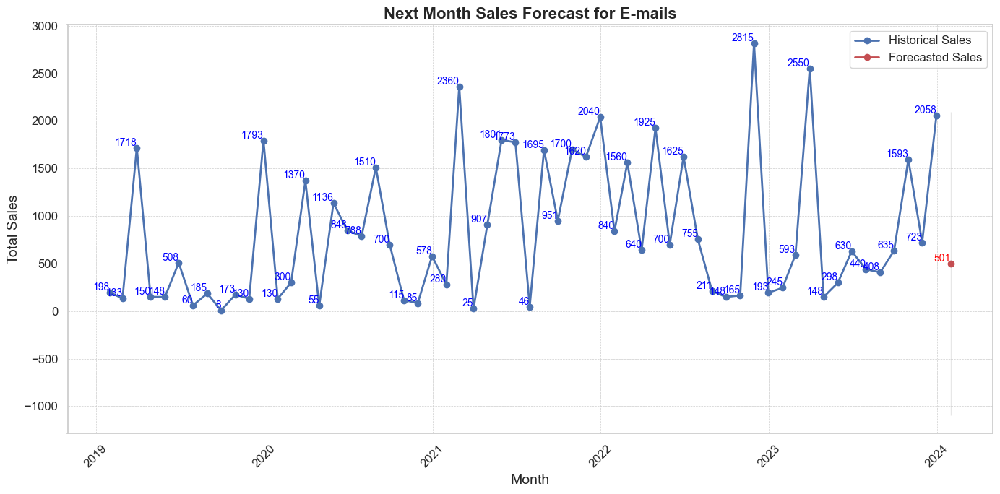

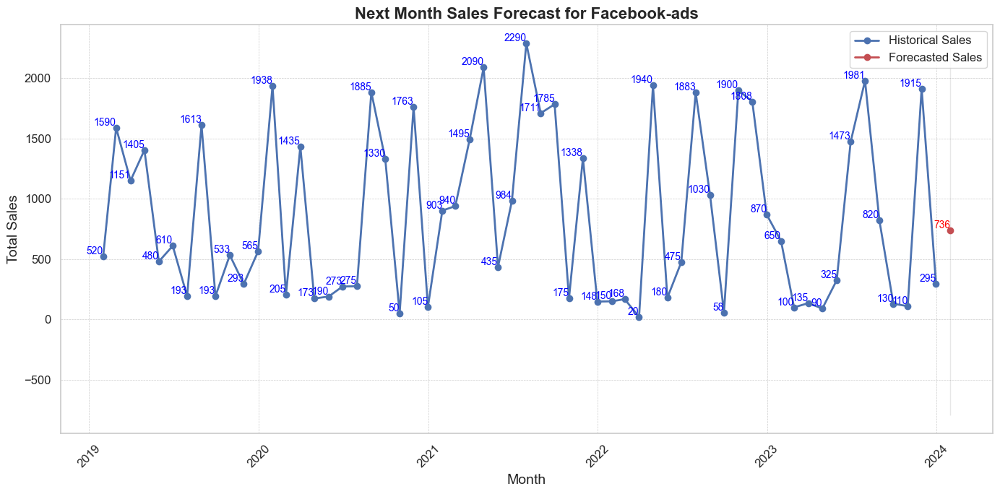

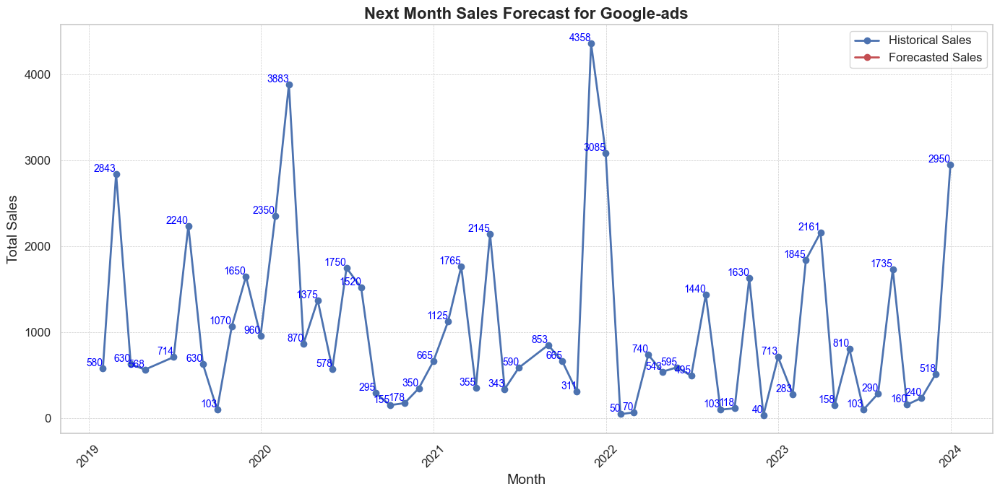

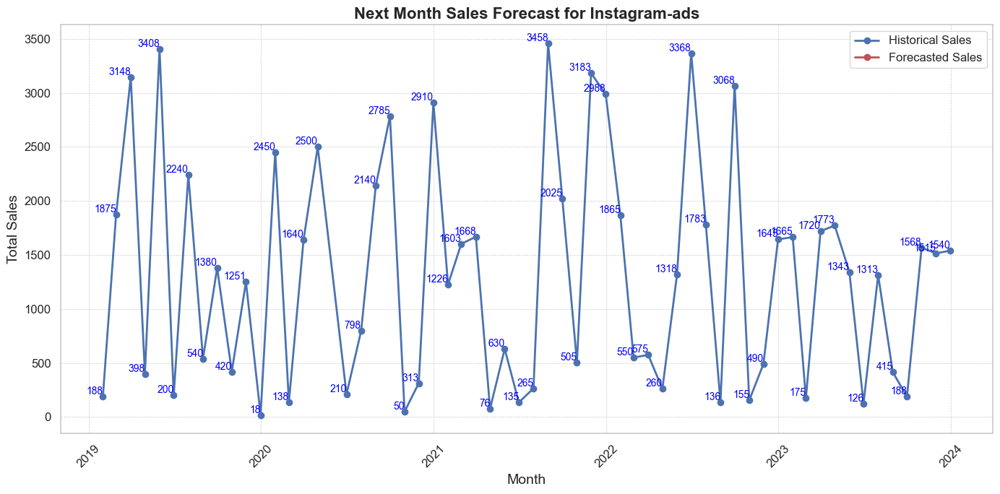

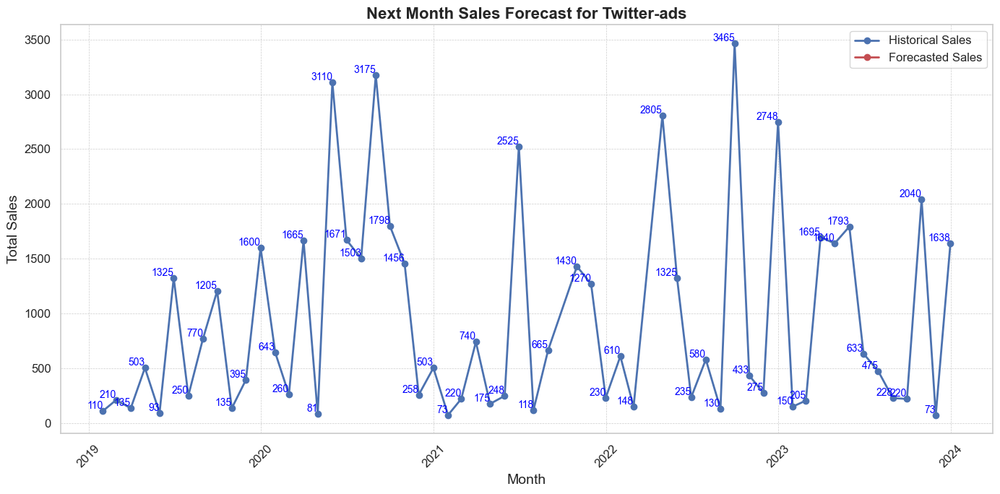

In [203]:
# Check data availability for each campaign
for campaign in campaign_sales[campaign_column].unique():
    campaign_data = campaign_sales[campaign_sales[campaign_column] == campaign]
    print(f"\nData for {campaign}:")
    print(campaign_data)

# Forecast next month's sales for each campaign
campaign_forecasts = {}
for campaign in campaign_sales[campaign_column].unique():
    campaign_data = campaign_sales[campaign_sales[campaign_column] == campaign].set_index('OrderConfirmationTime')['Price']
    
    # Clean the campaign data
    campaign_data = campaign_data.replace([np.inf, -np.inf], np.nan).dropna()
    
    if len(campaign_data) < 12:
        print(f"Insufficient data for SARIMA model for campaign {campaign}")
        continue
    
    try:
        # Fit SARIMA model with seasonal component for monthly data
        sarima_model = SARIMAX(campaign_data, order=(1, 1, 1), seasonal_order=(1, 1, 1, 12))
        sarima_result = sarima_model.fit(disp=False)
        
        # Forecast for the next month
        forecast_steps = 1
        forecast = sarima_result.get_forecast(steps=forecast_steps)
        forecast_values = forecast.predicted_mean
        forecast_conf_int = forecast.conf_int()
        
        # Create a DataFrame for the forecasted sales
        forecast_dates = pd.date_range(start=campaign_data.index[-1] + pd.DateOffset(months=1), periods=forecast_steps, freq='M')
        forecast_data = pd.DataFrame({'Forecast': forecast_values, 'Lower Conf Int': forecast_conf_int.iloc[:, 0], 'Upper Conf Int': forecast_conf_int.iloc[:, 1]}, index=forecast_dates)
        
        campaign_forecasts[campaign] = forecast_data
    except Exception as e:
        print(f"Error fitting SARIMA model for campaign {campaign}: {e}")

# Plot the forecasts for each campaign separately
for campaign, forecast_data in campaign_forecasts.items():
    campaign_data = campaign_sales[campaign_sales[campaign_column] == campaign].set_index('OrderConfirmationTime')['Price']
    campaign_data = campaign_data.replace([np.inf, -np.inf], np.nan).dropna()  # Clean the campaign data
    
    if campaign_data.empty or forecast_data.empty:
        print(f"No valid data to plot for campaign {campaign}")
        continue
    
    plt.figure(figsize=(14, 7))
    plt.plot(campaign_data.index, campaign_data, label='Historical Sales', marker='o', linestyle='-', linewidth=2)
    plt.plot(forecast_data.index, forecast_data['Forecast'], label='Forecasted Sales', marker='o', linestyle='-', linewidth=2, color='r')
    plt.fill_between(forecast_data.index, forecast_data['Lower Conf Int'], forecast_data['Upper Conf Int'], color='k', alpha=0.1)
    
    # Add data labels for historical data
    for x, y in zip(campaign_data.index, campaign_data):
        if np.isfinite(y):
            plt.text(x, y, f'{y:.0f}', ha='right', va='bottom', fontsize=10, color='blue')
        
    # Add data labels for forecasted data
    for x, y in zip(forecast_data.index, forecast_data['Forecast']):
        if np.isfinite(y):
            plt.text(x, y, f'{y:.0f}', ha='right', va='bottom', fontsize=10, color='red')
    
    plt.title(f'Next Month Sales Forecast for {campaign}', fontsize=16, fontweight='bold')
    plt.xlabel('Month', fontsize=14)
    plt.ylabel('Total Sales', fontsize=14)
    plt.legend(fontsize=12)
    plt.grid(True, which='both', linestyle='--', linewidth=0.5)
    plt.xticks(fontsize=12, rotation=45)
    plt.yticks(fontsize=12)
    plt.tight_layout()
    
    # Save the plot
    plt.savefig(f'sales_forecast_{campaign.strip()}.png')
    plt.show()


Data for Billboard-QR code:
      CampaignSchema  OrderConfirmationTime  Price
1   Billboard-QR code            2019-04-30      8
2   Billboard-QR code            2019-05-31    118
3   Billboard-QR code            2019-06-30     25
4   Billboard-QR code            2019-07-31    435
5   Billboard-QR code            2019-08-31    500
6   Billboard-QR code            2019-09-30    580
7   Billboard-QR code            2019-10-31    135
9   Billboard-QR code            2019-12-31    550
10  Billboard-QR code            2020-01-31     35
12  Billboard-QR code            2020-04-30     60
13  Billboard-QR code            2020-05-31     28
14  Billboard-QR code            2020-06-30    115
15  Billboard-QR code            2020-08-31     25
16  Billboard-QR code            2020-09-30    240
17  Billboard-QR code            2020-10-31    108
18  Billboard-QR code            2020-12-31    170
19  Billboard-QR code            2021-01-31     25
20  Billboard-QR code            2021-02-28    675
21

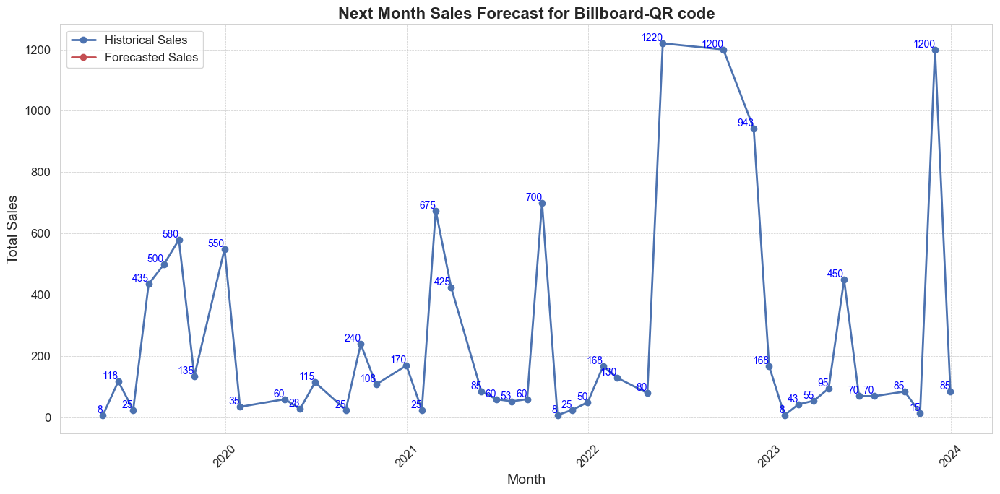

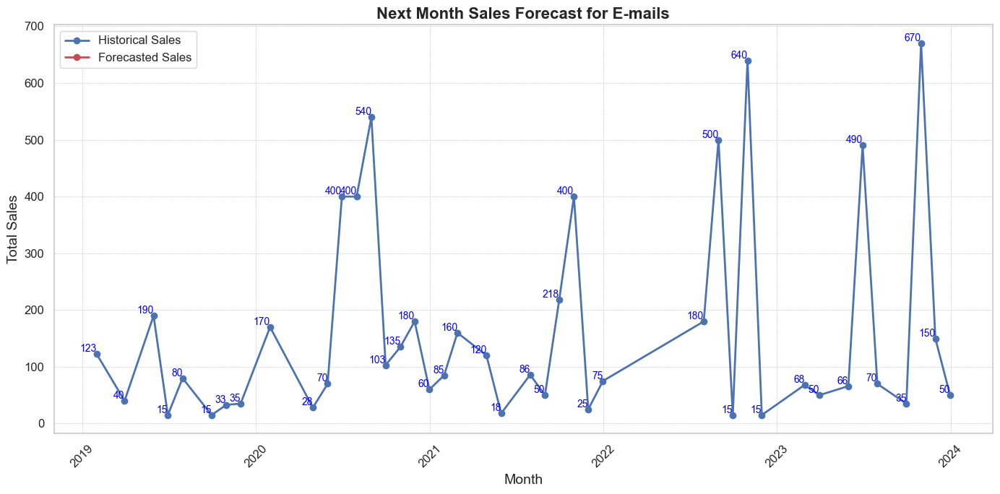

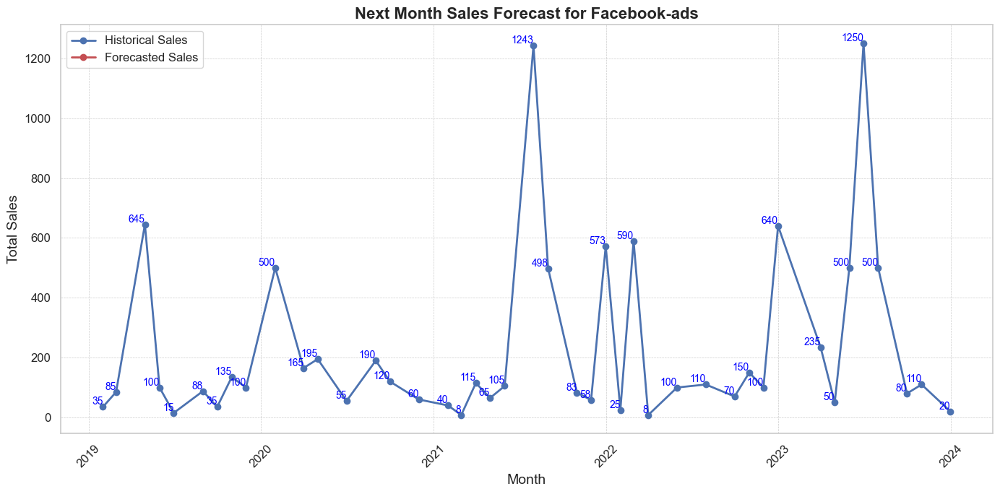

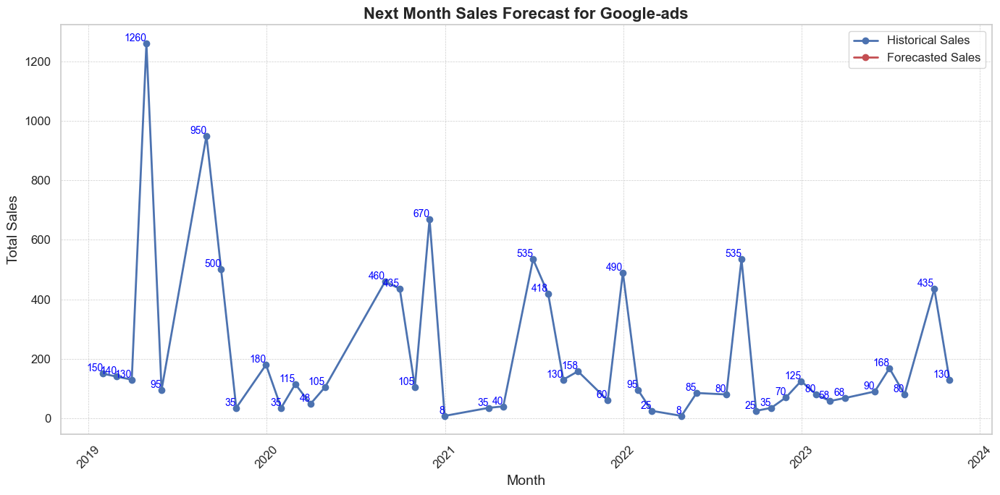

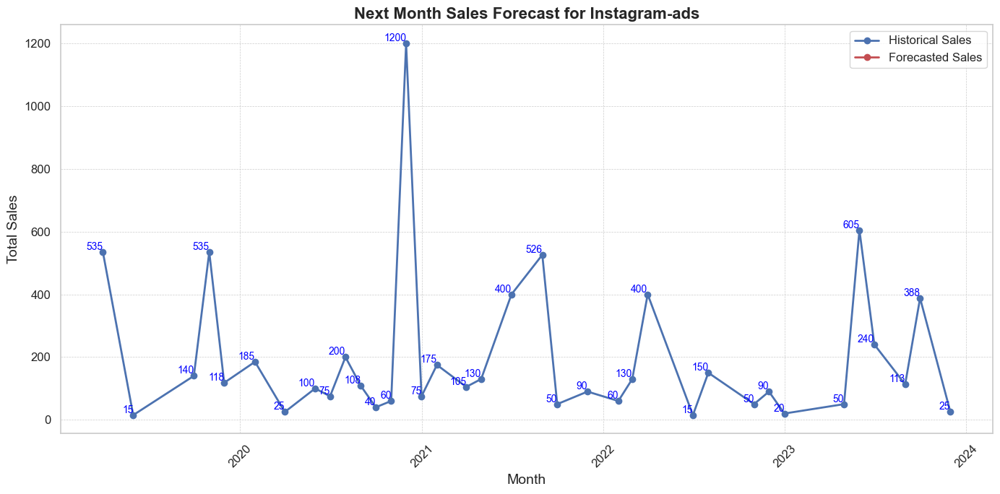

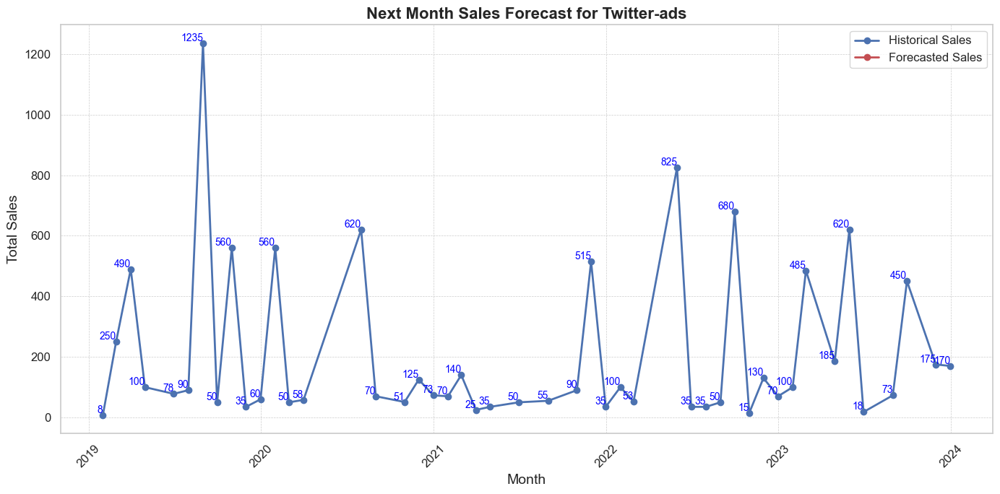

In [207]:
import warnings
from datetime import datetime
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Suppress warnings
warnings.filterwarnings("ignore")

# Load the dataset
#file_path = '\Users\Kumbhar\Desktop\DATASETS\Forecasting'
data = pd.read_csv('Customer360Insights.csv')

# Ensure 'OrderConfirmationTime' is a datetime column
data['OrderConfirmationTime'] = pd.to_datetime(data['OrderConfirmationTime'], errors='coerce')

# Correct the column name for campaign schema
campaign_column = 'CampaignSchema '

# Aggregate sales by month and campaign
campaign_sales = data.groupby([campaign_column, pd.Grouper(key='OrderConfirmationTime', freq='M')])['Price'].sum().reset_index()

# Detect and remove outliers
def remove_outliers(df, column):
    q1 = df[column].quantile(0.25)
    q3 = df[column].quantile(0.75)
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr
    return df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]

campaign_sales = remove_outliers(campaign_sales, 'Price')

# Check data availability for each campaign
for campaign in campaign_sales[campaign_column].unique():
    campaign_data = campaign_sales[campaign_sales[campaign_column] == campaign]
    print(f"\nData for {campaign}:")
    print(campaign_data)

# Ensure the campaigns of interest are present
required_campaigns = ['Google Ads', 'Instagram Ads', 'Twitter Ads']
for campaign in required_campaigns:
    if campaign not in campaign_sales[campaign_column].unique():
        print(f"Warning: No data available for {campaign}")

# Forecast next month's sales for each campaign
campaign_forecasts = {}
for campaign in campaign_sales[campaign_column].unique():
    campaign_data = campaign_sales[campaign_sales[campaign_column] == campaign].set_index('OrderConfirmationTime')['Price']
    
    # Clean the campaign data
    campaign_data = campaign_data.replace([np.inf, -np.inf], np.nan).dropna()
    
    if len(campaign_data) < 12:
        print(f"Insufficient data for SARIMA model for campaign {campaign}")
        continue
    
    try:
        # Fit SARIMA model with seasonal component for monthly data
        sarima_model = SARIMAX(campaign_data, order=(1, 1, 1), seasonal_order=(1, 1, 1, 12))
        sarima_result = sarima_model.fit(disp=False)
        
        # Forecast for the next month
        forecast_steps = 1
        forecast = sarima_result.get_forecast(steps=forecast_steps)
        forecast_values = forecast.predicted_mean
        forecast_conf_int = forecast.conf_int()
        
        # Create a DataFrame for the forecasted sales
        forecast_dates = pd.date_range(start=campaign_data.index[-1] + pd.DateOffset(months=1), periods=forecast_steps, freq='M')
        forecast_data = pd.DataFrame({'Forecast': forecast_values, 'Lower Conf Int': forecast_conf_int.iloc[:, 0], 'Upper Conf Int': forecast_conf_int.iloc[:, 1]}, index=forecast_dates)
        
        campaign_forecasts[campaign] = forecast_data
    except Exception as e:
        print(f"Error fitting SARIMA model for campaign {campaign}: {e}")

# Plot the forecasts for each campaign separately
for campaign, forecast_data in campaign_forecasts.items():
    campaign_data = campaign_sales[campaign_sales[campaign_column] == campaign].set_index('OrderConfirmationTime')['Price']
    campaign_data = campaign_data.replace([np.inf, -np.inf], np.nan).dropna()  # Clean the campaign data
    
    if campaign_data.empty or forecast_data.empty:
        print(f"No valid data to plot for campaign {campaign}")
        continue
    
    plt.figure(figsize=(14, 7))
    plt.plot(campaign_data.index, campaign_data, label='Historical Sales', marker='o', linestyle='-', linewidth=2)
    plt.plot(forecast_data.index, forecast_data['Forecast'], label='Forecasted Sales', marker='o', linestyle='-', linewidth=2, color='r')
    plt.fill_between(forecast_data.index, forecast_data['Lower Conf Int'], forecast_data['Upper Conf Int'], color='k', alpha=0.1)
    
    # Add data labels for historical data
    for x, y in zip(campaign_data.index, campaign_data):
        if np.isfinite(y):
            plt.text(x, y, f'{y:.0f}', ha='right', va='bottom', fontsize=10, color='blue')
        
    # Add data labels for forecasted data
    for x, y in zip(forecast_data.index, forecast_data['Forecast']):
        if np.isfinite(y):
            plt.text(x, y, f'{y:.0f}', ha='right', va='bottom', fontsize=10, color='red')
    
    plt.title(f'Next Month Sales Forecast for {campaign}', fontsize=16, fontweight='bold')
    plt.xlabel('Month', fontsize=14)
    plt.ylabel('Total Sales', fontsize=14)
    plt.legend(fontsize=12)
    plt.grid(True, which='both', linestyle='--', linewidth=0.5)
    plt.xticks(fontsize=12, rotation=45)
    plt.yticks(fontsize=12)
    plt.tight_layout()
    
    # Save the plot
    plt.savefig(f'sales_forecast_{campaign.strip()}.png')
    plt.show()


In [209]:
from statsmodels.tsa.api import VAR

# Prepare data for VAR model
var_data = data[['Category1Sales', 'Category2Sales']].resample('M').sum().dropna()

# Fit the VAR model
model = VAR(var_data)
model_fit = model.fit(maxlags=15, ic='aic')

# Forecast the next 12 months
forecast_steps = 12
forecast = model_fit.forecast(model_fit.y, steps=forecast_steps)

# Convert forecast to DataFrame
forecast_index = pd.date_range(start=var_data.index[-1] + pd.DateOffset(months=1), periods=forecast_steps, freq='M')
forecast_df = pd.DataFrame(forecast, index=forecast_index, columns=var_data.columns)

# Plot the forecasts
forecast_df.plot(figsize=(10, 6))
plt.title('VAR Model Forecast')
plt.xlabel('Date')
plt.ylabel('Sales')
plt.show()


KeyError: "None of [Index(['Category1Sales', 'Category2Sales'], dtype='object')] are in the [columns]"

In [ ]:
# Fit the SARIMA model
sarima_model = SARIMAX(monthly_sales, order=(1, 1, 1), seasonal_order=(1, 1, 1, 12))
sarima_result = sarima_model.fit(disp=False)

# Forecast the next 12 months
forecast_steps = 12
sarima_forecast = sarima_result.get_forecast(steps=forecast_steps)
sarima_forecast_values = sarima_forecast.predicted_mean
sarima_conf_int = sarima_forecast.conf_int()

# Extract observed and predicted values for evaluation
sarima_y_true = monthly_sales[-forecast_steps:]
sarima_y_pred = sarima_forecast_values[:forecast_steps]

# Comprehensive Evaluation Metrics
def evaluate_forecast(y_true, y_pred):
    mae = mean_absolute_error(y_true, y_pred)
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mape = np.mean(np.abs((y_true - y_pred) / y_true)) * 100
    r2 = r2_score(y_true, y_pred)
    return mae, rmse, mape, r2

# Display the evaluation metrics
def display_metrics(model_name, mae, rmse, mape, r2):
    print(f'{model_name} - MAE: {mae:.2f}, RMSE: {rmse:.2f}, MAPE: {mape:.2f}%, R2: {r2:.2f}')

sarima_mae, sarima_rmse, sarima_mape, sarima_r2 = evaluate_forecast(sarima_y_true, sarima_y_pred)
display_metrics('SARIMA', sarima_mae, sarima_rmse, sarima_mape, sarima_r2)

In [210]:
 # Print column names
print(data.columns)

Index(['SessionStart', 'CustomerID', 'FullName', 'Gender', 'Age',
       'CreditScore', 'MonthlyIncome', 'Country', 'State', 'City', 'Category',
       'Product', 'Cost', 'Price', 'Quantity', 'CampaignSchema ',
       'CartAdditionTime', 'OrderConfirmation', 'OrderConfirmationTime',
       'PaymentMethod', 'SessionEnd', 'OrderReturn', 'ReturnReason'],
      dtype='object')


Epoch 1/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - loss: 0.1252
Epoch 2/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - loss: 0.1234
Epoch 3/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 0.1220
Epoch 4/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.1207
Epoch 5/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1195
Epoch 6/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.1184
Epoch 7/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.1172
Epoch 8/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.1161
Epoch 9/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.1150
Epoch 10/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.1140
Epoch 11/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.1130
Epoch 12/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1121
Epoch 13/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.1113
Epoch 14/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1105
Epoch 15/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1098
Epoch 16/100
1/1 ━━━━

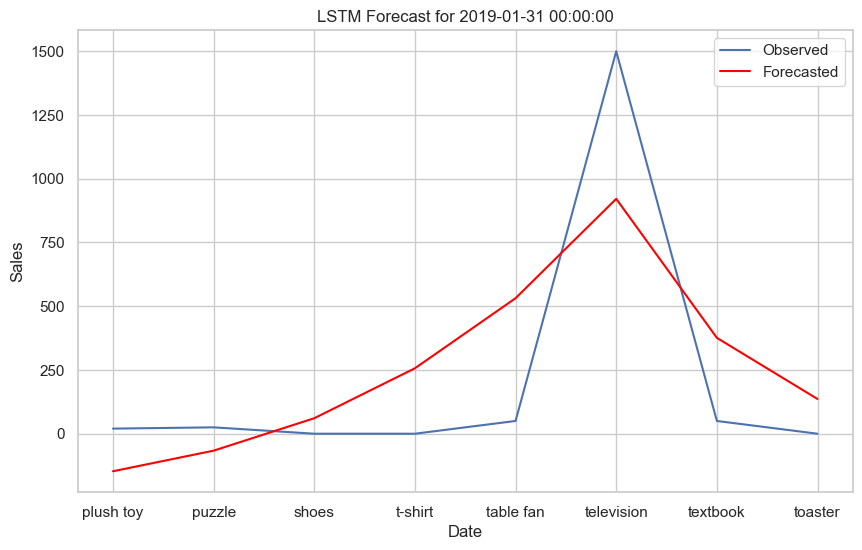

Epoch 1/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 0.0321
Epoch 2/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0313
Epoch 3/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0306
Epoch 4/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0299
Epoch 5/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0293
Epoch 6/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0287
Epoch 7/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0283
Epoch 8/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0279
Epoch 9/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0277
Epoch 10/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0276
Epoch 11/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0275
Epoch 12/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0275
Epoch 13/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0276
Epoch 14/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0276
Epoch 15/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0276
Epoch 16/100
1/1 ━━━━

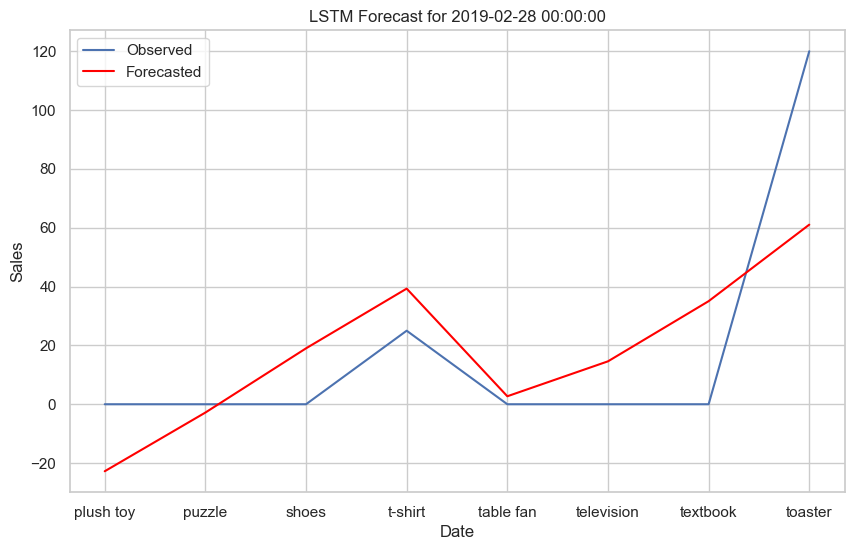

Epoch 1/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 0.1263
Epoch 2/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1251
Epoch 3/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.1239
Epoch 4/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.1227
Epoch 5/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.1216
Epoch 6/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1204
Epoch 7/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1192
Epoch 8/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1181
Epoch 9/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.1170
Epoch 10/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.1159
Epoch 11/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.1148
Epoch 12/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1138
Epoch 13/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.1128
Epoch 14/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1119
Epoch 15/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1110
Epoch 16/100
1/1 ━━━━

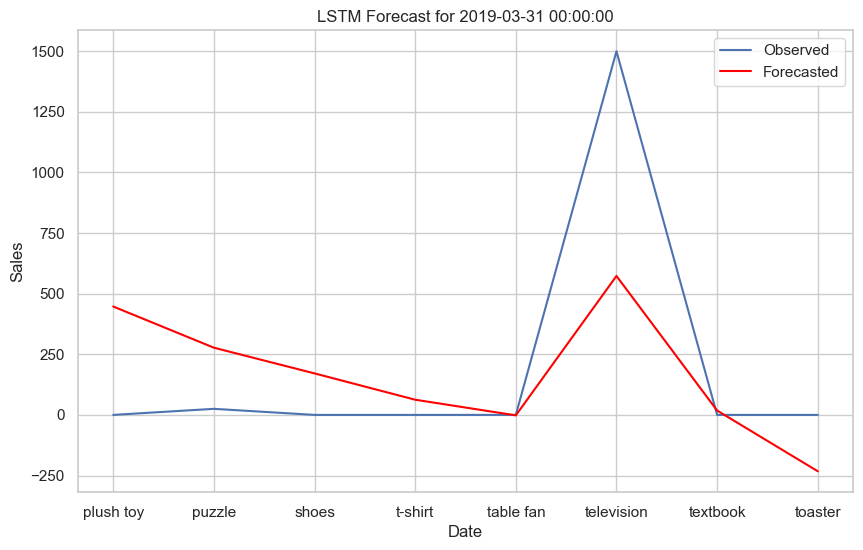

Epoch 1/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 0.0014
Epoch 2/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0012
Epoch 3/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0010
Epoch 4/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 9.2006e-04
Epoch 5/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 8.6907e-04
Epoch 6/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 8.5795e-04
Epoch 7/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 8.7579e-04
Epoch 8/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 9.0458e-04
Epoch 9/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 9.2493e-04
Epoch 10/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 9.2782e-04
Epoch 11/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 9.1630e-04
Epoch 12/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 8.9851e-04
Epoch 13/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 8.8016e-04
Epoch 14/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 8.6494e-04
Epoch 15/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16

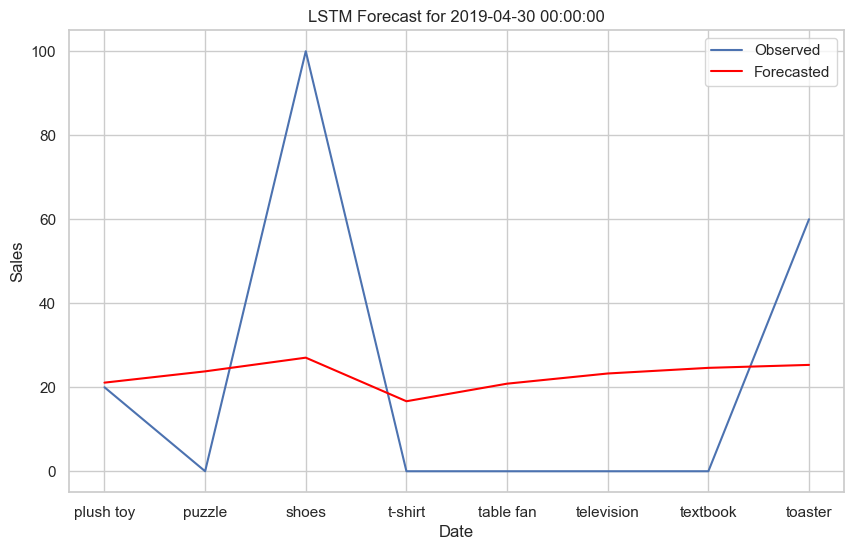

Epoch 1/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 0.0083
Epoch 2/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0079
Epoch 3/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0077
Epoch 4/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0075
Epoch 5/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0073
Epoch 6/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0072
Epoch 7/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0072
Epoch 8/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0073
Epoch 9/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0073
Epoch 10/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0073
Epoch 11/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0073
Epoch 12/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0073
Epoch 13/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0072
Epoch 14/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0072
Epoch 15/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0071
Epoch 16/100
1/1 ━━━━

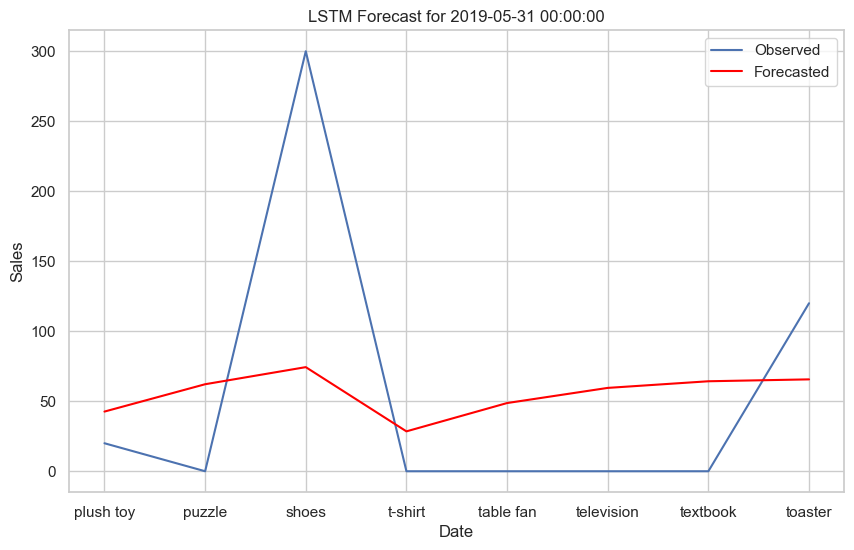

Epoch 1/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step - loss: 0.1250
Epoch 2/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1235
Epoch 3/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1222
Epoch 4/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1209
Epoch 5/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.1197
Epoch 6/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.1184
Epoch 7/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.1172
Epoch 8/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1160
Epoch 9/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1148
Epoch 10/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.1137
Epoch 11/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1126
Epoch 12/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.1116
Epoch 13/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1107
Epoch 14/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.1099
Epoch 15/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.1092
Epoch 16/100
1/1 ━━━━

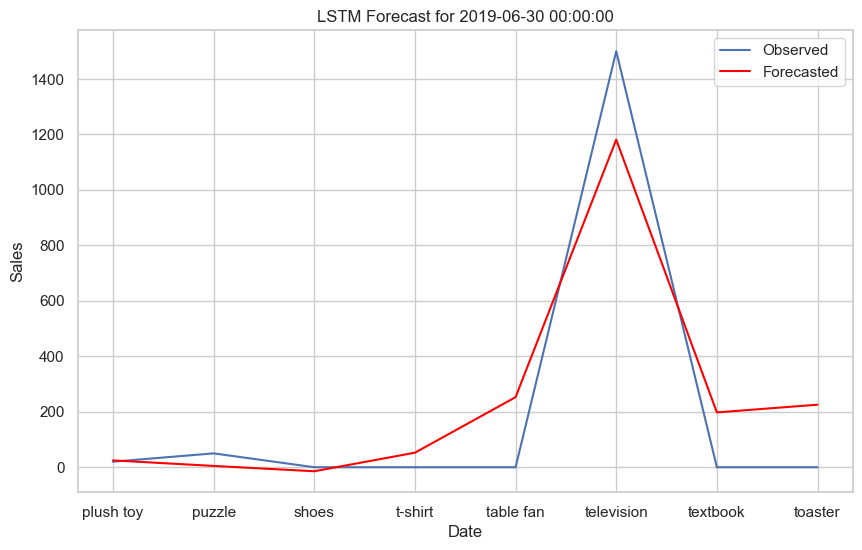

Epoch 1/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 2.1291e-06
Epoch 2/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 1.4310e-05
Epoch 3/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 2.6003e-06
Epoch 4/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 1.3912e-06
Epoch 5/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 5.0225e-06
Epoch 6/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 3.7505e-06
Epoch 7/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 1.0931e-06
Epoch 8/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 1.0094e-07
Epoch 9/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 9.2327e-07
Epoch 10/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 1.7630e-06
Epoch 11/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 1.6623e-06
Epoch 12/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 9.5127e-07
Epoch 13/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 3.5197e-07
Epoch 14/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 2.3619e-07
Epoch 15/100
1/1 ━━━━━━━━━━━━━━

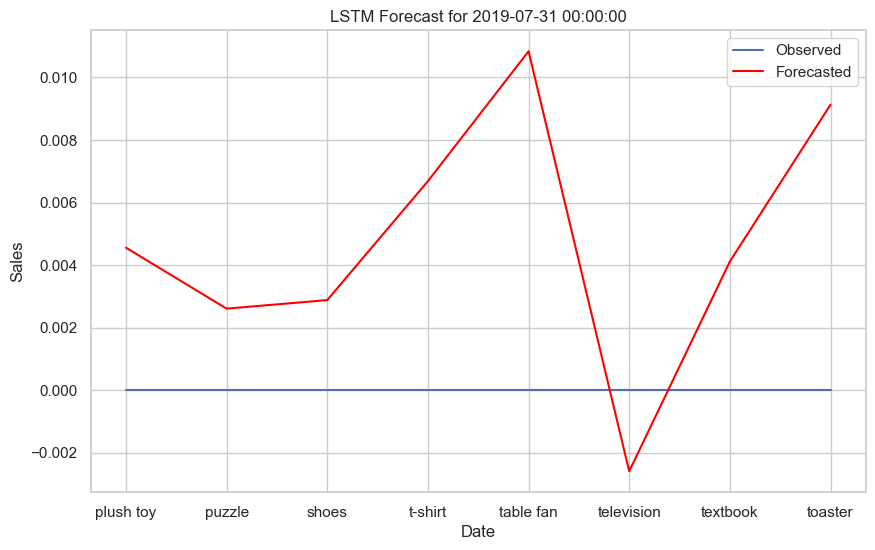

Epoch 1/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 2.6040e-04
Epoch 2/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 1.8837e-04
Epoch 3/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 2.1009e-04
Epoch 4/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 2.1476e-04
Epoch 5/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 2.0053e-04
Epoch 6/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 1.8720e-04
Epoch 7/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 1.8184e-04
Epoch 8/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 1.8411e-04
Epoch 9/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 1.8816e-04
Epoch 10/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 1.8758e-04
Epoch 11/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 1.8298e-04
Epoch 12/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 1.7783e-04
Epoch 13/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 1.7495e-04
Epoch 14/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 1.7469e-04
Epoch 15/100
1/1 ━━━━━━━━━━━━━━

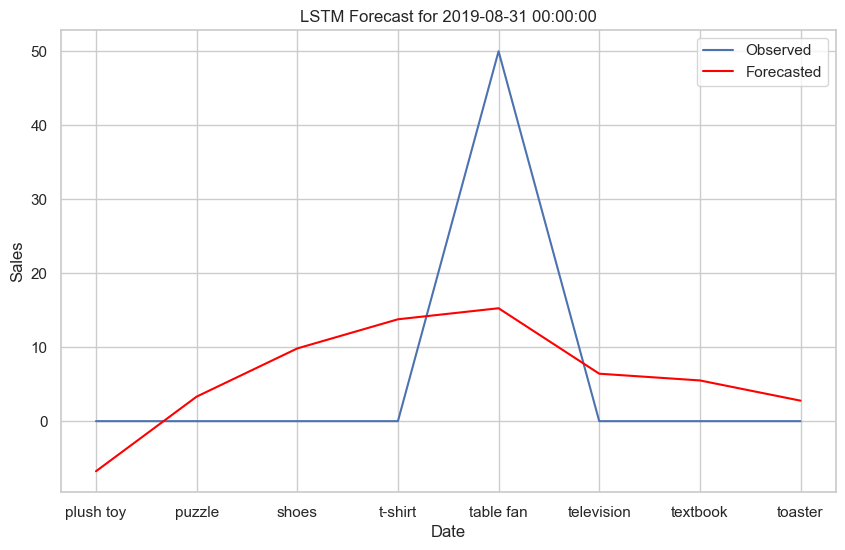

Epoch 1/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 1.1353e-04
Epoch 2/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 7.5414e-05
Epoch 3/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 8.8214e-05
Epoch 4/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 8.8383e-05
Epoch 5/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 7.8018e-05
Epoch 6/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 6.9970e-05
Epoch 7/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 6.8702e-05
Epoch 8/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 7.1567e-05
Epoch 9/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 7.2858e-05
Epoch 10/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 7.1001e-05
Epoch 11/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 6.7442e-05
Epoch 12/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 6.4715e-05
Epoch 13/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 6.4110e-05
Epoch 14/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 6.5052e-05
Epoch 15/100
1/1 ━━━━━━━━━━━━━━

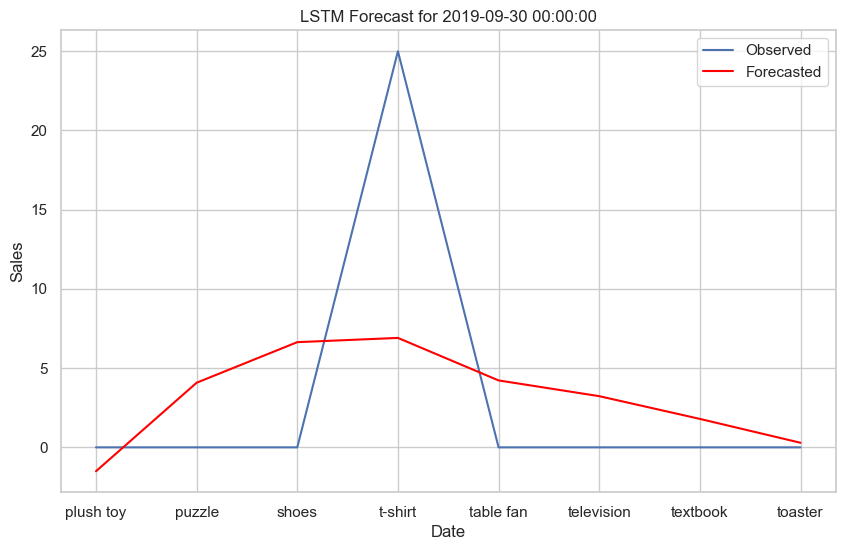

Epoch 1/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 0.0013
Epoch 2/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0011
Epoch 3/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0010
Epoch 4/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 9.5721e-04
Epoch 5/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 9.6658e-04
Epoch 6/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0010
Epoch 7/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0010
Epoch 8/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step - loss: 0.0010
Epoch 9/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 9.9189e-04
Epoch 10/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 9.6362e-04
Epoch 11/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 9.4024e-04
Epoch 12/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 9.2698e-04
Epoch 13/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 9.2305e-04
Epoch 14/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 9.2373e-04
Epoch 15/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - lo

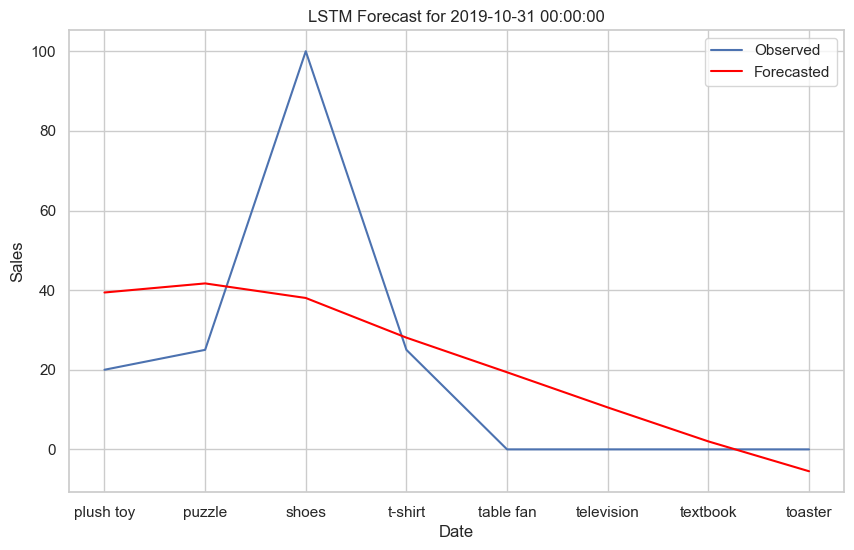

Epoch 1/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 0.0031
Epoch 2/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0030
Epoch 3/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0029
Epoch 4/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0030
Epoch 5/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0030
Epoch 6/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0029
Epoch 7/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0029
Epoch 8/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0029
Epoch 9/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0029
Epoch 10/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0029
Epoch 11/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0029
Epoch 12/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0029
Epoch 13/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0029
Epoch 14/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0029
Epoch 15/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0029
Epoch 16/100
1/1 ━━━━

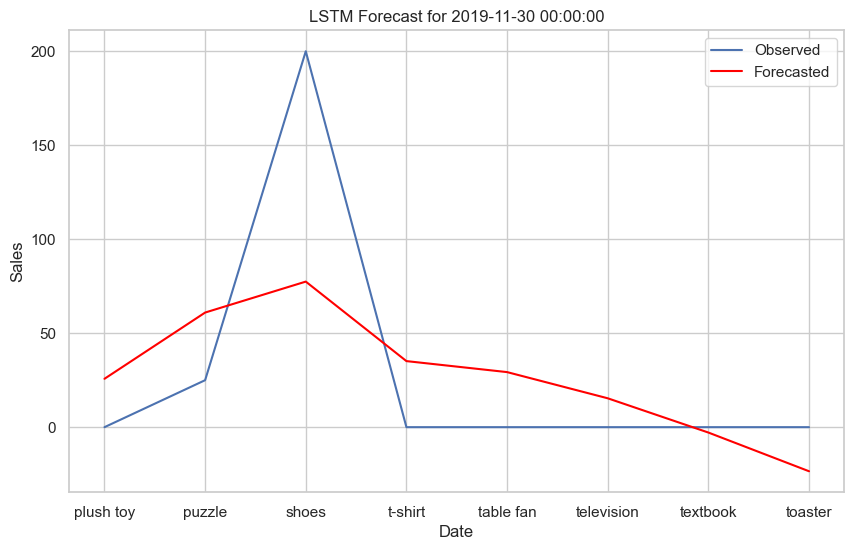

Epoch 1/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 0.0079
Epoch 2/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0073
Epoch 3/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0069
Epoch 4/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0065
Epoch 5/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0061
Epoch 6/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0059
Epoch 7/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0056
Epoch 8/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0055
Epoch 9/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0054
Epoch 10/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0054
Epoch 11/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0054
Epoch 12/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0055
Epoch 13/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0056
Epoch 14/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0056
Epoch 15/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0056
Epoch 16/100
1/1 ━━━━

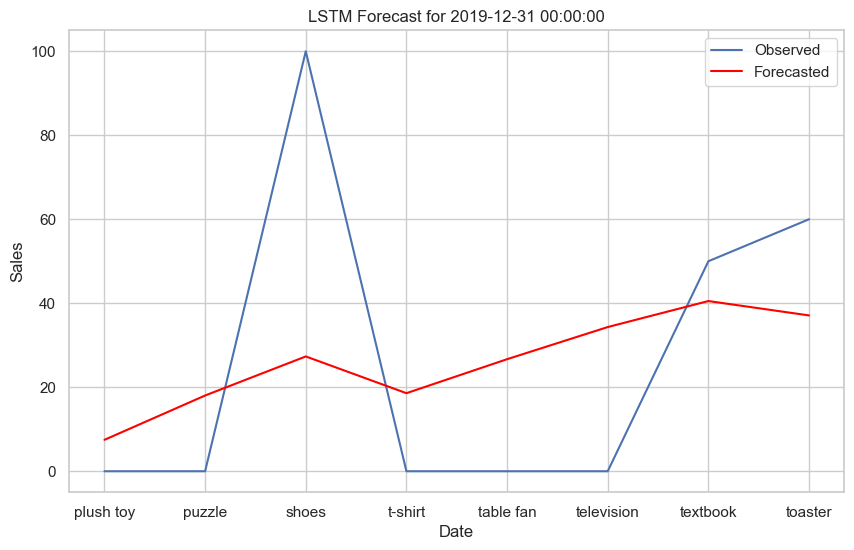

Epoch 1/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 0.0113
Epoch 2/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0100
Epoch 3/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0087
Epoch 4/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0077
Epoch 5/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0068
Epoch 6/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0060
Epoch 7/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0054
Epoch 8/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0049
Epoch 9/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0045
Epoch 10/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0044
Epoch 11/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0043
Epoch 12/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0045
Epoch 13/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0046
Epoch 14/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0048
Epoch 15/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0049
Epoch 16/100
1/1 ━━━━

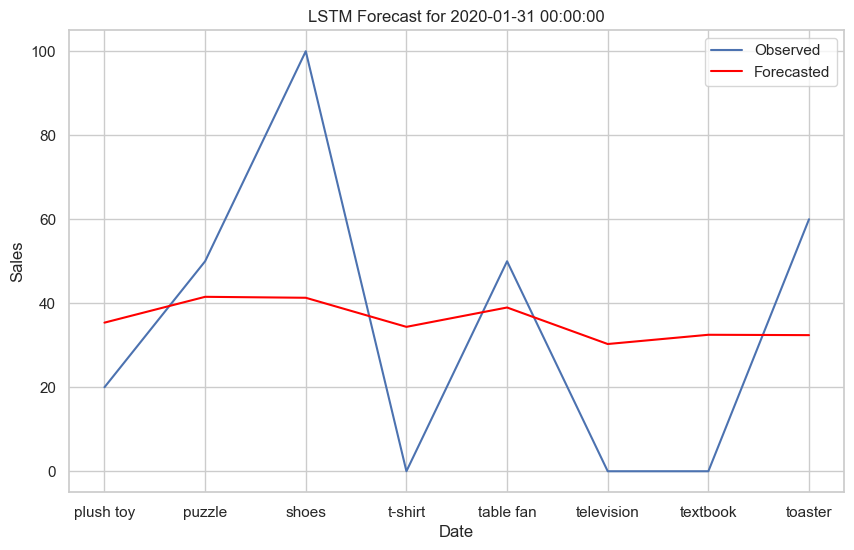

Epoch 1/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 0.1259
Epoch 2/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1247
Epoch 3/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.1236
Epoch 4/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.1226
Epoch 5/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.1215
Epoch 6/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.1204
Epoch 7/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.1194
Epoch 8/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.1184
Epoch 9/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.1174
Epoch 10/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.1164
Epoch 11/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.1155
Epoch 12/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1145
Epoch 13/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.1136
Epoch 14/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.1127
Epoch 15/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.1119
Epoch 16/100
1/1 ━━━━

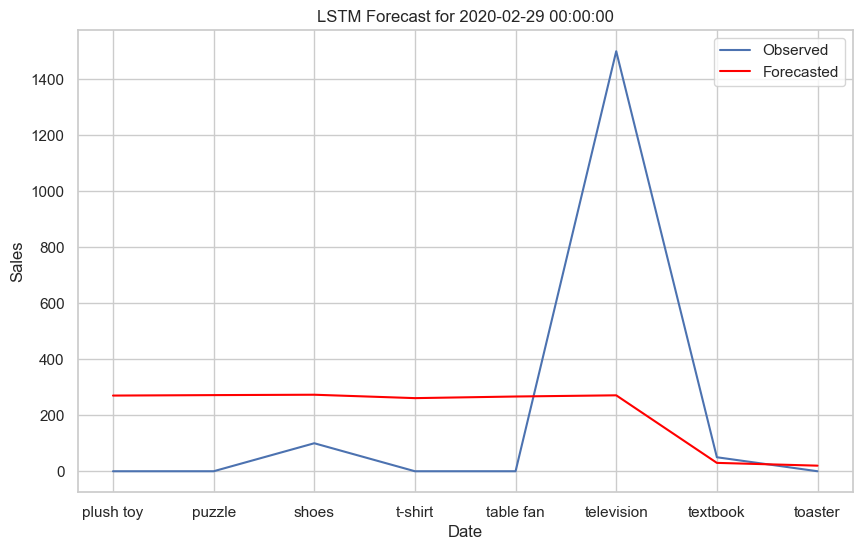

Epoch 1/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.0653
Epoch 2/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0636
Epoch 3/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0620
Epoch 4/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0606
Epoch 5/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0594
Epoch 6/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0581
Epoch 7/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0570
Epoch 8/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0559
Epoch 9/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0548
Epoch 10/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0539
Epoch 11/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0531
Epoch 12/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.0524
Epoch 13/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0519
Epoch 14/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0515
Epoch 15/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0513
Epoch 16/100
1/1 ━━━━

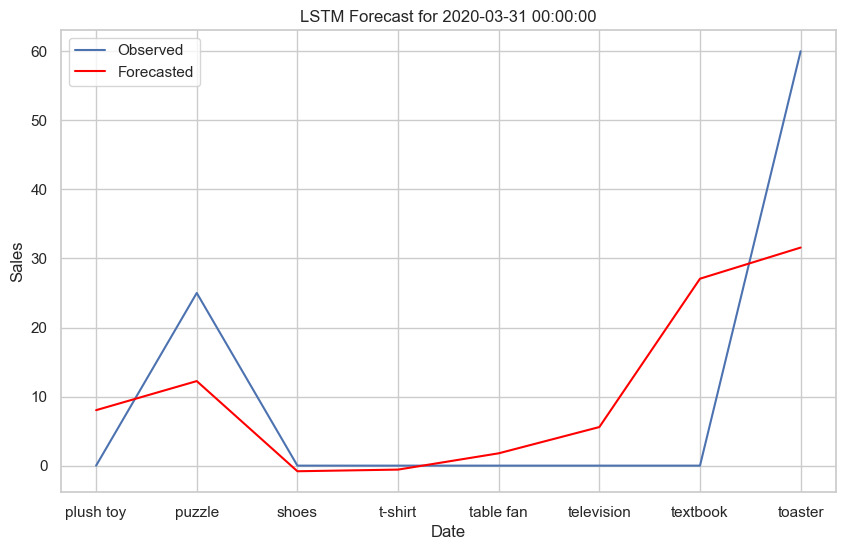

Epoch 1/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.1275
Epoch 2/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.1259
Epoch 3/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.1243
Epoch 4/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1229
Epoch 5/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.1214
Epoch 6/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1200
Epoch 7/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.1186
Epoch 8/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.1173
Epoch 9/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.1159
Epoch 10/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.1145
Epoch 11/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.1132
Epoch 12/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.1119
Epoch 13/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.1107
Epoch 14/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.1095
Epoch 15/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.1085
Epoch 16/100
1/1 ━━━━

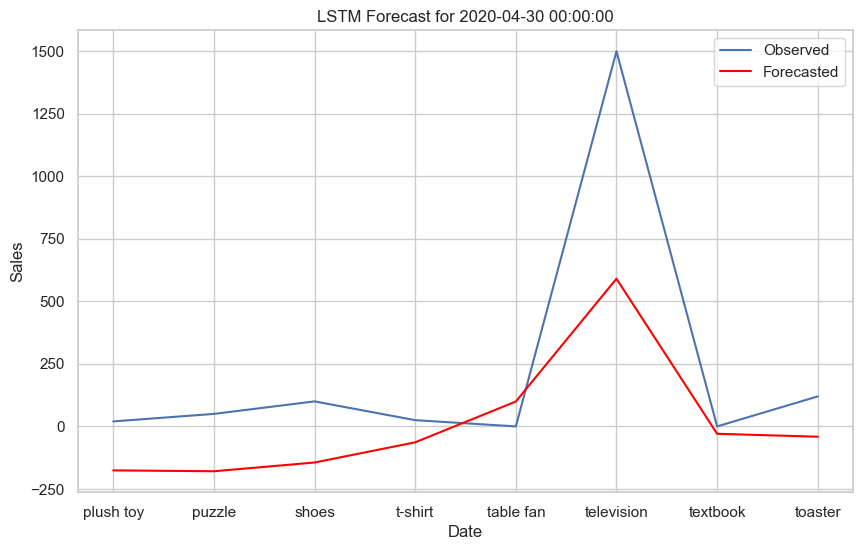

Epoch 1/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 0.0495
Epoch 2/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0484
Epoch 3/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0473
Epoch 4/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0464
Epoch 5/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0455
Epoch 6/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0447
Epoch 7/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0440
Epoch 8/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0434
Epoch 9/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0428
Epoch 10/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0423
Epoch 11/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0419
Epoch 12/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0417
Epoch 13/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0415
Epoch 14/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0415
Epoch 15/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0415
Epoch 16/100
1/1 ━━━━

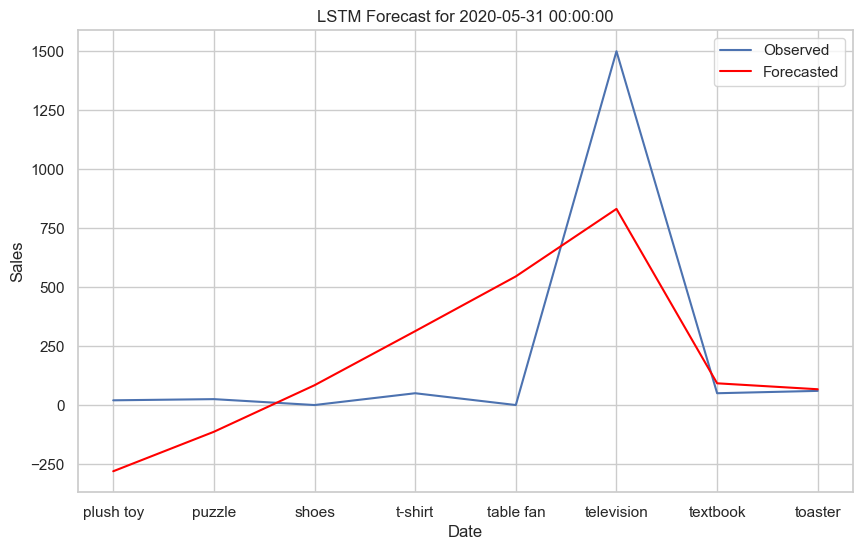

Epoch 1/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 0.1257
Epoch 2/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.1246
Epoch 3/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.1235
Epoch 4/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.1223
Epoch 5/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.1211
Epoch 6/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.1200
Epoch 7/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1188
Epoch 8/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.1176
Epoch 9/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.1165
Epoch 10/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1154
Epoch 11/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.1143
Epoch 12/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.1132
Epoch 13/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1122
Epoch 14/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.1112
Epoch 15/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.1103
Epoch 16/100
1/1 ━━━━

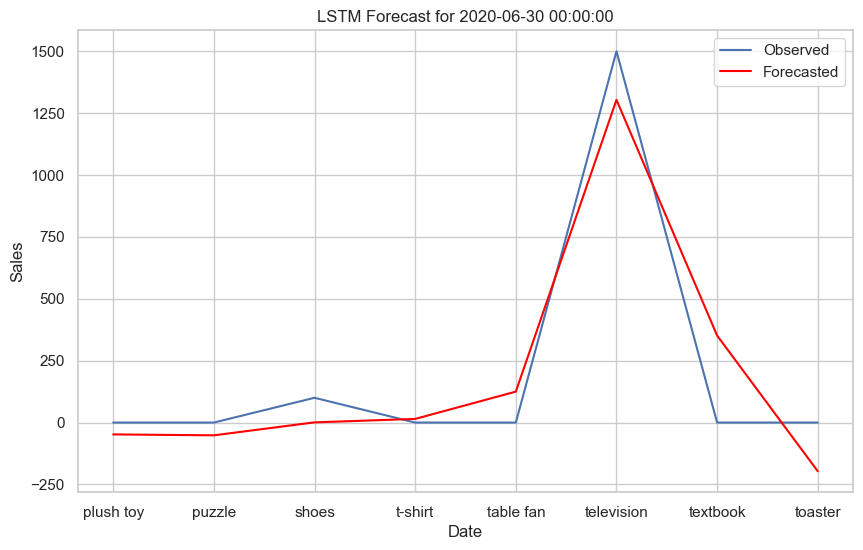

Epoch 1/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 7.4070e-04
Epoch 2/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 5.3330e-04
Epoch 3/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - loss: 4.1999e-04
Epoch 4/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 3.8707e-04
Epoch 5/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 4.0411e-04
Epoch 6/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 4.3271e-04
Epoch 7/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 4.4509e-04
Epoch 8/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 4.3533e-04
Epoch 9/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 4.1106e-04
Epoch 10/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 3.8307e-04
Epoch 11/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 3.5954e-04
Epoch 12/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 3.4383e-04
Epoch 13/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 3.3786e-04
Epoch 14/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 3.3909e-04
Epoch 15/100
1/1 ━━━━━━━━━━━━━━

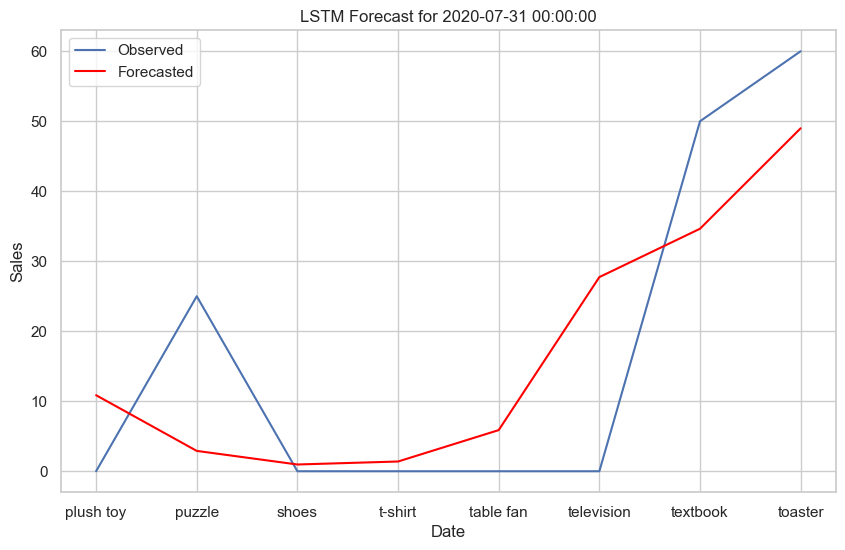

Epoch 1/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.0070
Epoch 2/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0063
Epoch 3/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0057
Epoch 4/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0053
Epoch 5/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0049
Epoch 6/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0046
Epoch 7/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0044
Epoch 8/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0043
Epoch 9/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0042
Epoch 10/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0042
Epoch 11/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0043
Epoch 12/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0044
Epoch 13/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0044
Epoch 14/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0045
Epoch 15/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0045
Epoch 16/100
1/1 ━━━━

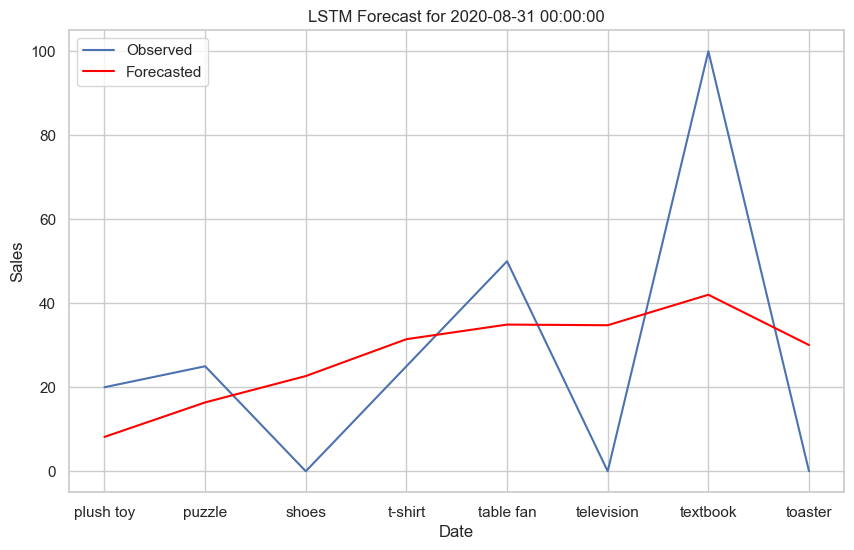

Epoch 1/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 0.1270
Epoch 2/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.1254
Epoch 3/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.1240
Epoch 4/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1227
Epoch 5/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.1214
Epoch 6/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.1201
Epoch 7/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.1188
Epoch 8/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.1176
Epoch 9/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.1164
Epoch 10/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1152
Epoch 11/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1141
Epoch 12/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1130
Epoch 13/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.1119
Epoch 14/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1109
Epoch 15/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.1099
Epoch 16/100
1/1 ━━━━

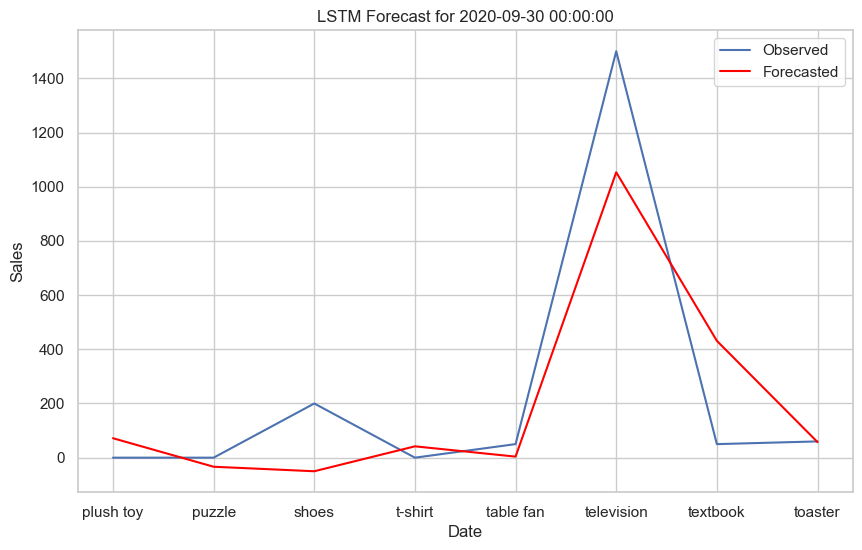

Epoch 1/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 0.1268
Epoch 2/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1254
Epoch 3/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.1242
Epoch 4/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.1230
Epoch 5/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1218
Epoch 6/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.1206
Epoch 7/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.1194
Epoch 8/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.1183
Epoch 9/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1171
Epoch 10/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.1160
Epoch 11/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1148
Epoch 12/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.1138
Epoch 13/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1127
Epoch 14/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.1117
Epoch 15/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1107
Epoch 16/100
1/1 ━━━━

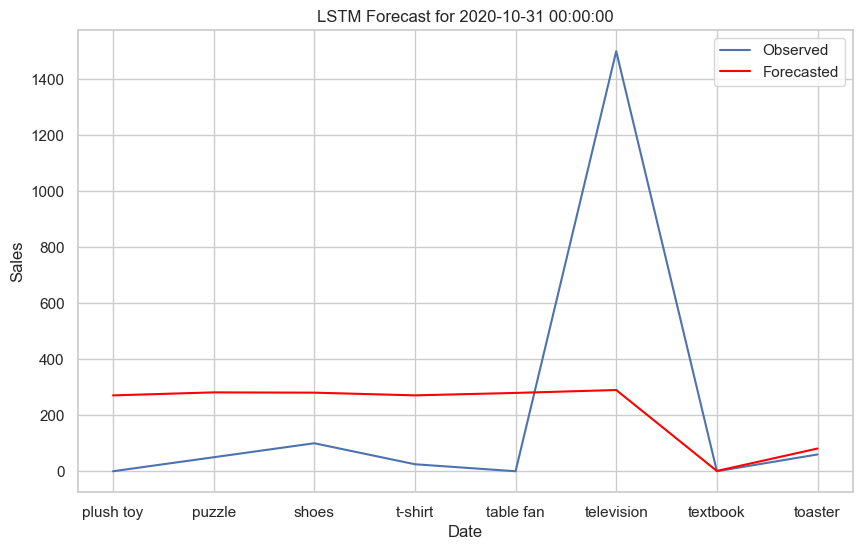

Epoch 1/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.0012
Epoch 2/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 9.8310e-04
Epoch 3/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 8.8641e-04
Epoch 4/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 8.6518e-04
Epoch 5/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 8.8638e-04
Epoch 6/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 9.1549e-04
Epoch 7/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 9.2502e-04
Epoch 8/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 9.1359e-04
Epoch 9/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 8.9081e-04
Epoch 10/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 8.6803e-04
Epoch 11/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 8.5248e-04
Epoch 12/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 8.4632e-04
Epoch 13/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 8.4755e-04
Epoch 14/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 8.5192e-04
Epoch 15/100
1/1 ━━━━━━━━━━━━━━━━━━

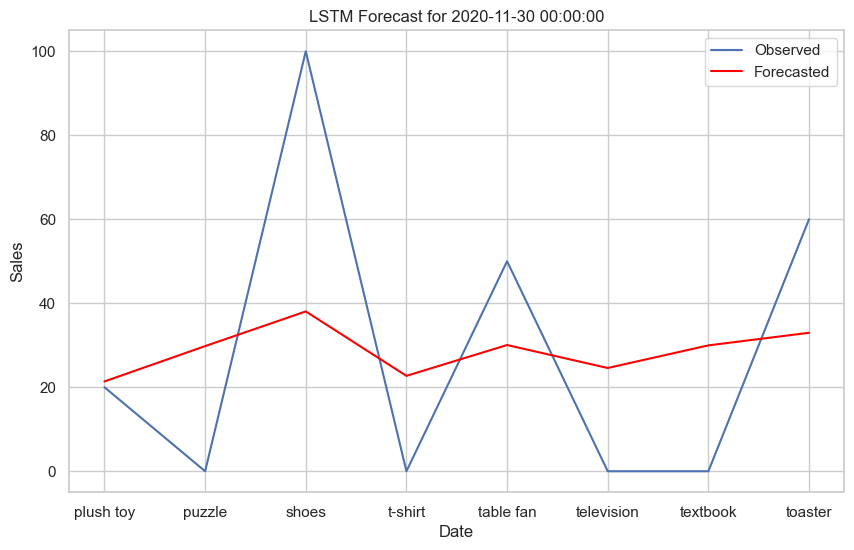

Epoch 1/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 0.2142
Epoch 2/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2095
Epoch 3/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.2051
Epoch 4/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.2011
Epoch 5/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.1972
Epoch 6/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.1934
Epoch 7/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.1896
Epoch 8/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.1857
Epoch 9/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.1819
Epoch 10/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.1780
Epoch 11/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.1742
Epoch 12/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.1702
Epoch 13/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.1663
Epoch 14/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1624
Epoch 15/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.1585
Epoch 16/100
1/1 ━━━━

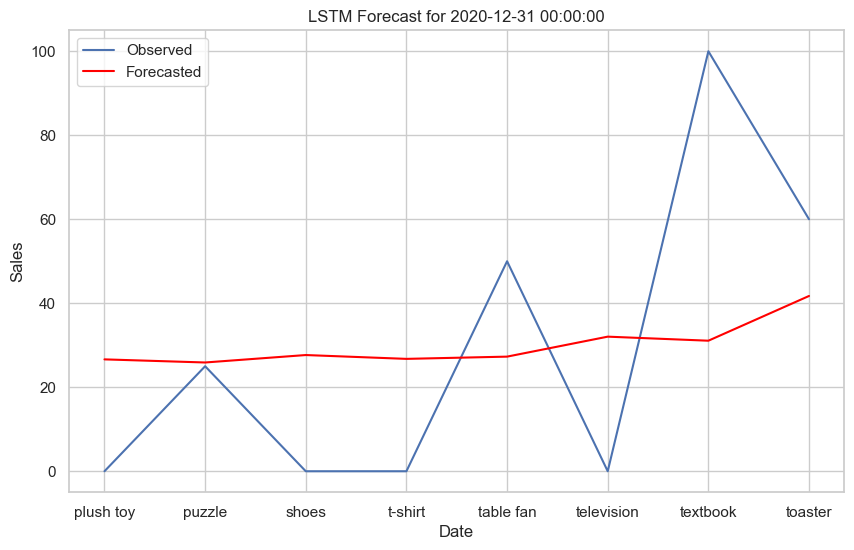

Epoch 1/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - loss: 0.1250
Epoch 2/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.1238
Epoch 3/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.1225
Epoch 4/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.1213
Epoch 5/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.1201
Epoch 6/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.1188
Epoch 7/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.1176
Epoch 8/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.1164
Epoch 9/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.1153
Epoch 10/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1142
Epoch 11/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.1131
Epoch 12/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.1121
Epoch 13/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.1111
Epoch 14/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.1102
Epoch 15/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - loss: 0.1094
Epoch 16/100
1/1 ━━━━

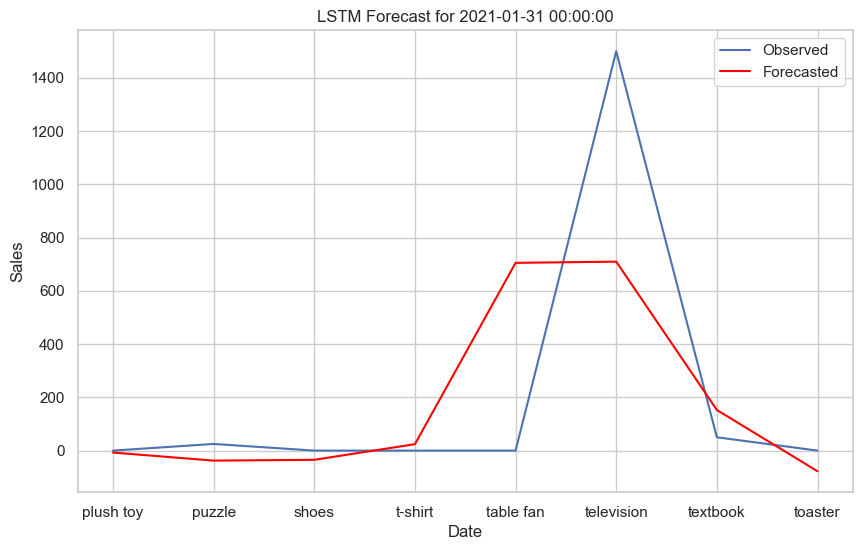

Epoch 1/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.1249
Epoch 2/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - loss: 0.1233
Epoch 3/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 0.1219
Epoch 4/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.1205
Epoch 5/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - loss: 0.1191
Epoch 6/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1178
Epoch 7/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.1166
Epoch 8/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - loss: 0.1153
Epoch 9/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1141
Epoch 10/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - loss: 0.1129
Epoch 11/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.1118
Epoch 12/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1108
Epoch 13/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - loss: 0.1098
Epoch 14/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.1089
Epoch 15/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.1082
Epoch 16/100
1/1 ━━━━

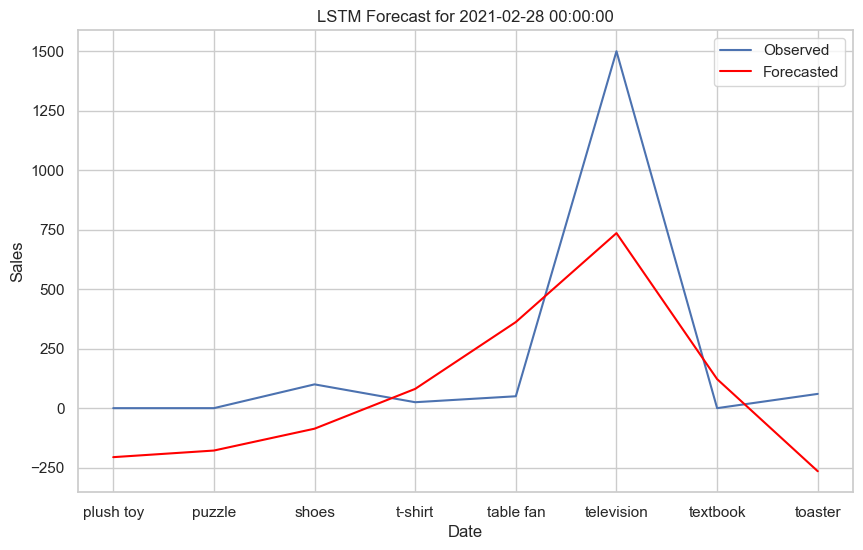

Epoch 1/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.0063
Epoch 2/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0059
Epoch 3/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0055
Epoch 4/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0052
Epoch 5/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0049
Epoch 6/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0047
Epoch 7/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0045
Epoch 8/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.0044
Epoch 9/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.0044
Epoch 10/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0044
Epoch 11/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.0045
Epoch 12/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0045
Epoch 13/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0045
Epoch 14/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0045
Epoch 15/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0045
Epoch 16/100
1/1 ━━━━

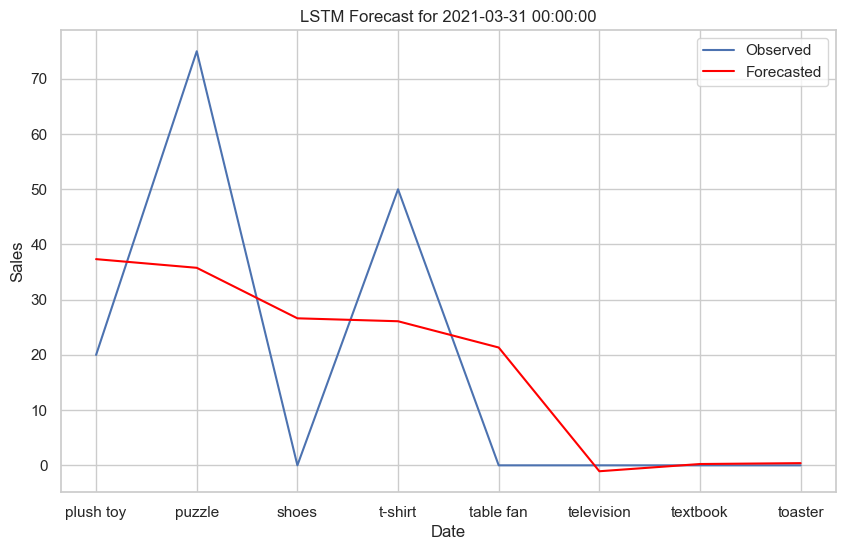

Epoch 1/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step - loss: 8.5166e-04
Epoch 2/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 7.6001e-04
Epoch 3/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 7.5379e-04
Epoch 4/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 7.7486e-04
Epoch 5/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 7.7533e-04
Epoch 6/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 7.5798e-04
Epoch 7/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 7.4053e-04
Epoch 8/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 7.3315e-04
Epoch 9/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 7.3694e-04
Epoch 10/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 7.4328e-04
Epoch 11/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 7.4192e-04
Epoch 12/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 7.3391e-04
Epoch 13/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 7.2526e-04
Epoch 14/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 7.2034e-04
Epoch 15/100
1/1 ━━━━━━━━━━━━━━

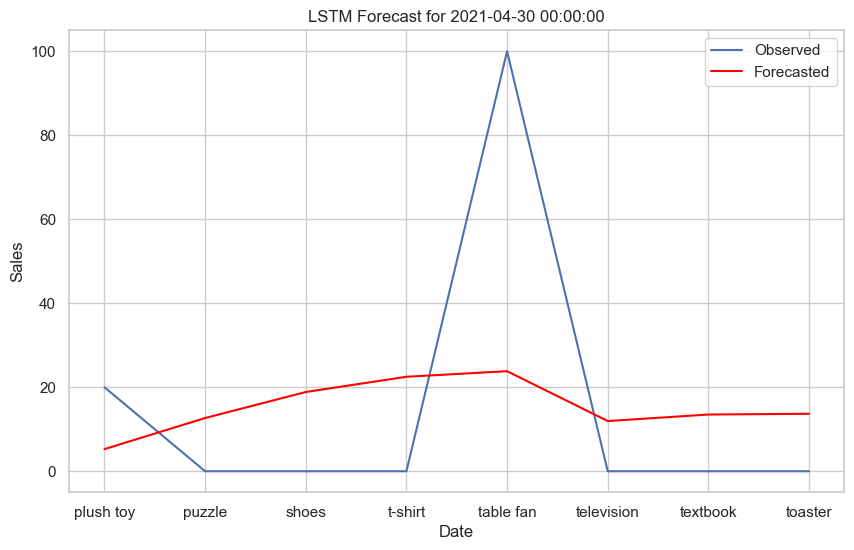

Epoch 1/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.1251
Epoch 2/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.1239
Epoch 3/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.1229
Epoch 4/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.1218
Epoch 5/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.1208
Epoch 6/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.1197
Epoch 7/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.1187
Epoch 8/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.1177
Epoch 9/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.1167
Epoch 10/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.1157
Epoch 11/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.1147
Epoch 12/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.1138
Epoch 13/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.1129
Epoch 14/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.1120
Epoch 15/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.1112
Epoch 16/100
1/1 ━━━━

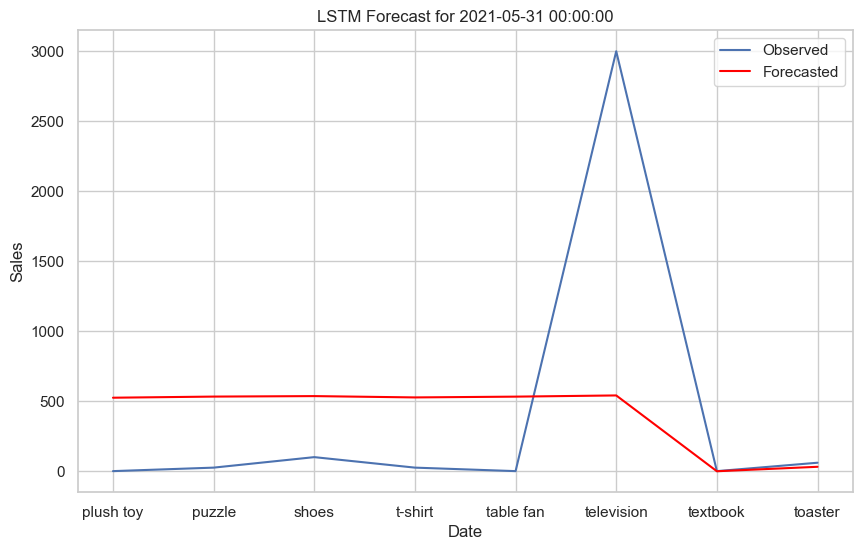

Epoch 1/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - loss: 0.0478
Epoch 2/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - loss: 0.0471
Epoch 3/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.0464
Epoch 4/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0458
Epoch 5/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0452
Epoch 6/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.0448
Epoch 7/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0444
Epoch 8/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0441
Epoch 9/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0438
Epoch 10/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0437
Epoch 11/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0436
Epoch 12/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0435
Epoch 13/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0434
Epoch 14/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0433
Epoch 15/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0432
Epoch 16/100
1/1 ━━━━

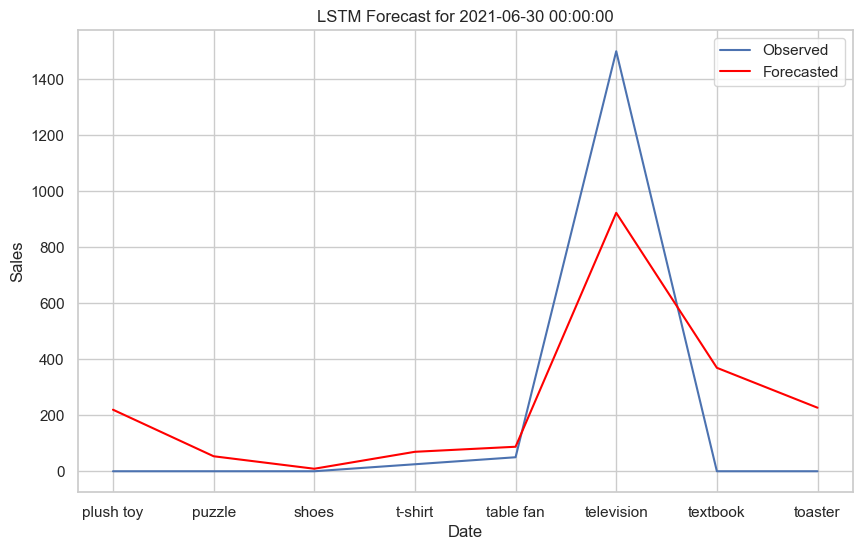

Epoch 1/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 1.8345e-04
Epoch 2/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 8.2384e-05
Epoch 3/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - loss: 7.7544e-05
Epoch 4/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 9.7623e-05
Epoch 5/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 9.3529e-05
Epoch 6/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 7.4304e-05
Epoch 7/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 5.6191e-05
Epoch 8/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 4.8408e-05
Epoch 9/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 4.8093e-05
Epoch 10/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 5.0858e-05
Epoch 11/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 5.2615e-05
Epoch 12/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 5.1039e-05
Epoch 13/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 4.6545e-05
Epoch 14/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 4.0992e-05
Epoch 15/100
1/1 ━━━━━━━━━━━━━━

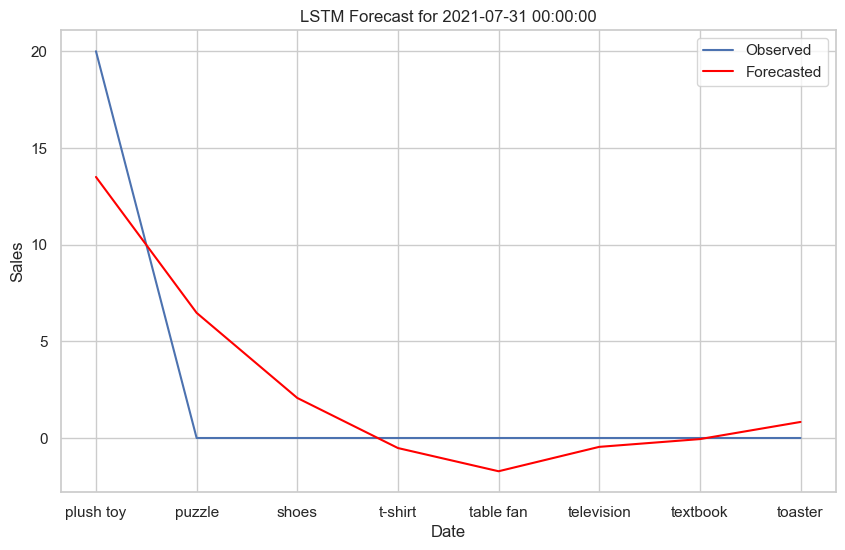

Epoch 1/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 0.0081
Epoch 2/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0078
Epoch 3/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0075
Epoch 4/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.0073
Epoch 5/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0072
Epoch 6/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0071
Epoch 7/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0071
Epoch 8/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0070
Epoch 9/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0070
Epoch 10/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0069
Epoch 11/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0068
Epoch 12/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0067
Epoch 13/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0067
Epoch 14/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0066
Epoch 15/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0065
Epoch 16/100
1/1 ━━━━

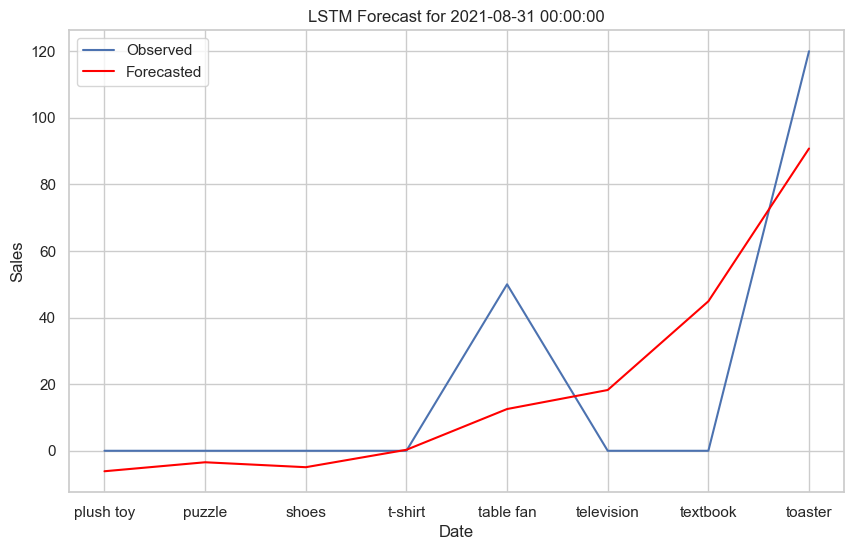

Epoch 1/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.0050
Epoch 2/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0045
Epoch 3/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0040
Epoch 4/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0037
Epoch 5/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0034
Epoch 6/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0032
Epoch 7/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0031
Epoch 8/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0031
Epoch 9/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0032
Epoch 10/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0033
Epoch 11/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0033
Epoch 12/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0033
Epoch 13/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0033
Epoch 14/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0033
Epoch 15/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0032
Epoch 16/100
1/1 ━━━━

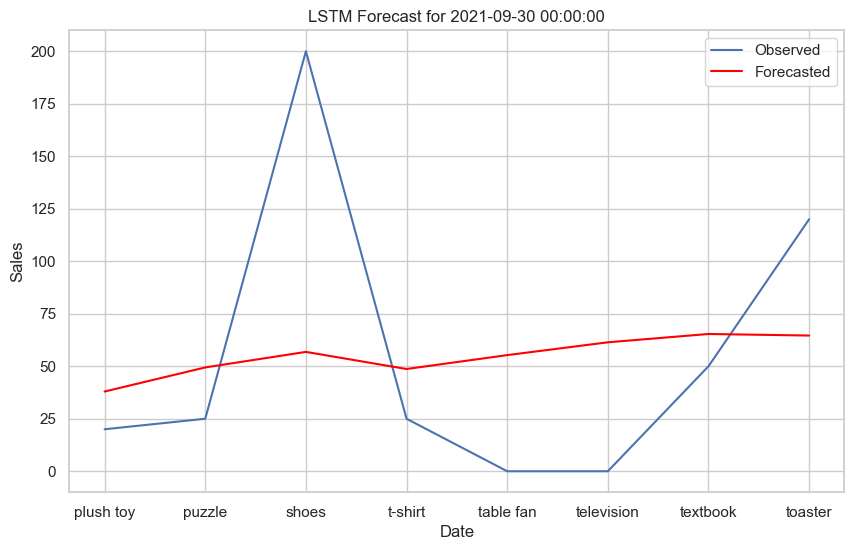

Epoch 1/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.0034
Epoch 2/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0031
Epoch 3/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.0029
Epoch 4/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0028
Epoch 5/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0029
Epoch 6/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0029
Epoch 7/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0029
Epoch 8/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0029
Epoch 9/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0029
Epoch 10/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0028
Epoch 11/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0028
Epoch 12/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0028
Epoch 13/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0028
Epoch 14/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0028
Epoch 15/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0028
Epoch 16/100
1/1 ━━━━

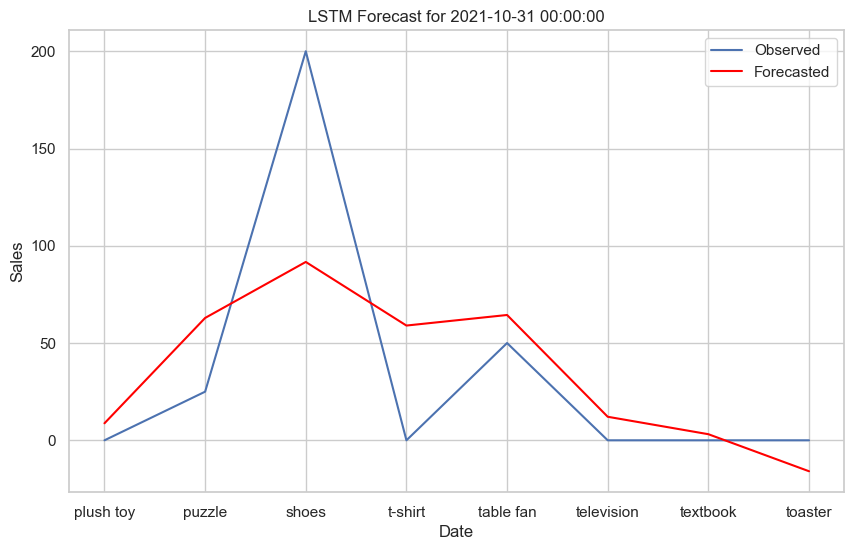

Epoch 1/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 0.0040
Epoch 2/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0034
Epoch 3/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0029
Epoch 4/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0025
Epoch 5/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0022
Epoch 6/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0020
Epoch 7/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0019
Epoch 8/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0019
Epoch 9/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0019
Epoch 10/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0020
Epoch 11/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0021
Epoch 12/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0021
Epoch 13/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0021
Epoch 14/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0021
Epoch 15/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0020
Epoch 16/100
1/1 ━━━━

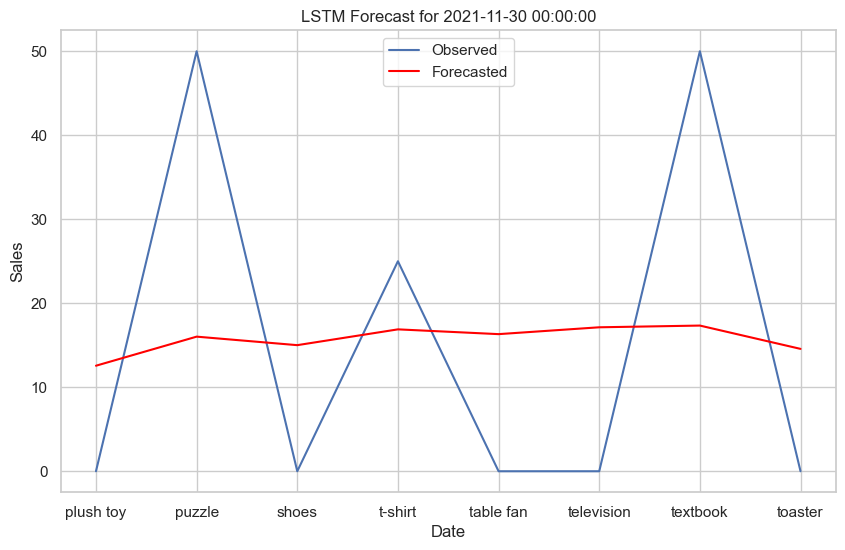

Epoch 1/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.1259
Epoch 2/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.1243
Epoch 3/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.1229
Epoch 4/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.1214
Epoch 5/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.1200
Epoch 6/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.1186
Epoch 7/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.1172
Epoch 8/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1159
Epoch 9/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.1146
Epoch 10/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1133
Epoch 11/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1121
Epoch 12/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.1110
Epoch 13/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1100
Epoch 14/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.1090
Epoch 15/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1082
Epoch 16/100
1/1 ━━━━

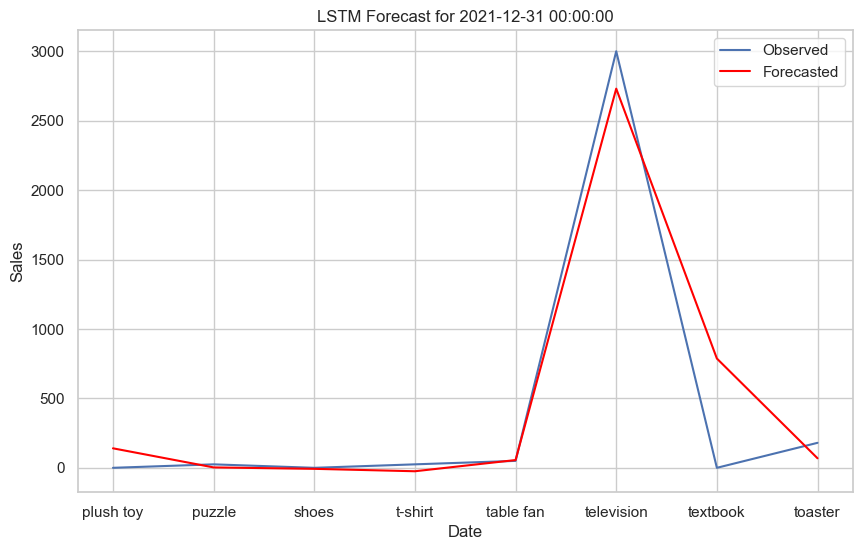

Epoch 1/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step - loss: 0.1300
Epoch 2/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.1279
Epoch 3/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1259
Epoch 4/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1238
Epoch 5/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1218
Epoch 6/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.1198
Epoch 7/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.1178
Epoch 8/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1158
Epoch 9/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.1139
Epoch 10/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.1121
Epoch 11/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.1103
Epoch 12/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1087
Epoch 13/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.1073
Epoch 14/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1060
Epoch 15/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1050
Epoch 16/100
1/1 ━━━━

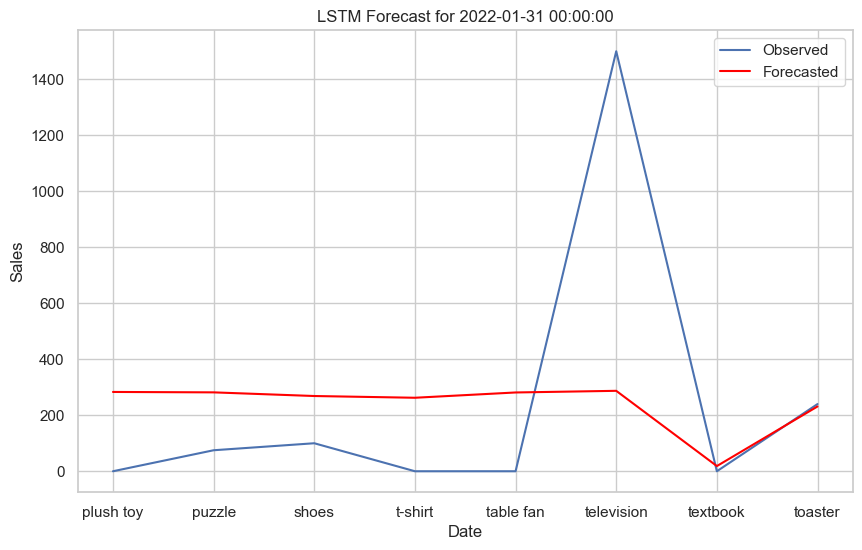

Epoch 1/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 0.0120
Epoch 2/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0112
Epoch 3/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0106
Epoch 4/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0100
Epoch 5/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0094
Epoch 6/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0090
Epoch 7/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0086
Epoch 8/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0082
Epoch 9/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.0080
Epoch 10/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0078
Epoch 11/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0077
Epoch 12/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0076
Epoch 13/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0077
Epoch 14/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0077
Epoch 15/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0078
Epoch 16/100
1/1 ━━━━

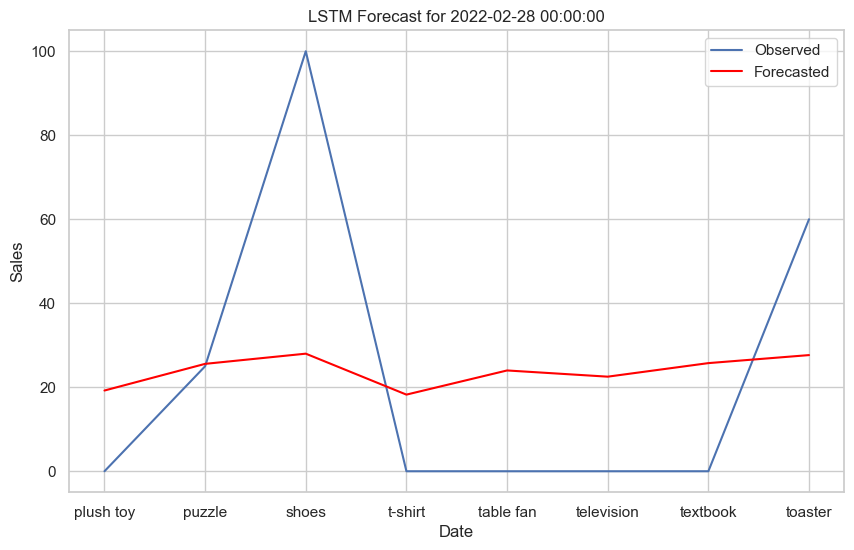

Epoch 1/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 4.9766e-05
Epoch 2/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 5.6933e-05
Epoch 3/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 4.8509e-05
Epoch 4/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 5.3129e-05
Epoch 5/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 4.8386e-05
Epoch 6/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 4.6578e-05
Epoch 7/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 4.8643e-05
Epoch 8/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 4.7130e-05
Epoch 9/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 4.4529e-05
Epoch 10/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 4.4498e-05
Epoch 11/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 4.5157e-05
Epoch 12/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 4.4152e-05
Epoch 13/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 4.2840e-05
Epoch 14/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 4.3093e-05
Epoch 15/100
1/1 ━━━━━━━━━━━━━━

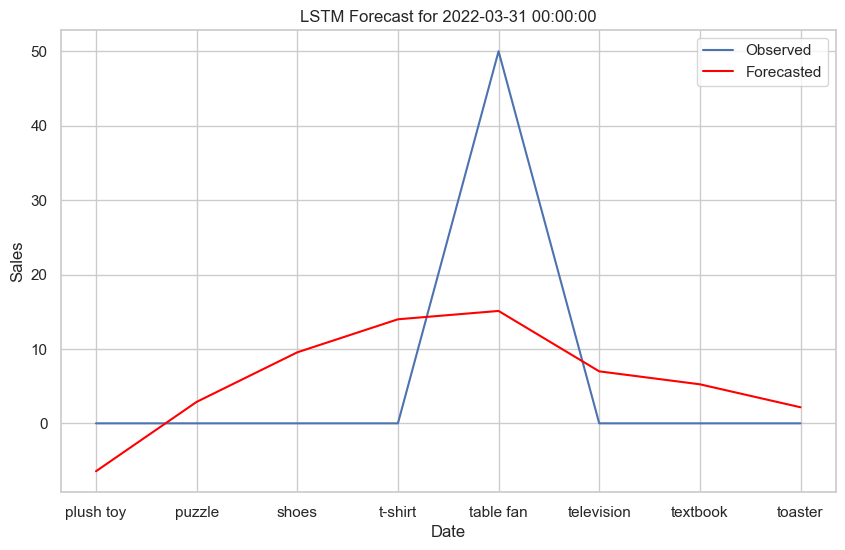

Epoch 1/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 0.1254
Epoch 2/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.1238
Epoch 3/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.1225
Epoch 4/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.1214
Epoch 5/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.1202
Epoch 6/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1191
Epoch 7/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.1180
Epoch 8/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.1170
Epoch 9/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.1159
Epoch 10/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.1149
Epoch 11/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.1139
Epoch 12/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.1130
Epoch 13/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.1121
Epoch 14/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.1113
Epoch 15/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.1105
Epoch 16/100
1/1 ━━━━

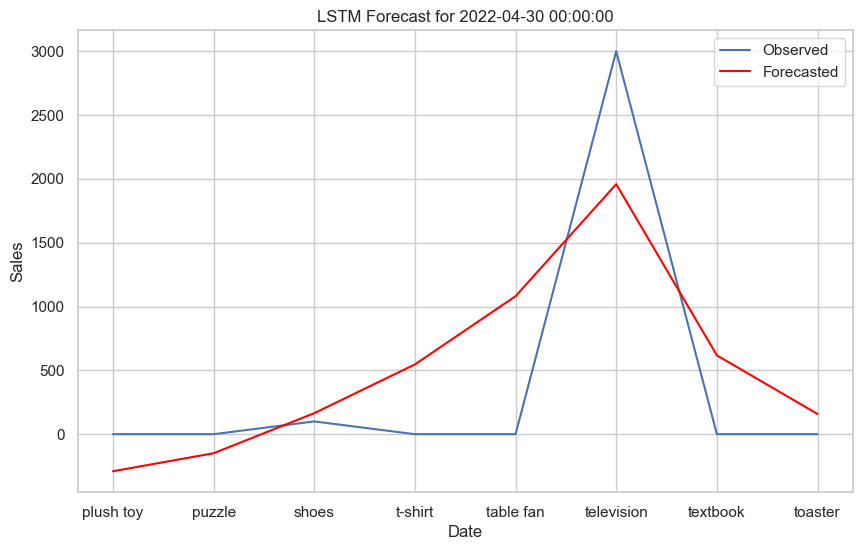

Epoch 1/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 2.2361e-04
Epoch 2/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 1.8131e-04
Epoch 3/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 1.9909e-04
Epoch 4/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 1.9445e-04
Epoch 5/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 1.8189e-04
Epoch 6/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - loss: 1.7780e-04
Epoch 7/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 1.8055e-04
Epoch 8/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 1.8312e-04
Epoch 9/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 1.8219e-04
Epoch 10/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 1.7873e-04
Epoch 11/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 1.7508e-04
Epoch 12/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 1.7339e-04
Epoch 13/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 1.7416e-04
Epoch 14/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 1.7537e-04
Epoch 15/100
1/1 ━━━━━━━━━━━━━━

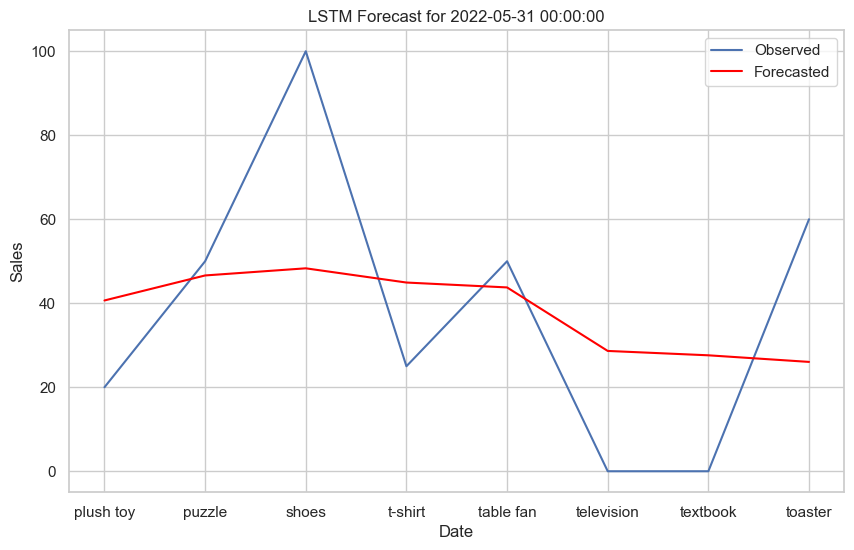

Epoch 1/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 0.0489
Epoch 2/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.0481
Epoch 3/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0475
Epoch 4/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0469
Epoch 5/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0464
Epoch 6/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0459
Epoch 7/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0455
Epoch 8/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0450
Epoch 9/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0447
Epoch 10/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0444
Epoch 11/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0441
Epoch 12/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0439
Epoch 13/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0438
Epoch 14/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0437
Epoch 15/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0436
Epoch 16/100
1/1 ━━━━

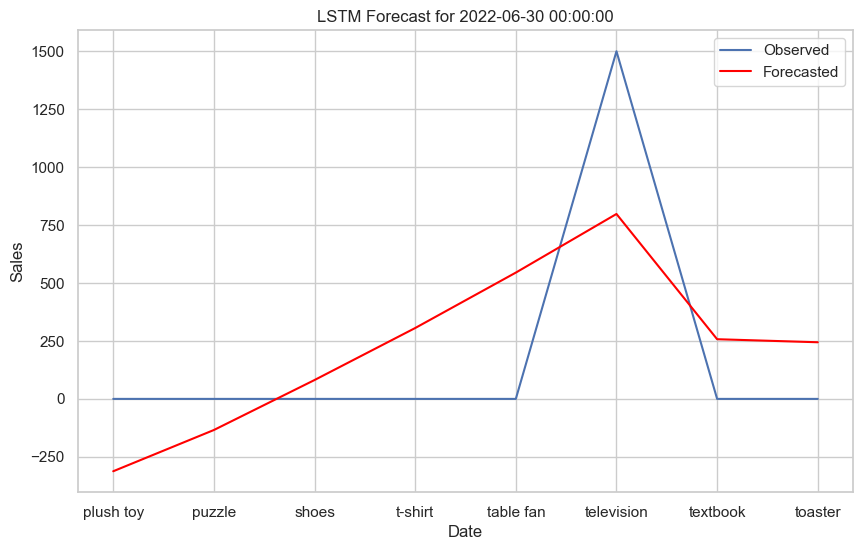

Epoch 1/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 0.0026
Epoch 2/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0022
Epoch 3/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0020
Epoch 4/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0018
Epoch 5/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0016
Epoch 6/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0015
Epoch 7/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0015
Epoch 8/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0014
Epoch 9/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0015
Epoch 10/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0015
Epoch 11/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0015
Epoch 12/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0015
Epoch 13/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0015
Epoch 14/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0015
Epoch 15/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0015
Epoch 16/100
1/1 ━━━━

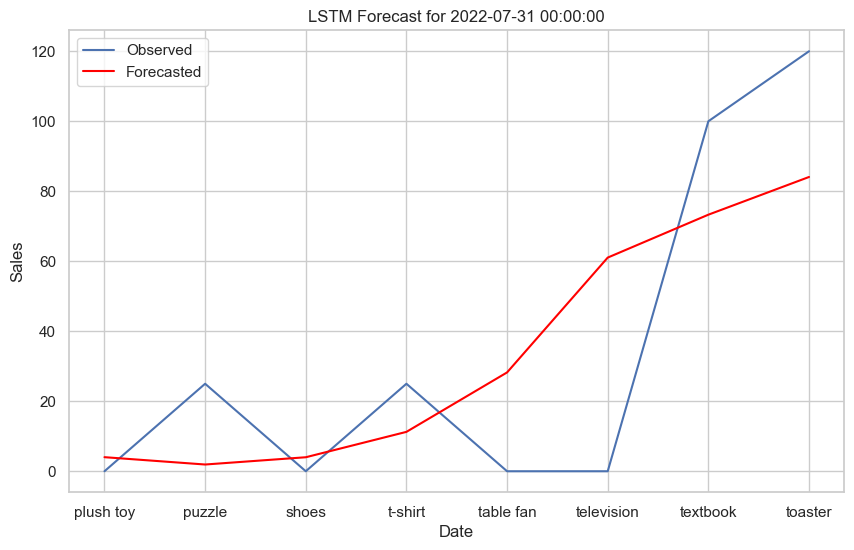

Epoch 1/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 0.1266
Epoch 2/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.1252
Epoch 3/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1240
Epoch 4/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.1229
Epoch 5/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1218
Epoch 6/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.1206
Epoch 7/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1195
Epoch 8/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1185
Epoch 9/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.1174
Epoch 10/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1163
Epoch 11/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1153
Epoch 12/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1142
Epoch 13/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1132
Epoch 14/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1122
Epoch 15/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.1113
Epoch 16/100
1/1 ━━━━

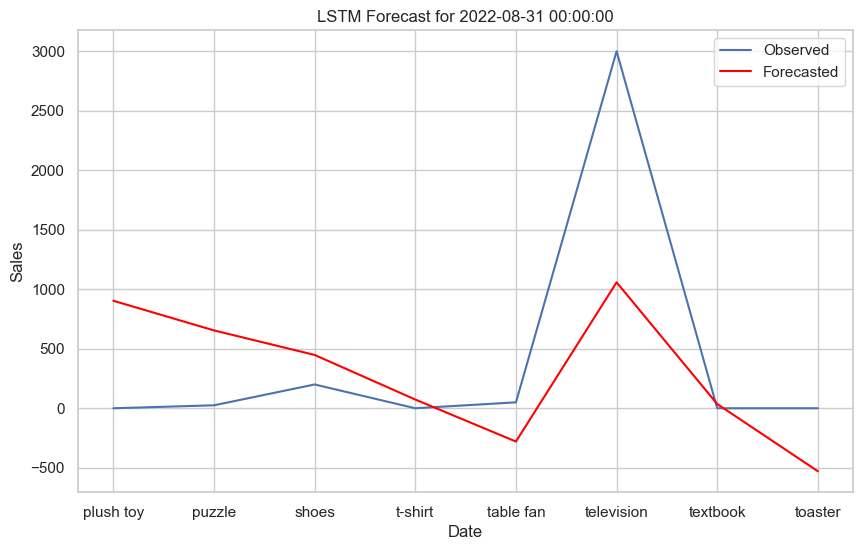

Epoch 1/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 0.0020
Epoch 2/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0015
Epoch 3/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0011
Epoch 4/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 8.8591e-04
Epoch 5/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 8.0500e-04
Epoch 6/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 8.1313e-04
Epoch 7/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 8.5966e-04
Epoch 8/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 9.0028e-04
Epoch 9/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 9.1606e-04
Epoch 10/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 9.0568e-04
Epoch 11/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 8.7830e-04
Epoch 12/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 8.4283e-04
Epoch 13/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 8.0687e-04
Epoch 14/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 7.7672e-04
Epoch 15/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25

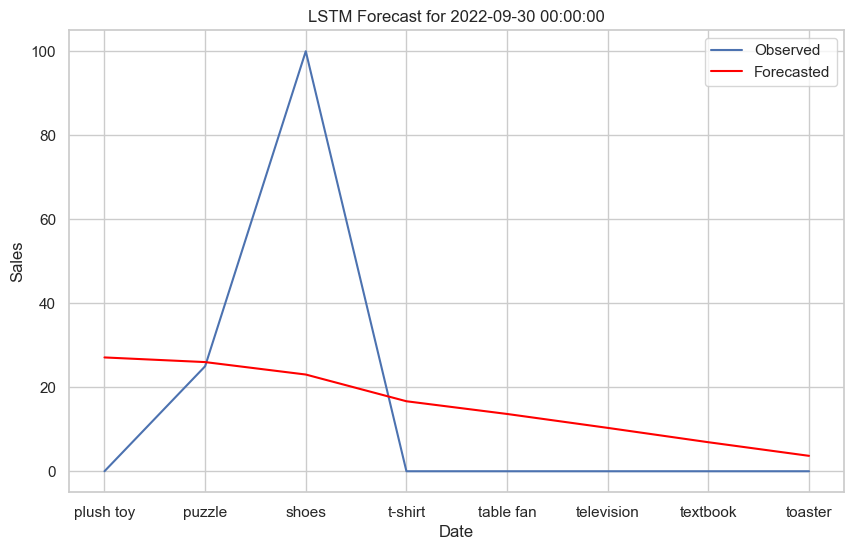

Epoch 1/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 0.0032
Epoch 2/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0028
Epoch 3/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0025
Epoch 4/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0024
Epoch 5/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0024
Epoch 6/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0024
Epoch 7/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0024
Epoch 8/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0024
Epoch 9/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0024
Epoch 10/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0023
Epoch 11/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0023
Epoch 12/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0022
Epoch 13/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0022
Epoch 14/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0022
Epoch 15/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0021
Epoch 16/100
1/1 ━━━━

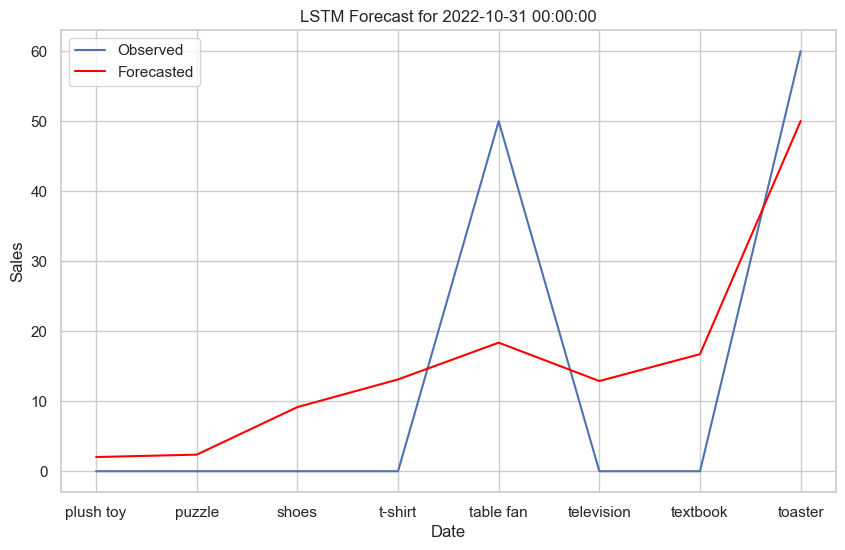

Epoch 1/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 8.6291e-04
Epoch 2/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 5.8301e-04
Epoch 3/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 4.1198e-04
Epoch 4/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 3.2429e-04
Epoch 5/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 2.9805e-04
Epoch 6/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 3.0441e-04
Epoch 7/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 3.1755e-04
Epoch 8/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 3.2144e-04
Epoch 9/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 3.1232e-04
Epoch 10/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 2.9164e-04
Epoch 11/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 2.6427e-04
Epoch 12/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 2.3556e-04
Epoch 13/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 2.0959e-04
Epoch 14/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 1.8989e-04
Epoch 15/100
1/1 ━━━━━━━━━━━━━━

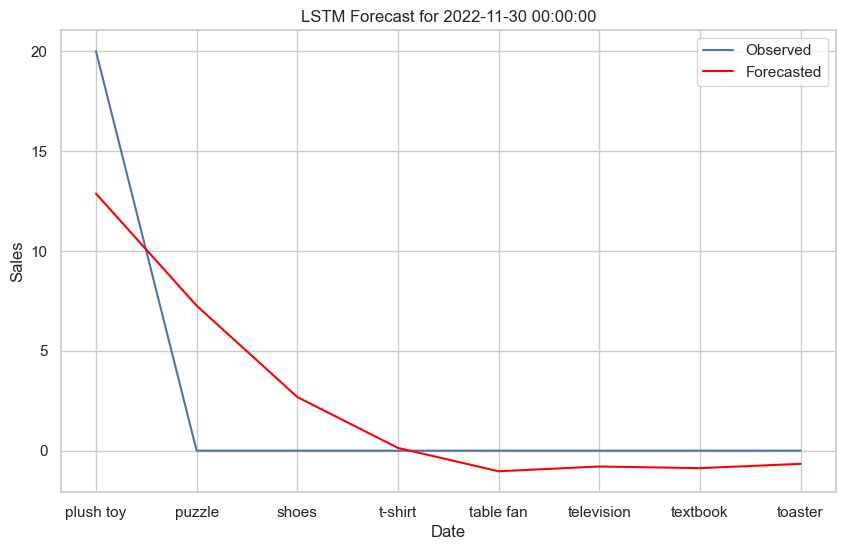

Epoch 1/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.0515
Epoch 2/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0497
Epoch 3/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0481
Epoch 4/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0466
Epoch 5/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0452
Epoch 6/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0438
Epoch 7/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0425
Epoch 8/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0412
Epoch 9/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0400
Epoch 10/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0388
Epoch 11/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0378
Epoch 12/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0370
Epoch 13/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0362
Epoch 14/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0356
Epoch 15/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0353
Epoch 16/100
1/1 ━━━━

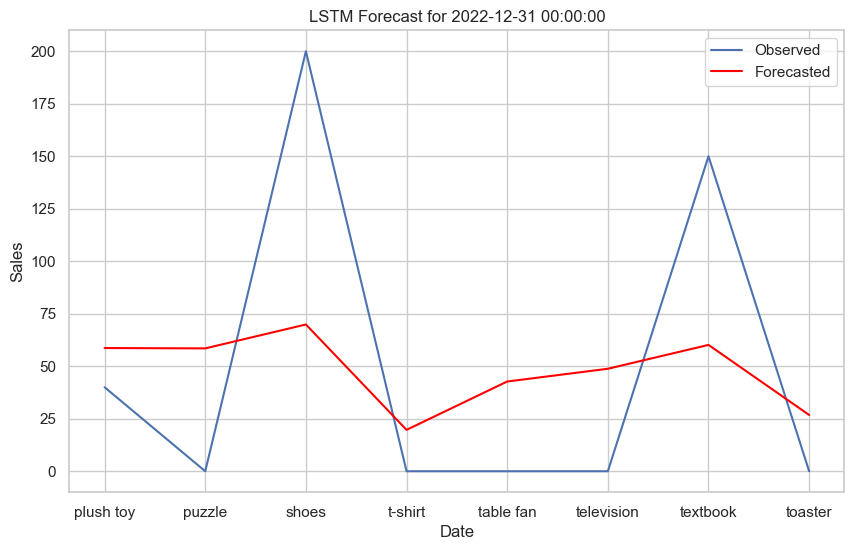

Epoch 1/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 0.1251
Epoch 2/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.1238
Epoch 3/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1225
Epoch 4/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.1211
Epoch 5/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1197
Epoch 6/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.1183
Epoch 7/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.1169
Epoch 8/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1155
Epoch 9/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1141
Epoch 10/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.1129
Epoch 11/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.1117
Epoch 12/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.1106
Epoch 13/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.1096
Epoch 14/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.1088
Epoch 15/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.1081
Epoch 16/100
1/1 ━━━━

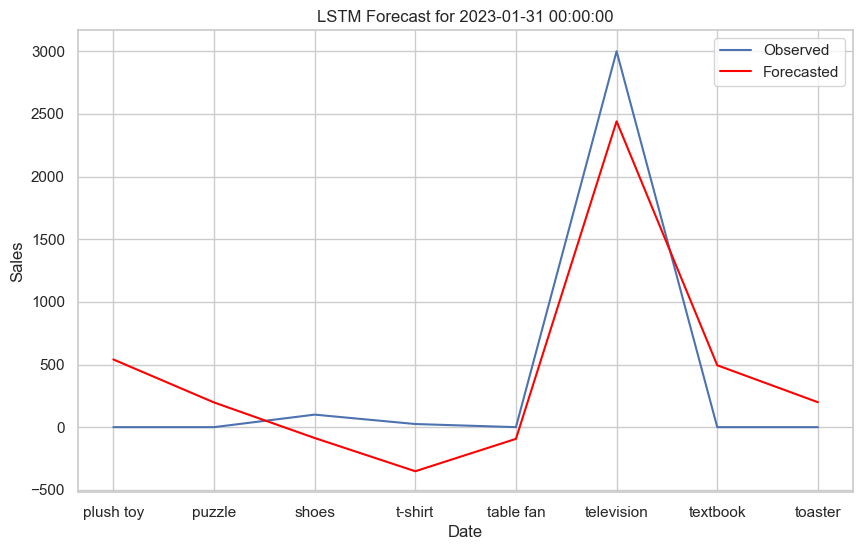

Epoch 1/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 3.3895e-04
Epoch 2/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 1.5779e-04
Epoch 3/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 8.4777e-05
Epoch 4/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 7.7961e-05
Epoch 5/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 1.0237e-04
Epoch 6/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 1.2346e-04
Epoch 7/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 1.2732e-04
Epoch 8/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 1.1699e-04
Epoch 9/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 1.0082e-04
Epoch 10/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 8.6033e-05
Epoch 11/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 7.6158e-05
Epoch 12/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 7.2654e-05
Epoch 13/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 7.4692e-05
Epoch 14/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 7.9515e-05
Epoch 15/100
1/1 ━━━━━━━━━━━━━━

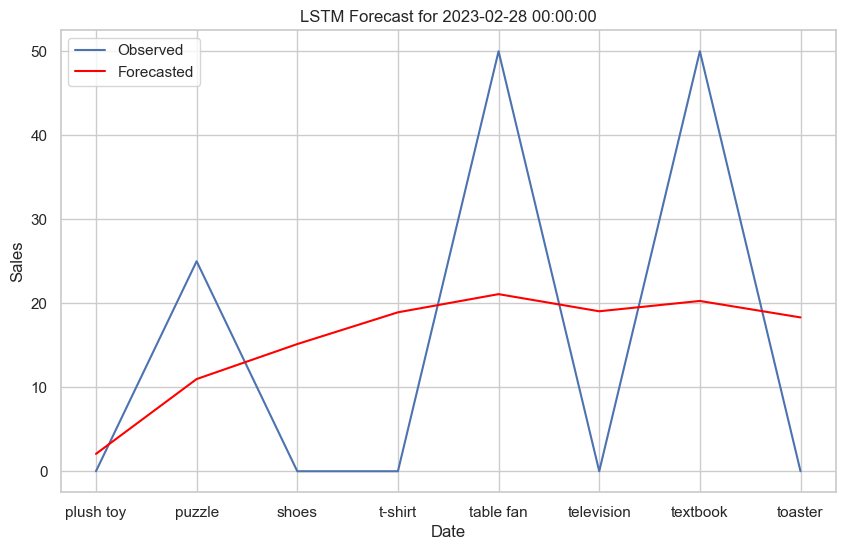

Epoch 1/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step - loss: 0.1740
Epoch 2/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.1707
Epoch 3/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1678
Epoch 4/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1650
Epoch 5/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.1623
Epoch 6/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.1596
Epoch 7/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1570
Epoch 8/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.1545
Epoch 9/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.1519
Epoch 10/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1494
Epoch 11/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1468
Epoch 12/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1444
Epoch 13/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.1419
Epoch 14/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.1396
Epoch 15/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.1372
Epoch 16/100
1/1 ━━━━

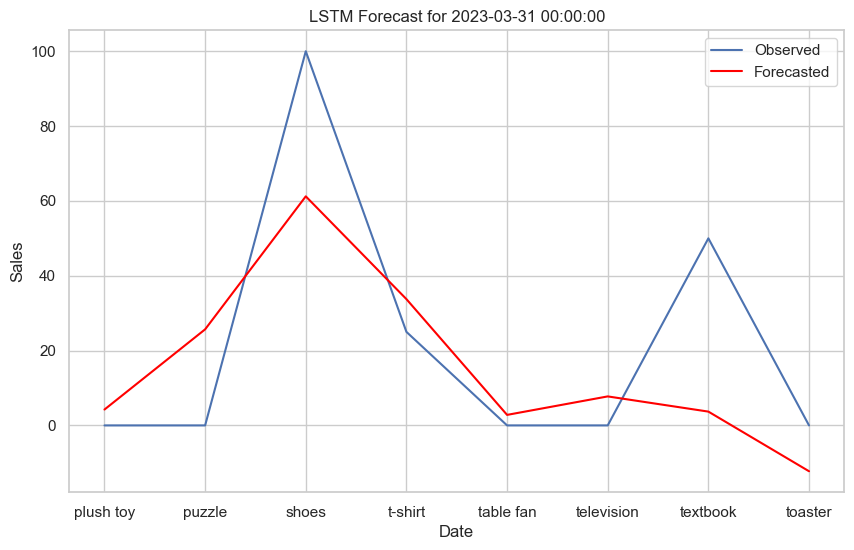

Epoch 1/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 7.8067e-04
Epoch 2/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 6.1817e-04
Epoch 3/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 5.2464e-04
Epoch 4/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 4.7932e-04
Epoch 5/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 4.7205e-04
Epoch 6/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 4.8955e-04
Epoch 7/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 5.0902e-04
Epoch 8/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 5.1507e-04
Epoch 9/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 5.0556e-04
Epoch 10/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 4.8676e-04
Epoch 11/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 4.6663e-04
Epoch 12/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 4.5094e-04
Epoch 13/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 4.4112e-04
Epoch 14/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 4.3733e-04
Epoch 15/100
1/1 ━━━━━━━━━━━━━━

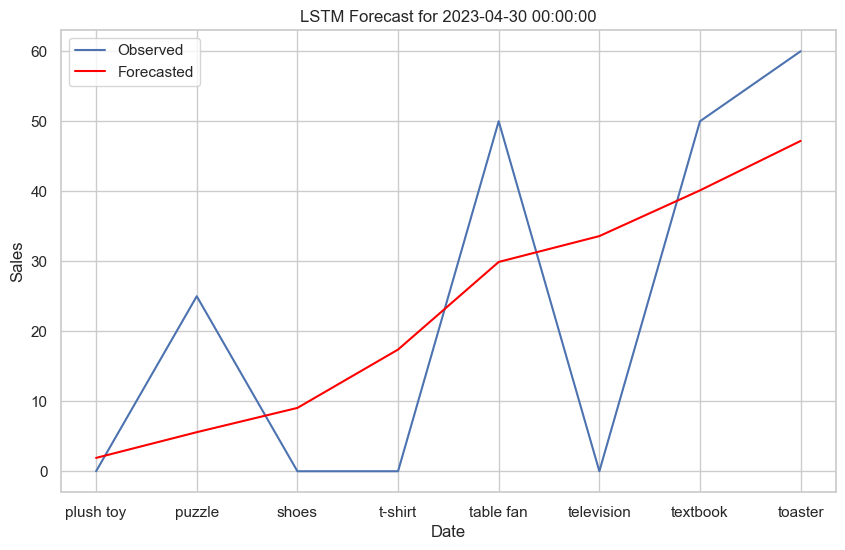

Epoch 1/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 0.0043
Epoch 2/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.0036
Epoch 3/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0031
Epoch 4/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0026
Epoch 5/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0023
Epoch 6/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0020
Epoch 7/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0017
Epoch 8/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0016
Epoch 9/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0015
Epoch 10/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0015
Epoch 11/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0015
Epoch 12/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0016
Epoch 13/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0016
Epoch 14/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0017
Epoch 15/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0017
Epoch 16/100
1/1 ━━━━

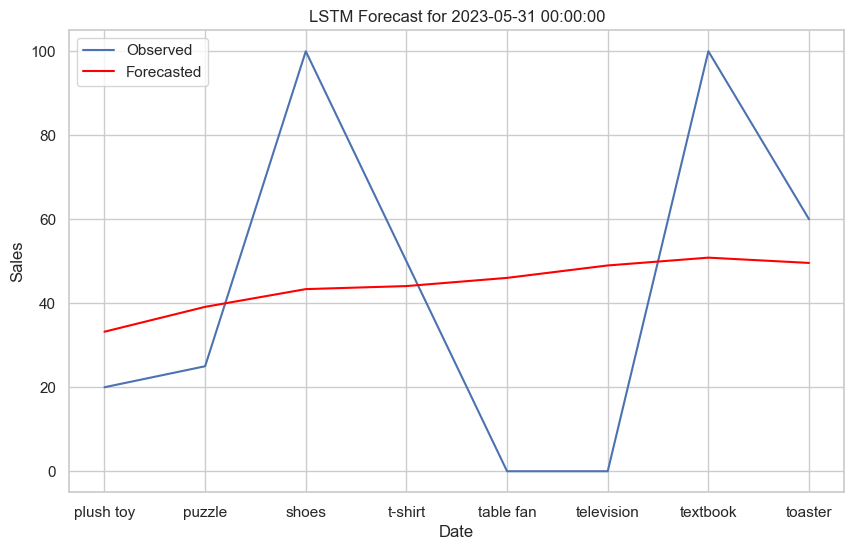

Epoch 1/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 9.6707e-04
Epoch 2/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 7.1255e-04
Epoch 3/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 5.4031e-04
Epoch 4/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 4.4399e-04
Epoch 5/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 4.1572e-04
Epoch 6/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 4.3538e-04
Epoch 7/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 4.7306e-04
Epoch 8/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 5.0163e-04
Epoch 9/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 5.0798e-04
Epoch 10/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 4.9494e-04
Epoch 11/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 4.7070e-04
Epoch 12/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 4.4443e-04
Epoch 13/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 4.2214e-04
Epoch 14/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 4.0699e-04
Epoch 15/100
1/1 ━━━━━━━━━━━━━━

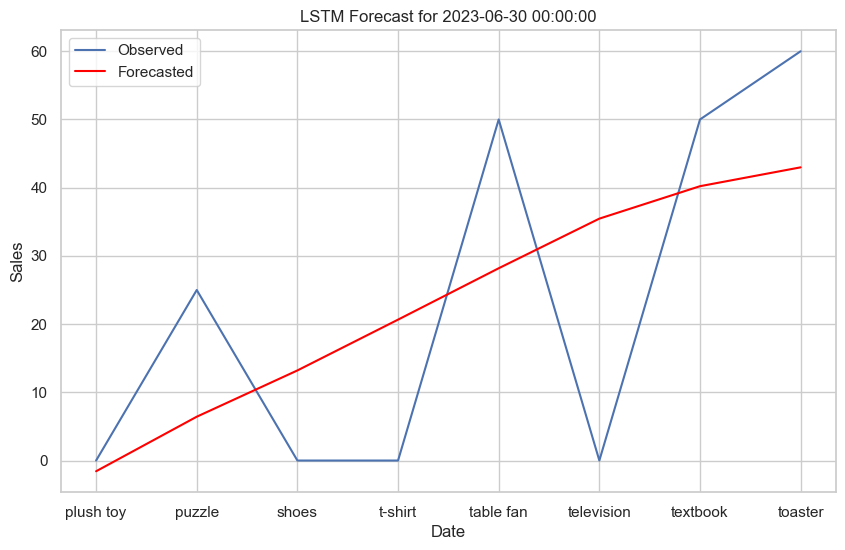

Epoch 1/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 0.1250
Epoch 2/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.1239
Epoch 3/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.1228
Epoch 4/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1218
Epoch 5/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.1207
Epoch 6/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1197
Epoch 7/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1187
Epoch 8/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.1177
Epoch 9/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1167
Epoch 10/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1157
Epoch 11/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1147
Epoch 12/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.1138
Epoch 13/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1129
Epoch 14/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.1121
Epoch 15/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1113
Epoch 16/100
1/1 ━━━━

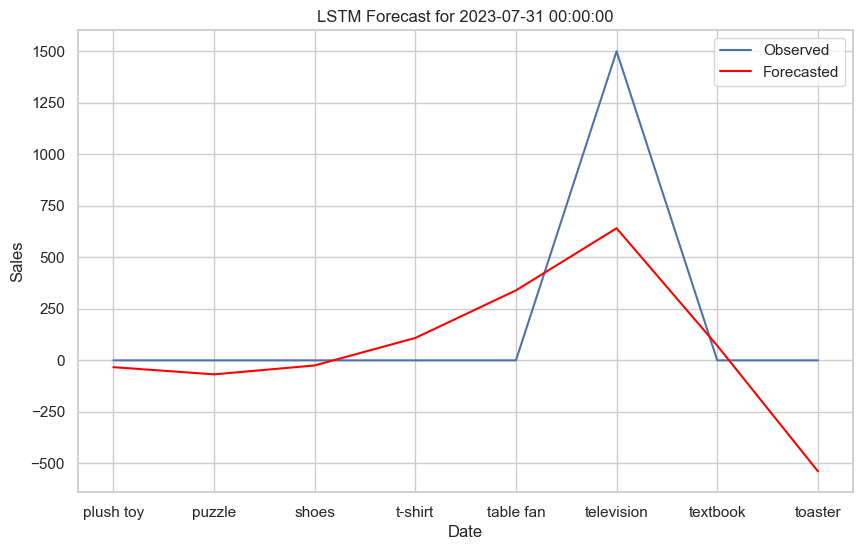

Epoch 1/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 0.1252
Epoch 2/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.1240
Epoch 3/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1228
Epoch 4/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1217
Epoch 5/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.1206
Epoch 6/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1195
Epoch 7/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1184
Epoch 8/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1174
Epoch 9/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1164
Epoch 10/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.1154
Epoch 11/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.1145
Epoch 12/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.1137
Epoch 13/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.1129
Epoch 14/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.1122
Epoch 15/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1115
Epoch 16/100
1/1 ━━━━

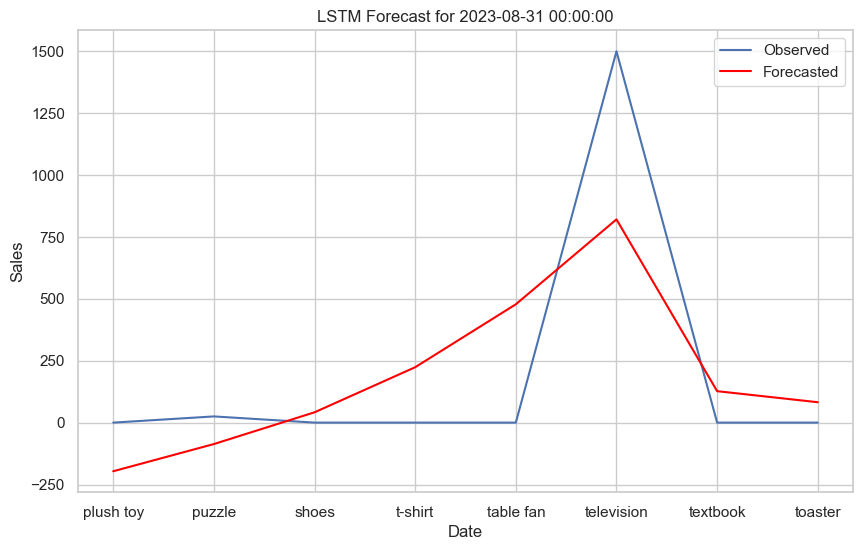

Epoch 1/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 0.0094
Epoch 2/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0087
Epoch 3/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0082
Epoch 4/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0076
Epoch 5/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0072
Epoch 6/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0068
Epoch 7/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0065
Epoch 8/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0063
Epoch 9/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0061
Epoch 10/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0061
Epoch 11/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0061
Epoch 12/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0061
Epoch 13/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0062
Epoch 14/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0063
Epoch 15/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0064
Epoch 16/100
1/1 ━━━━

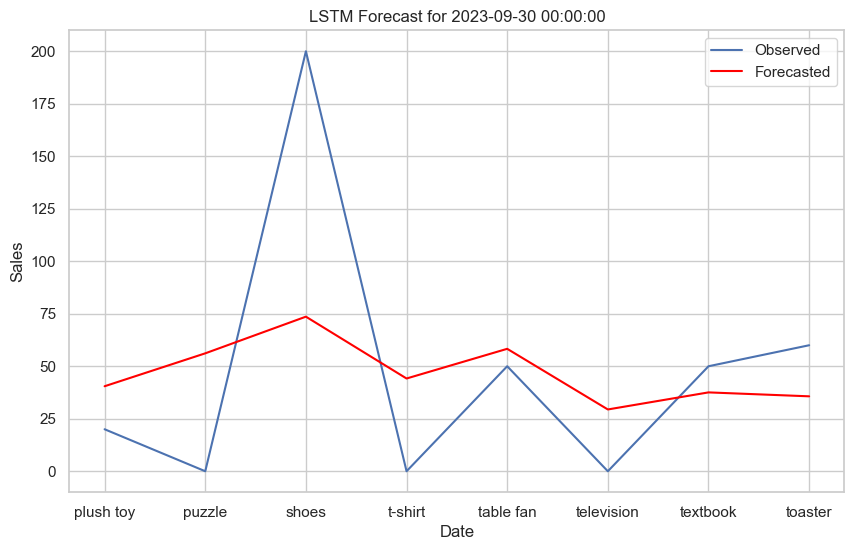

Epoch 1/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.1253
Epoch 2/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.1236
Epoch 3/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.1219
Epoch 4/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1202
Epoch 5/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.1186
Epoch 6/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1170
Epoch 7/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1155
Epoch 8/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.1140
Epoch 9/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1126
Epoch 10/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1113
Epoch 11/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1100
Epoch 12/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.1089
Epoch 13/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.1079
Epoch 14/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.1070
Epoch 15/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.1064
Epoch 16/100
1/1 ━━━━

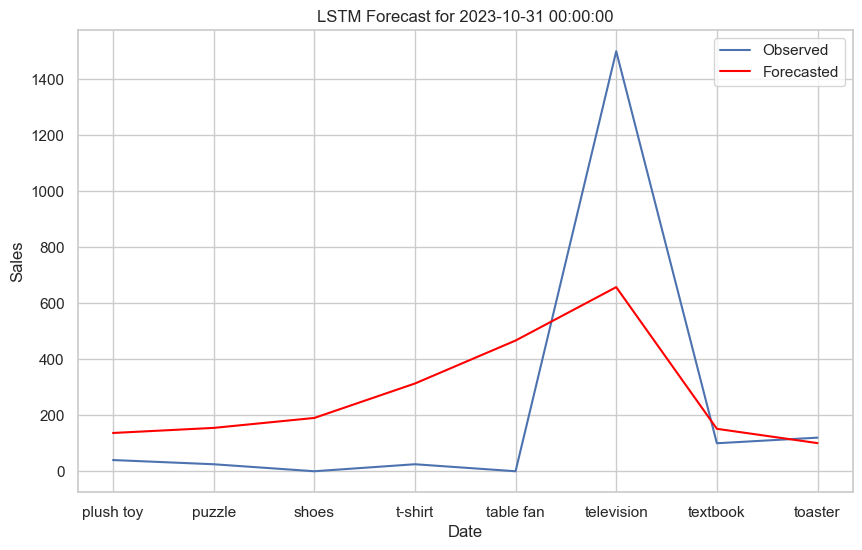

Epoch 1/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 3.7071e-04
Epoch 2/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 3.2450e-04
Epoch 3/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 3.4057e-04
Epoch 4/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 3.4186e-04
Epoch 5/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 3.2769e-04
Epoch 6/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 3.1863e-04
Epoch 7/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 3.1989e-04
Epoch 8/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 3.2298e-04
Epoch 9/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 3.2188e-04
Epoch 10/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 3.1521e-04
Epoch 11/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 3.0909e-04
Epoch 12/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 3.0734e-04
Epoch 13/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 3.0870e-04
Epoch 14/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 3.0896e-04
Epoch 15/100
1/1 ━━━━━━━━━━━━━━

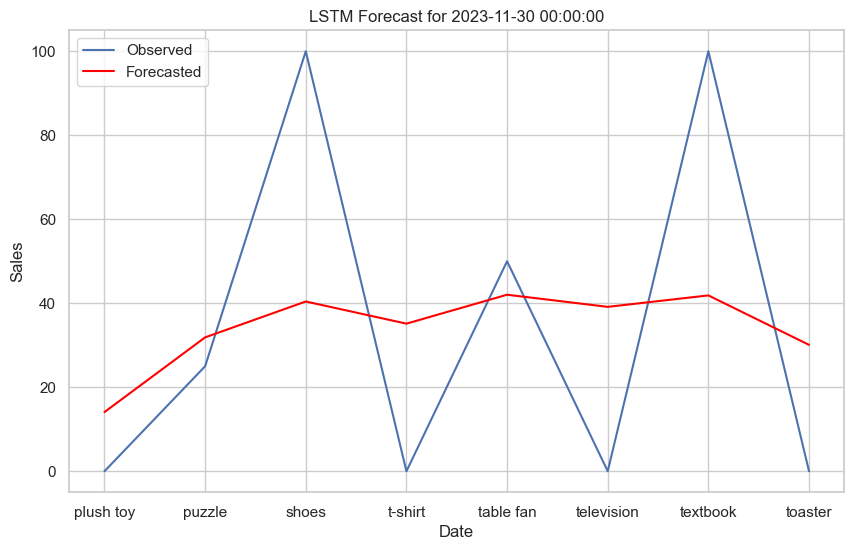

Epoch 1/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 6.7796e-04
Epoch 2/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 5.5768e-04
Epoch 3/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 4.9281e-04
Epoch 4/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 4.7798e-04
Epoch 5/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 4.9250e-04
Epoch 6/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 5.0774e-04
Epoch 7/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 5.0778e-04
Epoch 8/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 4.9566e-04
Epoch 9/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 4.7646e-04
Epoch 10/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 4.5945e-04
Epoch 11/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 4.4820e-04
Epoch 12/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 4.4278e-04
Epoch 13/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 4.4143e-04
Epoch 14/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 4.4170e-04
Epoch 15/100
1/1 ━━━━━━━━━━━━━━

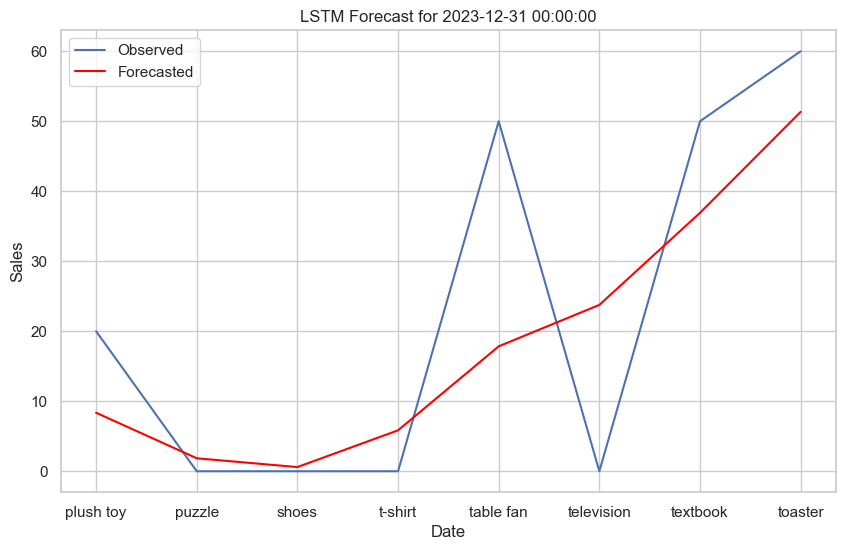

In [216]:
from keras.models import Sequential
from keras.layers import LSTM, Dense
from sklearn.preprocessing import MinMaxScaler
import numpy as np

# Ensure 'OrderConfirmationTime' is a datetime column
data['OrderConfirmationTime'] = pd.to_datetime(data['OrderConfirmationTime'], errors='coerce')

# Aggregate sales by month and product
product_sales = data.groupby(['Product', pd.Grouper(key='OrderConfirmationTime', freq='M')])['Price'].sum().unstack(fill_value=0)

# Forecast sales for each product using LSTM
for product in product_sales.columns:
    product_data = product_sales[product].dropna()
    
    # Scaling the data
    scaler = MinMaxScaler()
    data_scaled = scaler.fit_transform(product_data.values.reshape(-1, 1))
    
    # Prepare data for LSTM
    def prepare_data(series, n_lags):
        X, y = [], []
        for i in range(n_lags, len(series)):
            X.append(series[i-n_lags:i])
            y.append(series[i])
        return np.array(X), np.array(y)

    n_lags = 12
    X, y = prepare_data(data_scaled, n_lags)
    X = X.reshape((X.shape[0], X.shape[1], 1))
    
    # Build the LSTM model
    model = Sequential()
    model.add(LSTM(50, activation='relu', input_shape=(n_lags, 1)))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mse')
    
    # Fit the model
    model.fit(X, y, epochs=100, batch_size=32, verbose=1)
    
    # Make predictions
    predictions = model.predict(X)
    predictions = scaler.inverse_transform(predictions)
    
    # Plot the results
    plt.figure(figsize=(10, 6))
    plt.plot(product_data.index[n_lags:], product_data.values[n_lags:], label='Observed')
    plt.plot(product_data.index[n_lags:], predictions, label='Forecasted', color='red')
    plt.title(f'LSTM Forecast for {product}')
    plt.xlabel('Date')
    plt.ylabel('Sales')
    plt.legend()
    plt.show()
